c:\users\nur izfarwiza\documents\dissertation\advectiongp\advectionGP\wind.py:560: RuntimeWarning: invalid value encountered in cast
  times = ds.variables['time'][:]
c:\users\nur izfarwiza\documents\dissertation\advectiongp\advectionGP\wind.py:560: UserWarning: WARNING: valid_range not used since it
cannot be safely cast to variable data type
  times = ds.variables['time'][:]


✅ Loaded 40 timestamps with shape (40, 11, 16)
Initialising particles...
Diffusing particles...
[⏱️] Time to computeModelRegressors(): 0.40 seconds
Computing SS...
Inverting SS...


C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\890942578.py:95: RuntimeWarning: invalid value encountered in cast
  aod_times = dataset.variables['time'][:]
C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\890942578.py:95: UserWarning: WARNING: valid_range not used since it
cannot be safely cast to variable data type
  aod_times = dataset.variables['time'][:]


Computing meanZ
Done
[⏱️] Time to computeZDistribution(): 0.59 seconds
Initialising particles...
Particle shape:
(5, 36000, 3)
Diffusing particles...
cache miss, computing source from phi...
Coords NONE!
Computing over coords...
(3, 40, 30, 30)
Computing Source from Phi...
[⏱️] Time to computeConcentration(): 15.32 seconds
[✅] Total source inference pipeline took 16.31 seconds


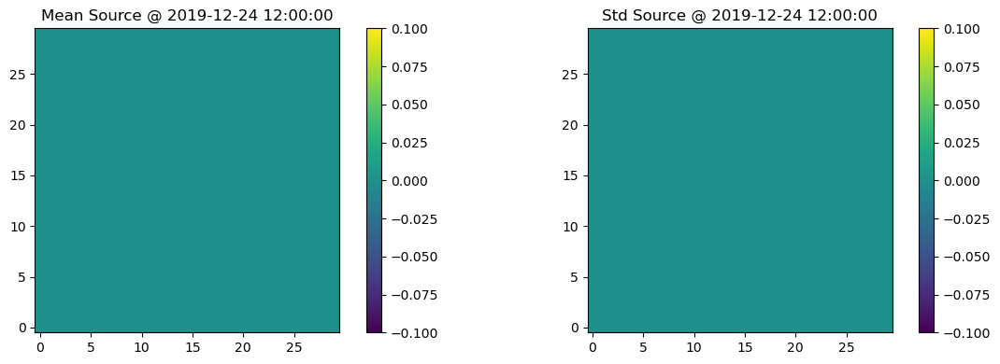

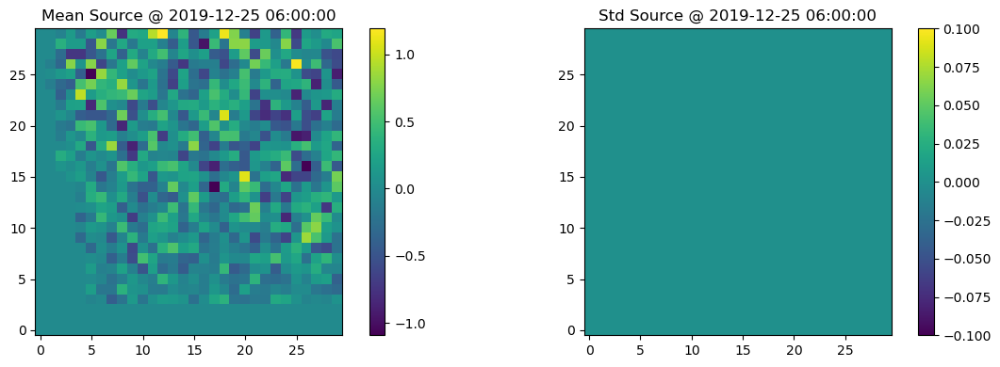

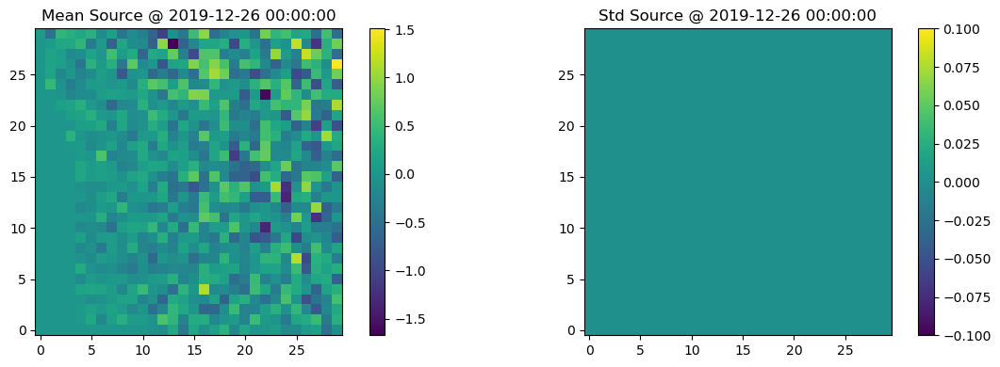

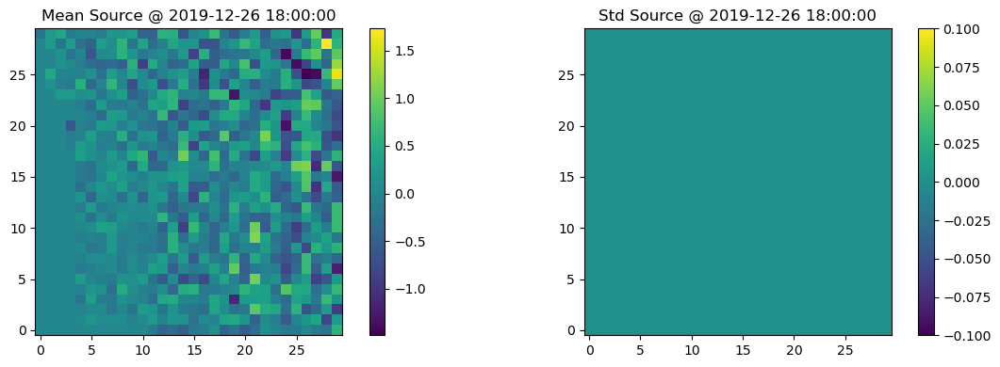

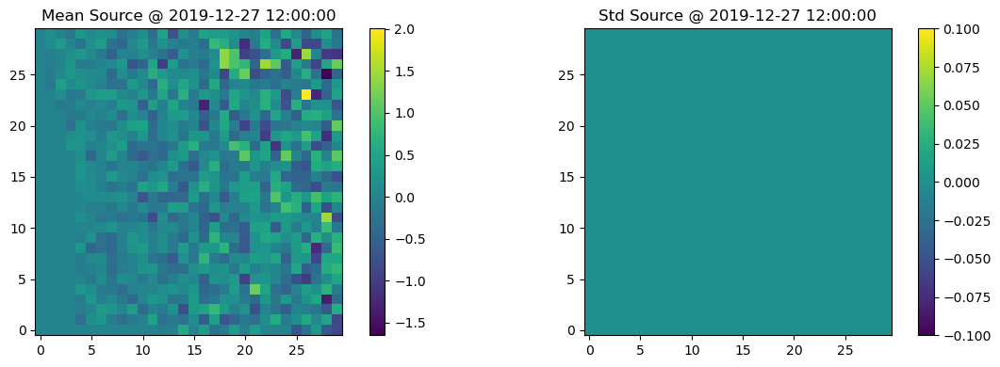

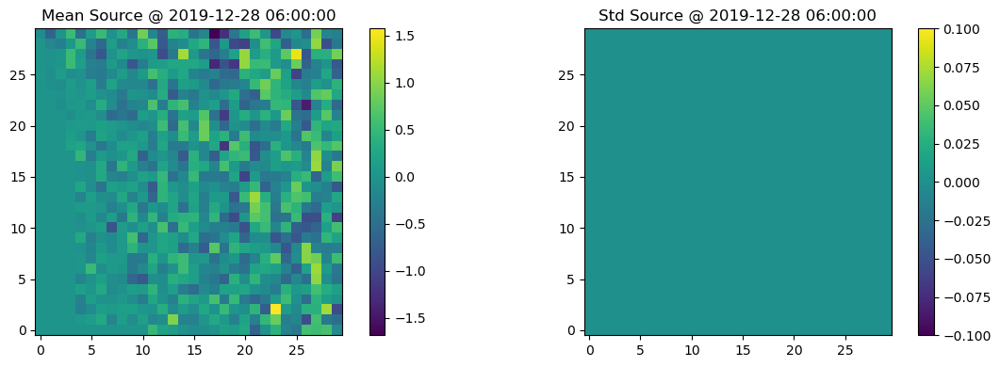

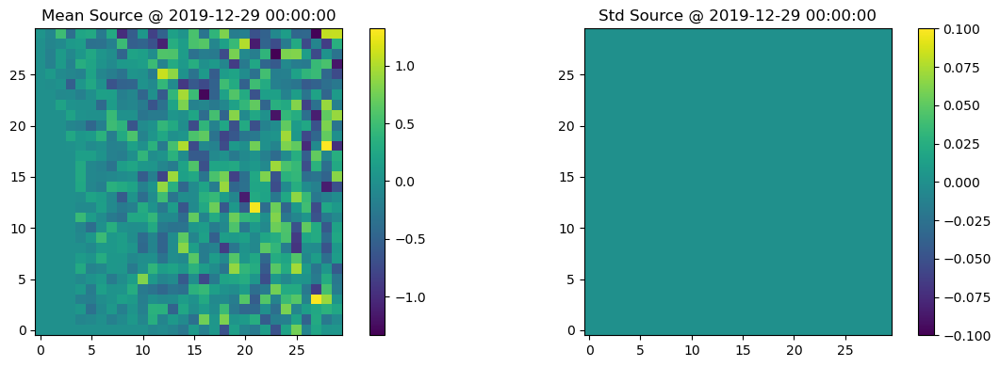

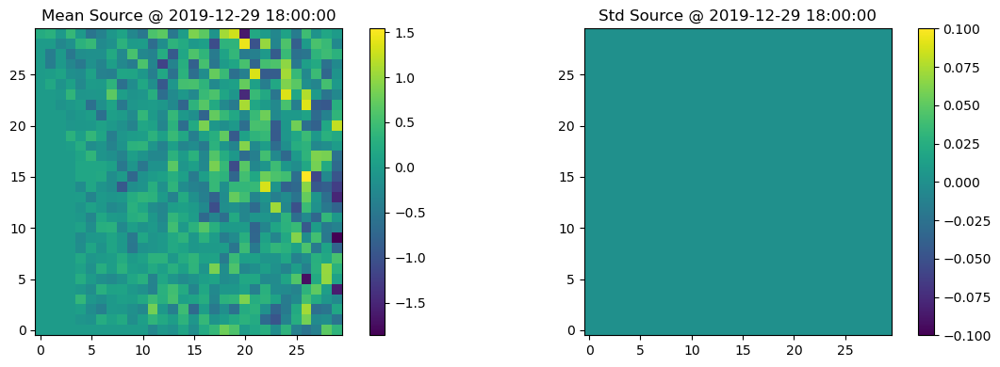

In [10]:
from pyproj import Proj
import numpy as np
from netCDF4 import Dataset
from scipy.stats import norm
from advectionGP.kernels import EQ
from advectionGP.models.mfmodels import MeshFreeAdjointAdvectionDiffusionModel as Model
from advectionGP.wind import WindSimple, RealWindBinned, RealWindNearestNeighbour, RealWindHybrid, FastWindGrid
from advectionGP.sensors import RemoteSensingModel
from advectionGPdatasets import proposeboundary
import matplotlib.pyplot as plt
import time
from datetime import datetime, timedelta

# === Step 1: Define UTM and Spatial Domain ===
proj = Proj(proj='utm', zone=56, south=True, ellps='WGS84')
xmin, ymin = proj(140.5, -39)
xmax, ymax = proj(150, -34)

# === Step 2: Generate Observation Locations ===
# Create evenly spaced 5 x-centers and 10 y-centers in UTM space
x_centers = np.linspace(xmin, xmax, 5)
y_centers = np.linspace(ymin, ymax, 10)

# Set time range for each observation (last 3 hours of the day)
t_start, t_end = 0, 1440
t_start_sec, t_end_sec = 0, 5 *24 *60 *60 #5 Days
sensors = RemoteSensingModel(num_particles=3, t_start=t_start_sec, t_end=t_end_sec)

# Generate obsLocs as [t_start, t_end, x, y] combinations (shape = 50, 4)
obsLocs = []
for poly in sensors.grid_polygons:
    centroid = poly.centroid
    x, y = centroid.xy[0][0], centroid.xy[1][0]
    obsLocs.append([t_start_sec, t_end_sec, x, y])

obsLocs = np.array(obsLocs)

boundary = proposeboundary(obsLocs)
padding = 50000
boundary = (np.array(boundary[0]), np.array(boundary[1]))
boundary[0][1:] -= padding
boundary[1][1:] += padding

# === Step 3: Sensor Model (no longer needs getHs) ===
# sensors = RemoteSensingModel(num_particles=10)

# === Step 4: Setup Kernel & Wind ===
N_feat = 1500
k = EQ(10, 1)
res = [40, 30, 30]
noiseSD = 0.001
k_0 = 0.5
windmodel = FastWindGrid(start_date="2019-12-25", num_days=5)
# windmodel = WindSimple(1, 1)

# === Step 5: Initialize Mesh-Free Model ===
mInfer = Model(
    resolution=res,
    boundary=boundary,
    N_feat=N_feat,
    noiseSD=noiseSD,
    kernel=k,
    sensormodel=sensors,
    windmodel=windmodel,
    k_0=k_0
)

# === Step 6: Generate Regressor Matrix ===
start_time = time.time()
mInfer.computeModelRegressors()
num_obs = mInfer.X.shape[1]
regressor_time = time.time()
print(f"[⏱️] Time to computeModelRegressors(): {regressor_time - start_time:.2f} seconds")

# === Step 7: Generate Synthetic Observations ===
# Load the NetCDF file
file_path = r"C:\Users\Nur Izfarwiza\Documents\Dissertation\AOD\MERRA2_400.inst3_2d_gas_Nx.20191230.nc4"
dataset = Dataset(file_path, 'r')

from pyproj import Proj, Transformer

# Your UTM projection (Zone 56S)
proj_utm = Proj(proj='utm', zone=56, south=True, ellps='WGS84')
proj_wgs84 = Proj(proj='latlong', datum='WGS84')
transformer = Transformer.from_proj(proj_utm, proj_wgs84)

# Convert all (x, y) to (lon, lat)
sensor_latlons = []
for poly in sensors.grid_polygons:
    centroid = poly.centroid
    x, y = centroid.xy[0][0], centroid.xy[1][0]
    lon, lat = transformer.transform(x, y)
    sensor_latlons.append((lat, lon))

aod_times = dataset.variables['time'][:]
t_index = np.argmin(np.abs(aod_times - t_start))

lats = dataset.variables['lat'][:]
lons = dataset.variables['lon'][:]
aod_data = dataset.variables['AODANA'][t_index]  # shape (361, 576)

Y = []
for lat, lon in sensor_latlons:
    lat_idx = np.argmin(np.abs(lats - lat))
    lon_idx = np.argmin(np.abs(lons - lon))
    value = aod_data[lat_idx, lon_idx]
    Y.append(value)

Y = np.array(Y)
Y = np.nan_to_num(Y, nan=0.0)
Y = (Y - np.min(Y)) / (np.max(Y) - np.min(Y) + 1e-6)

# === Step 8: Inference ===
meanZ, covZ = mInfer.computeZDistribution(Y)
inference_time = time.time()
print(f"[⏱️] Time to computeZDistribution(): {inference_time - regressor_time:.2f} seconds")

# === Step 9: Grid Setup for Visualization ===
t_vals = np.linspace(boundary[0][0], boundary[1][0], res[0])
x_vals = np.linspace(boundary[0][1], boundary[1][1], res[1])
y_vals = np.linspace(boundary[0][2], boundary[1][2], res[2])
coords = np.stack(np.meshgrid(t_vals, x_vals, y_vals, indexing='ij'), axis=-1)
coords = coords.reshape(-1, 3)

# === Step 10: Forward Simulation ===
sourcemean, sourcevar, all_samples = mInfer.computeConcentration(
    meanZ=meanZ,
    covZ=covZ,
    Nsamps=1,
    Nparticles=5,
    coords=coords,
    interpolateSource=True
)
forward_time = time.time()
print(f"[⏱️] Time to computeConcentration(): {forward_time - inference_time:.2f} seconds")
# === Total Pipeline Timing ===
print(f"[✅] Total source inference pipeline took {forward_time - start_time:.2f} seconds")

# === Step 11: Plotting ===
# Step setup
sourcemean = sourcemean.reshape(res)
sourcevar = sourcevar.reshape(res)
total_time_seconds = boundary[1][0] - boundary[0][0]
dt_seconds = total_time_seconds / res[0]
base_time = datetime(2019, 12, 25, 0, 0, 0)  # Adjust to your dataset's base time

# Loop through time steps
for t_index in range(0, res[0], 5):
    real_seconds = boundary[0][0] + t_index * dt_seconds
    real_datetime = base_time + timedelta(seconds=int(real_seconds))
    timestamp_label = real_datetime.strftime("%Y-%m-%d %H:%M:%S")

    plt.figure(figsize=(12, 4))
    
    plt.subplot(1, 2, 1)
    plt.title(f"Mean Source @ {timestamp_label}")
    plt.imshow(sourcemean[t_index], origin='lower')
    plt.colorbar()

    plt.subplot(1, 2, 2)
    plt.title(f"Std Source @ {timestamp_label}")
    plt.imshow(np.sqrt(sourcevar[t_index]), origin='lower')
    plt.colorbar()
    
    plt.tight_layout()
    plt.show()



In [11]:
print("Boundary start seconds:", boundary[0][0])
print("Start time:", boundary[0][0])
print("End time:", boundary[1][0])
print("X range:", boundary[0][1], "to", boundary[1][1])
print("Y range:", boundary[0][2], "to", boundary[1][2])



Boundary start seconds: -43200.0
Start time: -43200.0
End time: 475200.0
X range: -680966.0 to 42290.0
Y range: 5563977.0 to 5990697.0


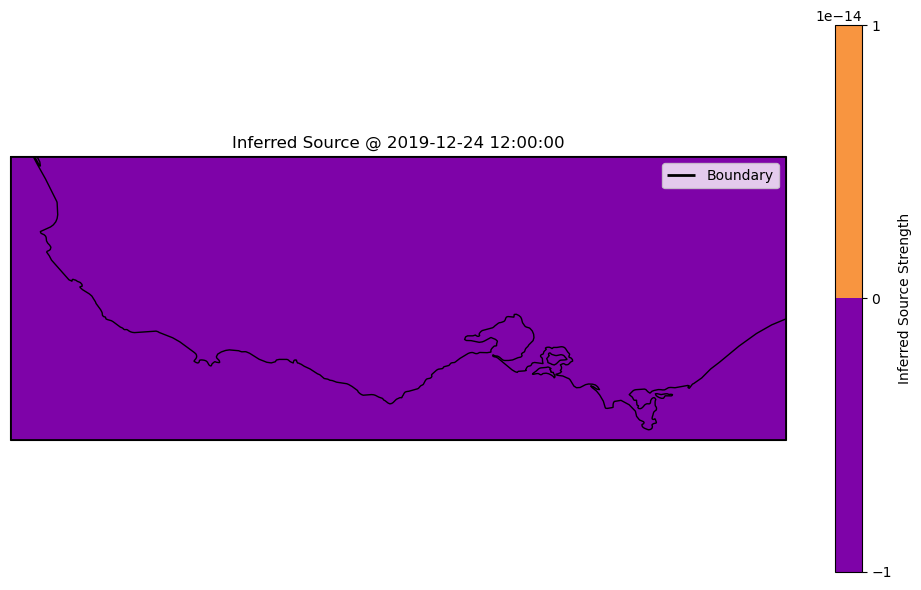

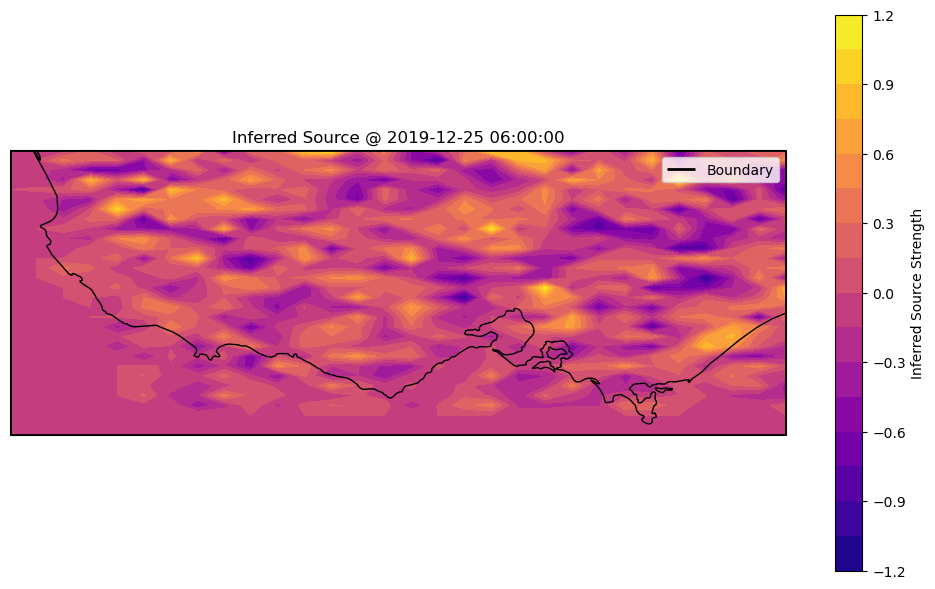

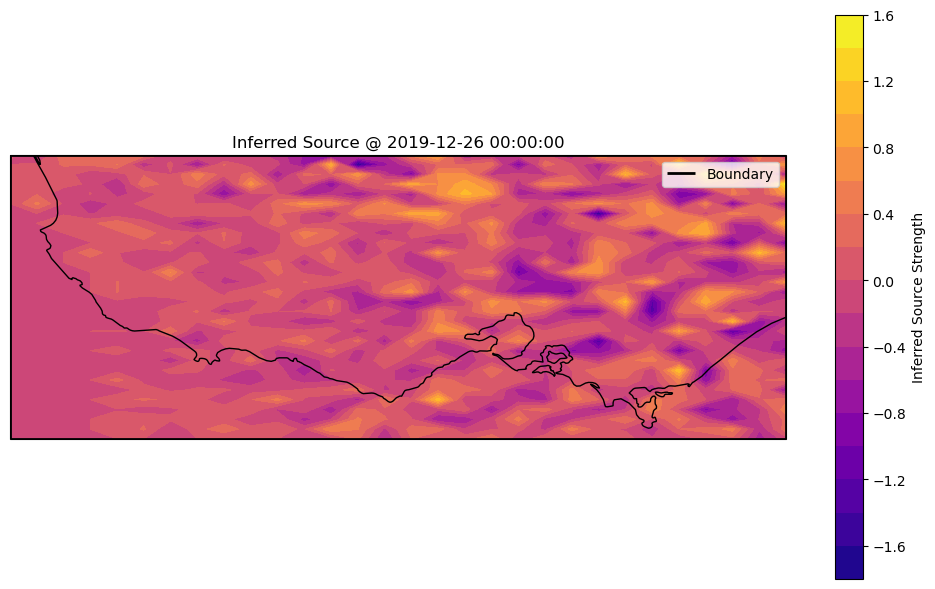

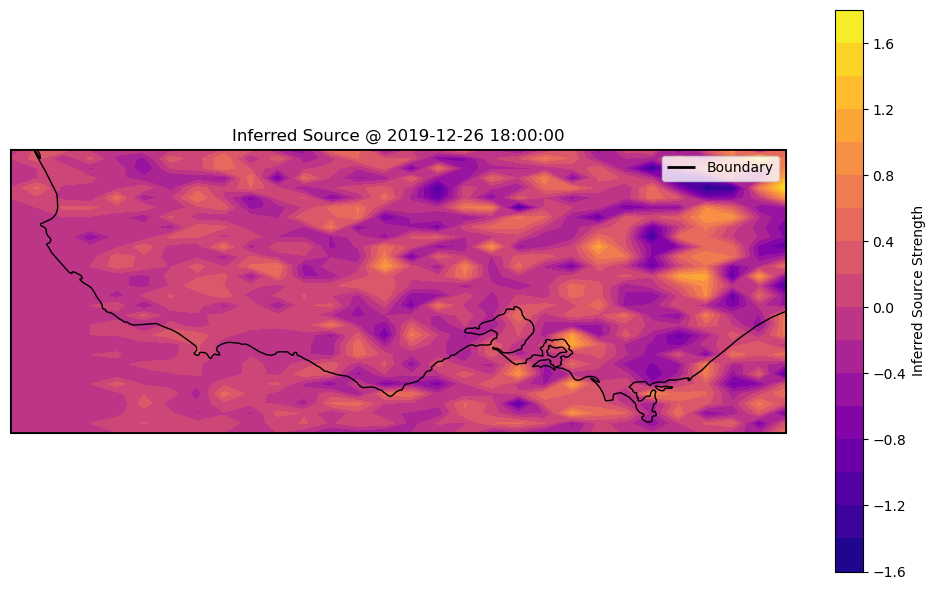

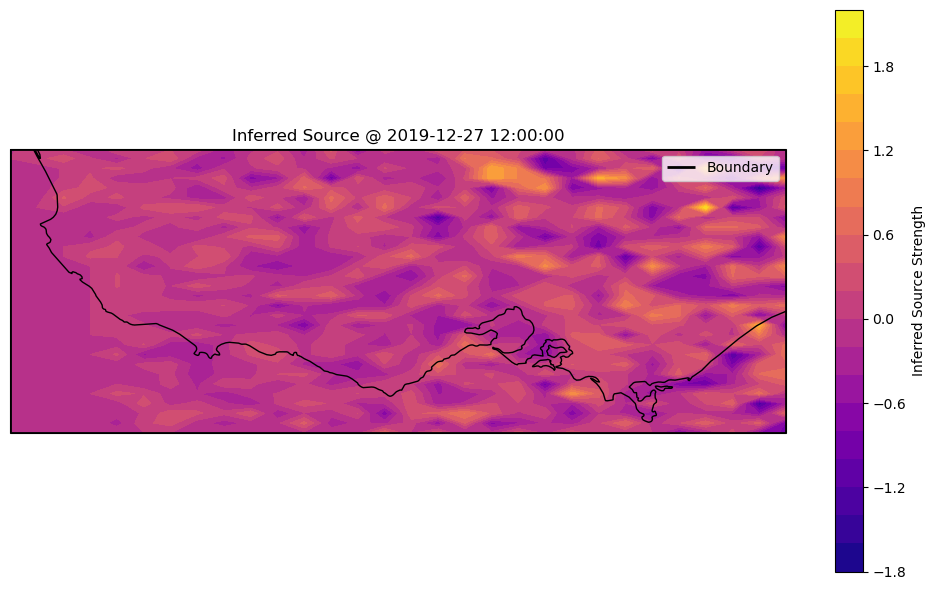

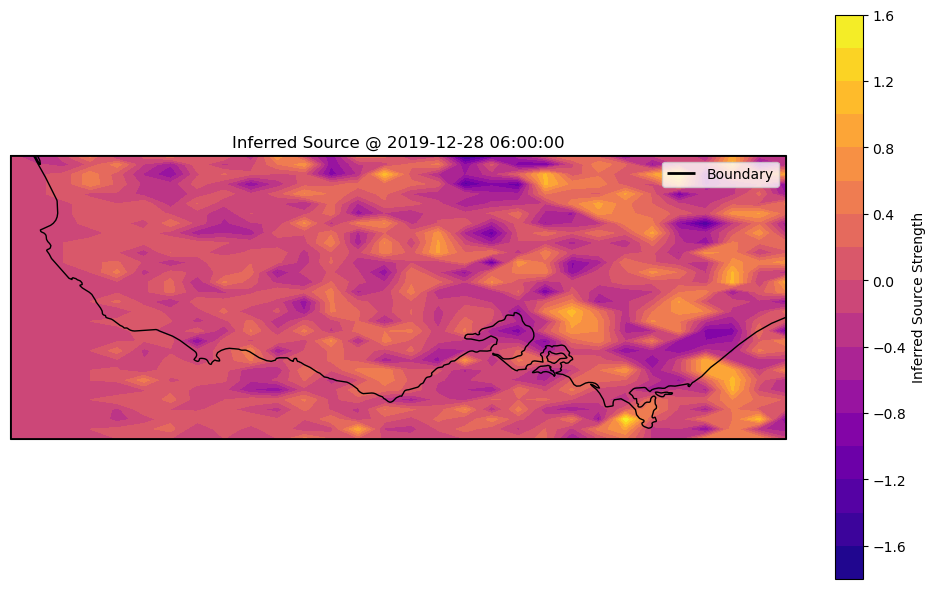

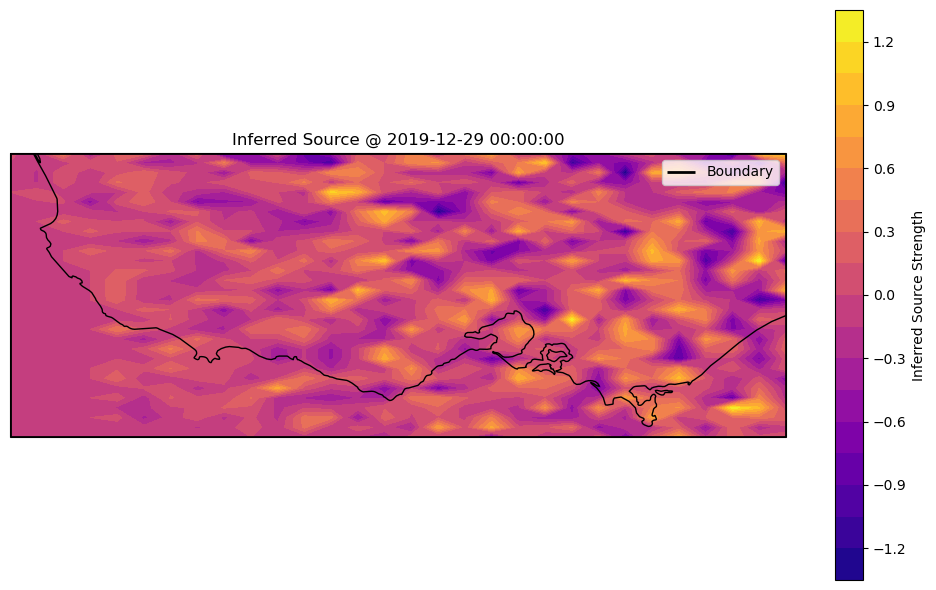

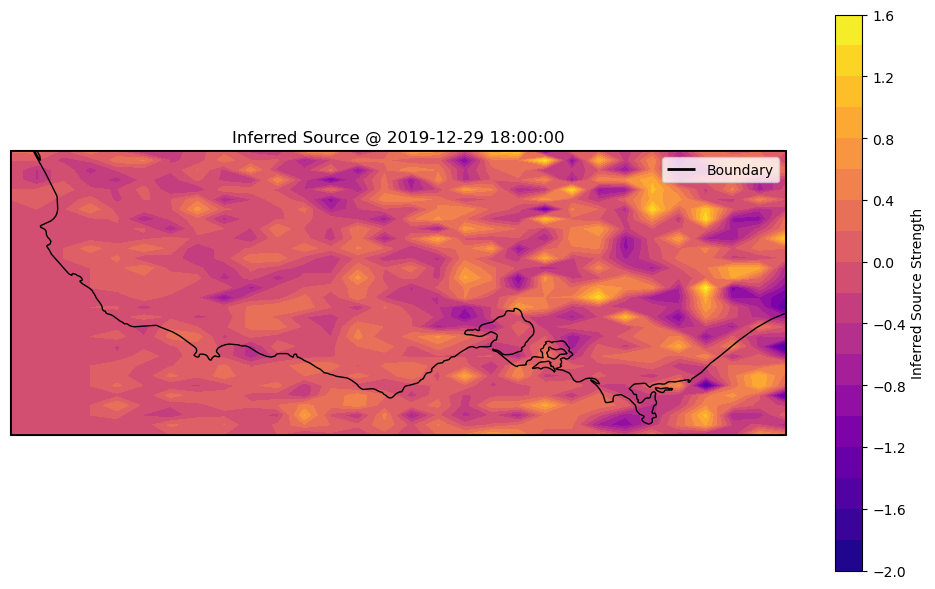

In [18]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from shapely.geometry import box
import geopandas as gpd
from pyproj import Transformer

# Setup transformer from UTM to lat/lon
transformer = Transformer.from_proj(proj, "epsg:4326", always_xy=True)

# Convert boundary UTM to lat/lon
tmin, xmin, ymin = boundary[0]
tmax, xmax, ymax = boundary[1]
lon_min, lat_min = transformer.transform(xmin, ymin)
lon_max, lat_max = transformer.transform(xmax, ymax)

# Create lat/lon bins for the sourcemean projection
lat_bins = np.linspace(lat_min, lat_max, res[1])
lon_bins = np.linspace(lon_min, lon_max, res[2])
lon_grid, lat_grid = np.meshgrid(lon_bins, lat_bins)

# Plot loop
for t_index in range(0, res[0], 5):
    real_seconds = boundary[0][0] + t_index * dt_seconds
    real_datetime = base_time + timedelta(seconds=int(real_seconds))
    timestamp_label = real_datetime.strftime("%Y-%m-%d %H:%M:%S")

    fig, ax = plt.subplots(figsize=(10, 6), subplot_kw={'projection': ccrs.PlateCarree()})
    ax.set_extent([lon_min, lon_max, lat_min, lat_max])
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS)
    ax.add_feature(cfeature.LAND, facecolor='lightgray')

    # Inferred Source Overlay
    cf = ax.contourf(lon_grid, lat_grid, sourcemean[t_index], levels=20, cmap='plasma', transform=ccrs.PlateCarree())
    plt.colorbar(cf, ax=ax, label='Inferred Source Strength')

    # Draw bounding box
    bbox = box(lon_min, lat_min, lon_max, lat_max)
    gpd.GeoSeries([bbox]).boundary.plot(ax=ax, edgecolor='black', linewidth=2, label="Boundary")

    ax.set_title(f"Inferred Source @ {timestamp_label}")
    ax.legend()
    plt.tight_layout()
    plt.show()


C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_37972\2699844562.py:50: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


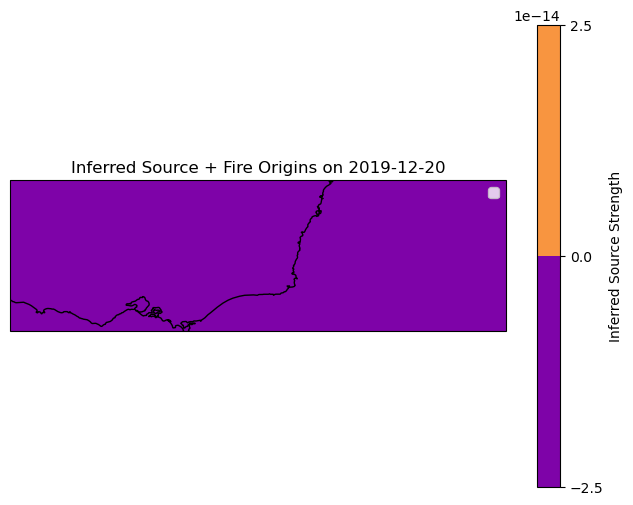

C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_37972\2699844562.py:50: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


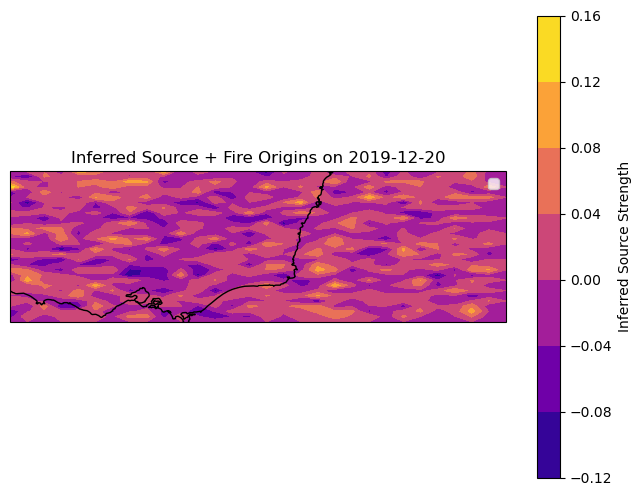

C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_37972\2699844562.py:50: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


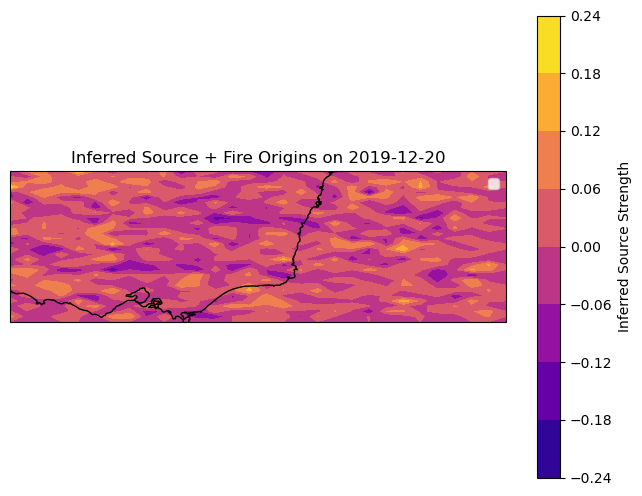

C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_37972\2699844562.py:50: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


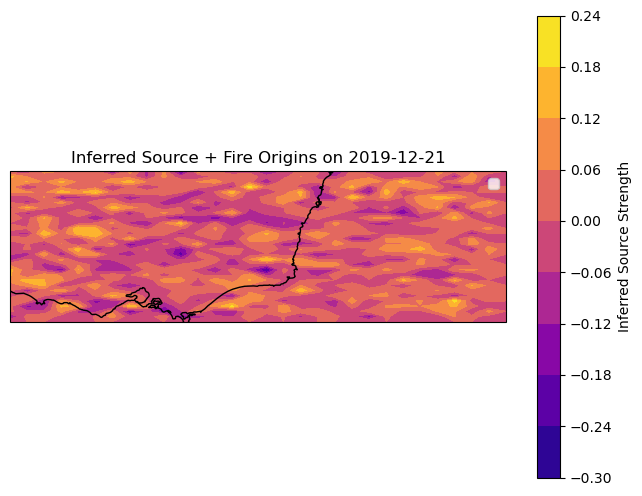

C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_37972\2699844562.py:50: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


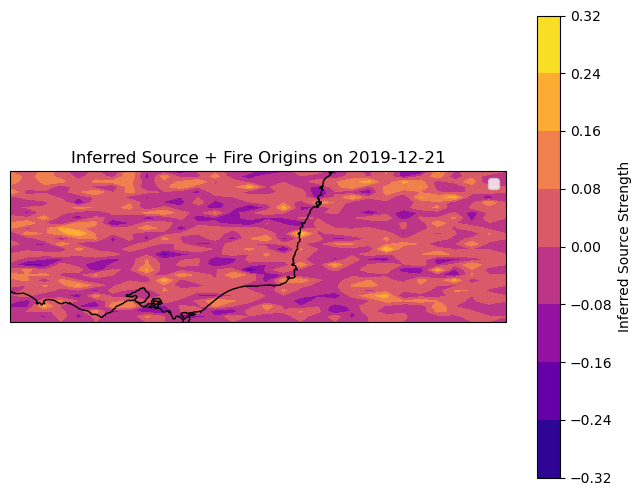

C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_37972\2699844562.py:50: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


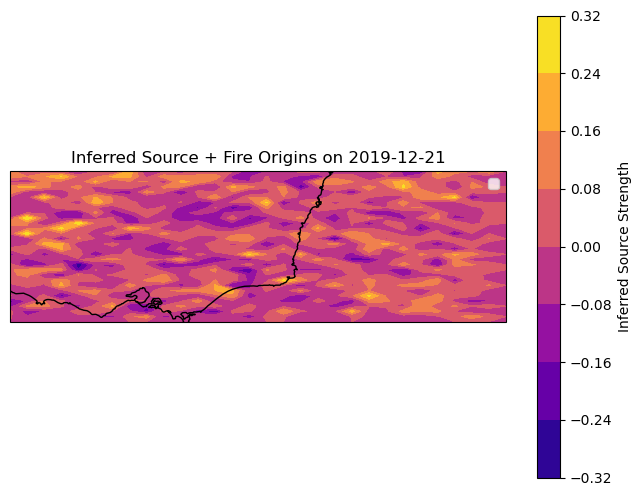

C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_37972\2699844562.py:50: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


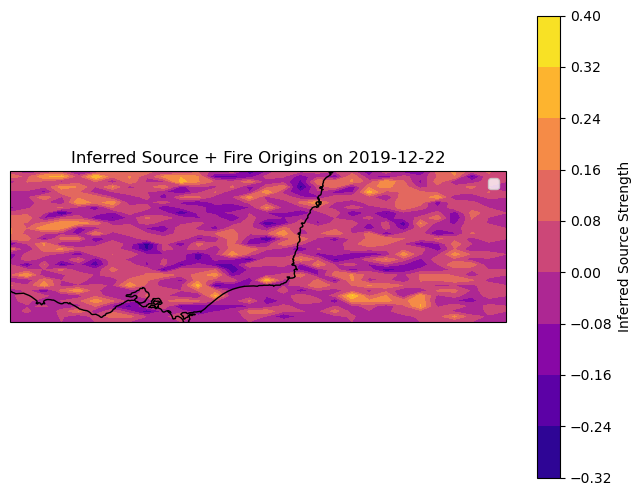

C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_37972\2699844562.py:50: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


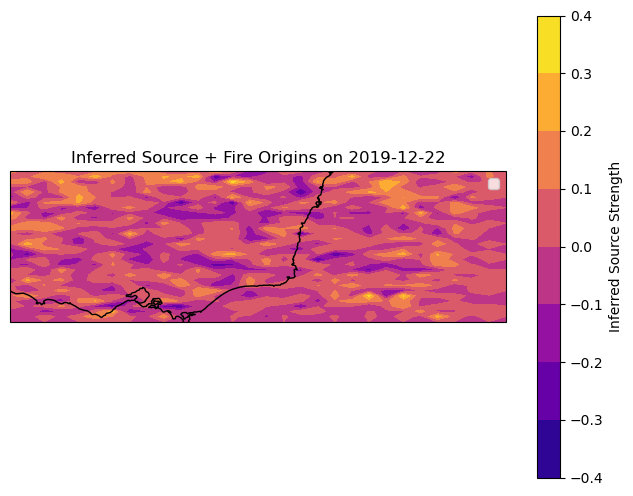

C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_37972\2699844562.py:50: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


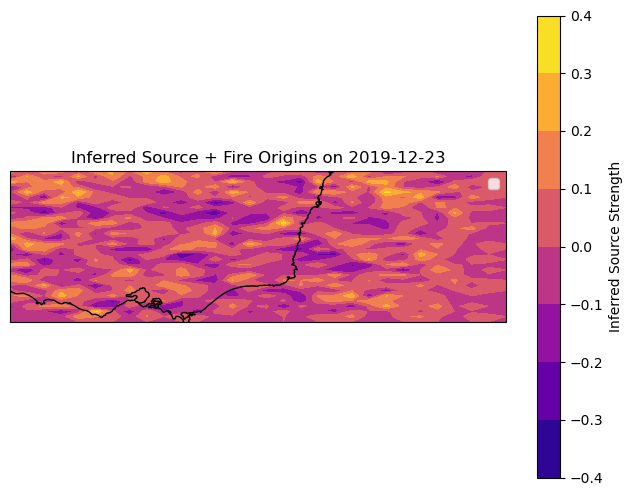

C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_37972\2699844562.py:50: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


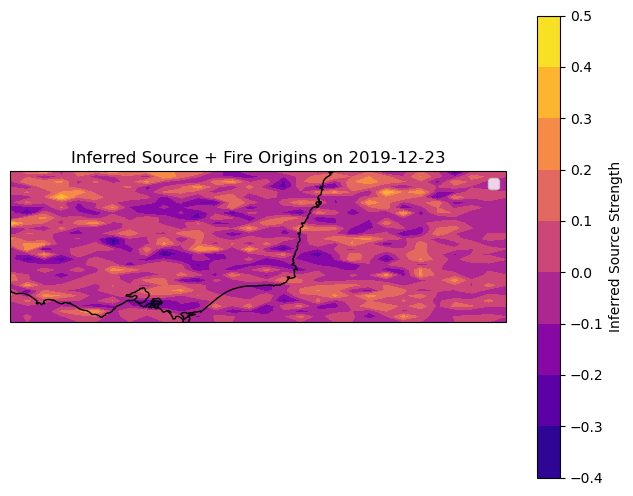

C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_37972\2699844562.py:50: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


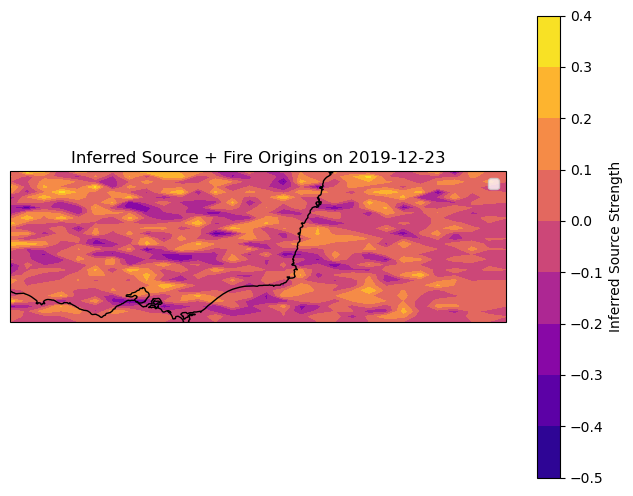

C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_37972\2699844562.py:50: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


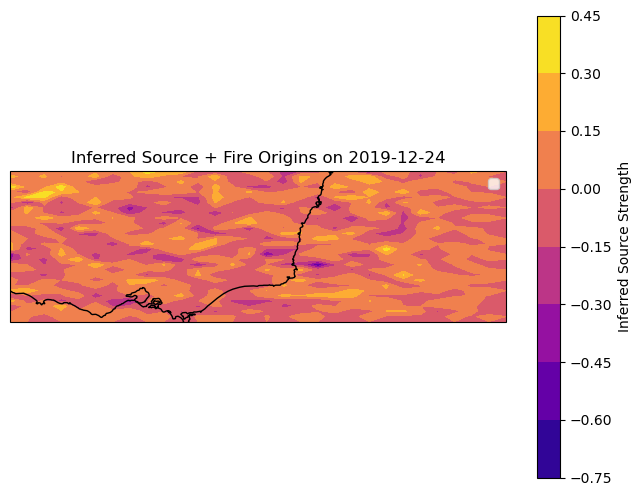

C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_37972\2699844562.py:50: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


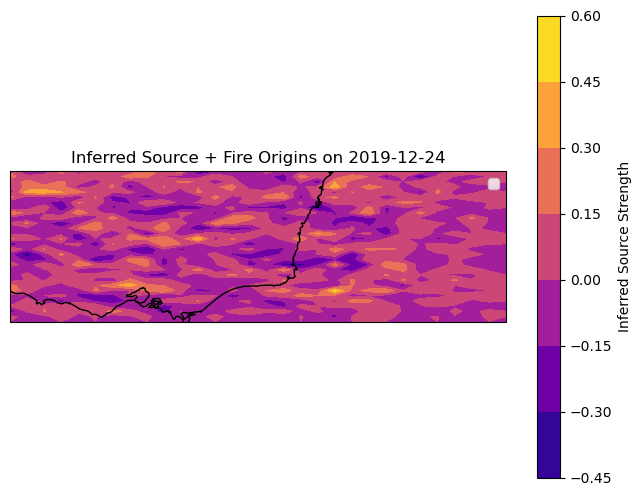

C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_37972\2699844562.py:50: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


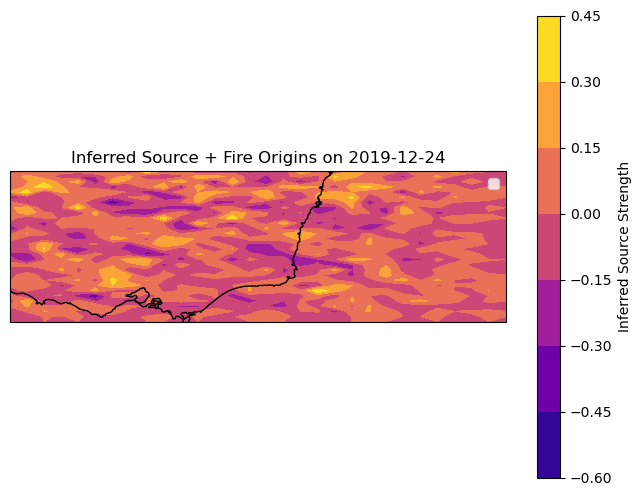

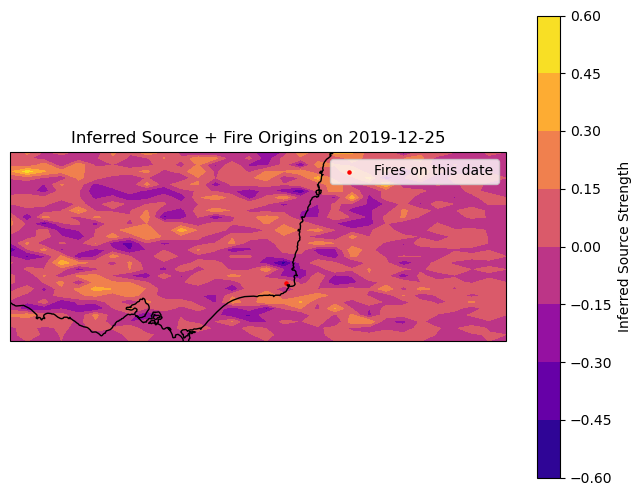

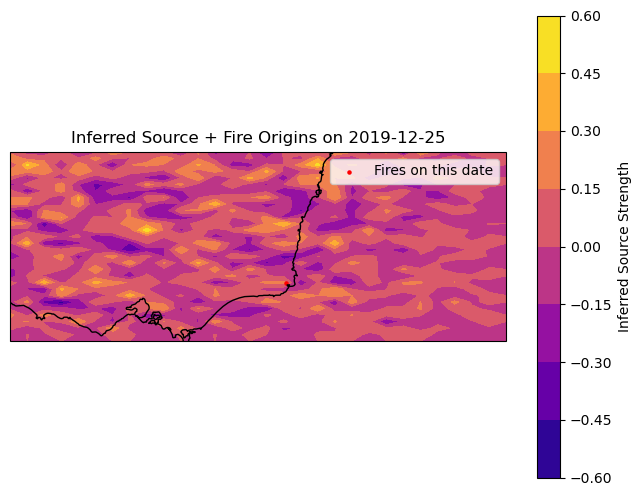

C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_37972\2699844562.py:50: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


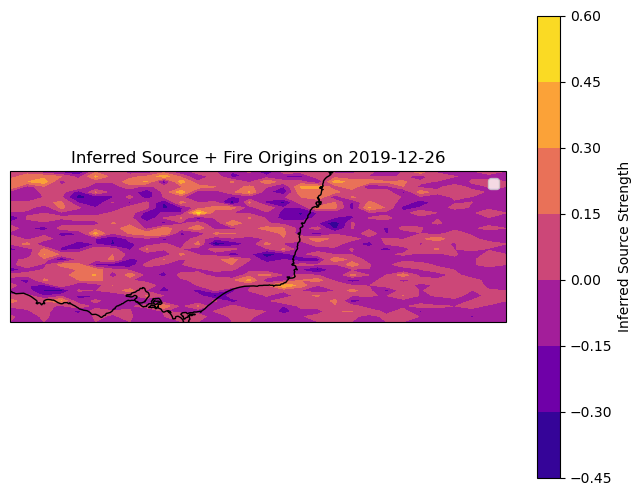

TypeError: 'module' object is not callable. Did you mean: 'datetime.datetime(...)'?

In [32]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import numpy as np
import geopandas as gpd

import datetime

# ---- Load Fire Origins shapefile ----
shapefile_path = r"C:\Users\Nur Izfarwiza\Documents\Dissertation\Order_CD850U\mga94_54\esrishape\cma100\East Gippsland-0\FIRE\FIRE_HISTORY_ORIGIN.shp"
gdf = gpd.read_file(shapefile_path)
gdf = gdf.to_crs(epsg=4326)  # convert to lat/lon
# Assuming your gdf has the full fire history data
fires_december = gdf[
    (gdf['FIRE_START'] >= '2019-12-15') & 
    (gdf['FIRE_START'] <= '2019-12-30')
]

start_date = datetime.datetime(2019, 12, 20, 0, 0)
time_interval = 3 * 60  # 3 hours in minutes
lon_bins = np.linspace(140.5, 157, sourcemean.shape[2])
lat_bins = np.linspace(-39, -34, sourcemean.shape[1])

# Loop over each time step and overlay with fires on the corresponding date
for t_index in range(0, 50, 3):
    current_time = start_date + datetime.timedelta(minutes=t_index * time_interval)
    current_date = current_time.date()
    
    # Filter fire origins for the matching date
    daily_fires = fires_december[fires_december['FIRE_START'].dt.date == current_date]
    
    # Plotting
    plt.figure(figsize=(8, 6))
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.set_extent([140.5, 157, -39, -34])
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS)
    ax.add_feature(cfeature.LAND, facecolor='lightgray')

    # Heatmap
    cf = ax.contourf(lon_bins, lat_bins, sourcemean[t_index, :, :], transform=ccrs.PlateCarree(), cmap='plasma')

    # Fire points for this date (if any)
    if not daily_fires.empty:
        daily_fires.plot(ax=ax, marker='o', color='red', markersize=5, label='Fires on this date')

    plt.colorbar(cf, ax=ax, label='Inferred Source Strength')
    plt.title(f"Inferred Source + Fire Origins on {current_time.strftime('%Y-%m-%d')}")
    plt.legend()
    plt.show()

# Set base times
source_base_time = datetime.datetime(2019, 10, 1, 0, 0)
aod_base_time = datetime(2019, 10, 1, 0, 0)  # Confirmed from AOD metadata

# Time info
total_time_seconds = boundary[1][0] - boundary[0][0]
dt_seconds = total_time_seconds / res[0]
source_times = [source_base_time + timedelta(seconds=boundary[0][0] + i * dt_seconds) for i in range(res[0])]
aod_timestamps = [aod_base_time + timedelta(minutes=float(m)) for m in aod_times]

# Grids
lat_bins = np.linspace(-39, -34, sourcemean.shape[1])
lon_bins = np.linspace(140.5, 157, sourcemean.shape[2])
lon_grid, lat_grid = np.meshgrid(lons, lats)  # from your AOD dataset

# Plot every 3-hour step in sourcemean
for t_index in range(0, res[0], int(10800 // dt_seconds)):  # 3-hour step

    source_time = source_times[t_index]

    # Find closest AOD slice by time
    time_diffs = [abs((source_time - aod_time).total_seconds()) for aod_time in aod_timestamps]
    aod_index = np.argmin(time_diffs)
    aod_time = aod_timestamps[aod_index]
    aod_slice = aod_data[aod_index]  # ✅ this line was missing before

    # Normalize AOD slice for better contrast
    aod_slice = aod_slice - np.nanmin(aod_slice)
    aod_slice = aod_slice / (np.nanmax(aod_slice) + 1e-6)

    fig, axes = plt.subplots(1, 2, figsize=(14, 6), subplot_kw={'projection': ccrs.PlateCarree()})

    # === Left: Inferred Source ===
    ax1 = axes[0]
    ax1.set_extent([140.5, 157, -39, -34])
    ax1.add_feature(cfeature.COASTLINE)
    ax1.add_feature(cfeature.BORDERS)
    ax1.add_feature(cfeature.LAND, facecolor='lightgray')
    ax1.set_title(f"Inferred Source @ {source_time.strftime('%Y-%m-%d %H:%M')}")
    cf1 = ax1.contourf(lon_bins, lat_bins, sourcemean[t_index], cmap='plasma', transform=ccrs.PlateCarree())
    fig.colorbar(cf1, ax=ax1, orientation='vertical', label='Inferred Source Strength')

    # === Right: AOD Observation ===
    ax2 = axes[1]
    ax2.set_extent([140.5, 157, -39, -34])
    ax2.add_feature(cfeature.COASTLINE)
    ax2.add_feature(cfeature.BORDERS)
    ax2.add_feature(cfeature.LAND, facecolor='lightgray')
    ax2.set_title(f"AODANA @ {aod_time.strftime('%Y-%m-%d %H:%M')}")
    cf2 = ax2.contourf(lon_grid, lat_grid, aod_slice, levels=np.linspace(0.001, 0.18, 30), cmap='plasma', transform=ccrs.PlateCarree())
    fig.colorbar(cf2, ax=ax2, orientation='vertical', label='AODANA')

    plt.tight_layout()
    plt.show()


In [16]:
file_path = r"C:\Users\Nur Izfarwiza\Documents\Dissertation\AOD\MERRA2_400.inst3_2d_gas_Nx.20191001.nc4"
dataset = Dataset(file_path, 'r')

aod_times = dataset.variables['time'][:]  # Shape: (8,)
# Time units should be: "minutes since 2019-10-01 00:00:00"
time_units = dataset.variables['time'].units
base_time = datetime(2019, 10, 1, 0, 0)

lats = dataset.variables['lat'][:]  # (361,)
lons = dataset.variables['lon'][:]  # (576,)
aod_data = dataset.variables['AODANA'][:]  # shape (8, 361, 576)



C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_37972\2372863685.py:4: RuntimeWarning: invalid value encountered in cast
  aod_times = dataset.variables['time'][:]  # Shape: (8,)
C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_37972\2372863685.py:4: UserWarning: WARNING: valid_range not used since it
cannot be safely cast to variable data type
  aod_times = dataset.variables['time'][:]  # Shape: (8,)


In [29]:
print("AOD shape:", aod_data.shape)
print("AOD min:", np.nanmin(aod_data))
print("AOD max:", np.nanmax(aod_data))
print("Unique values in selected slice:", np.unique(aod_slice))
print(dataset.variables['AODANA']._FillValue)
print("Lat range in AOD:", lats.min(), lats.max())
print("Lon range in AOD:", lons.min(), lons.max())
print("aod_slice shape:", aod_slice.shape)
print("lon_grid shape:", lon_grid.shape)
print("lat_grid shape:", lat_grid.shape)



AOD shape: (8, 361, 576)
AOD min: 0.0026594934
AOD max: 5.27701
Unique values in selected slice: [0.0 1.0495667083887383e-05 1.3503277841664385e-05 ... 0.766528844833374
 0.8030286431312561 0.9999997615814209]
1000000000000000.0
Lat range in AOD: -90.0 90.0
Lon range in AOD: -180.0 179.375
aod_slice shape: (361, 576)
lon_grid shape: (361, 576)
lat_grid shape: (361, 576)


In [20]:
import geopandas as gpd

shapefile_path = r"C:\Users\Nur Izfarwiza\Documents\Dissertation\Order_CD850U\mga94_54\esrishape\cma100\East Gippsland-0\FIRE\FIRE_HISTORY_ORIGIN.shp"
gdf = gpd.read_file(shapefile_path)

# Print column names and the first few rows
print("🔥 Columns in Fire Shapefile:", gdf.columns)
print("\n📅 Sample Rows:\n", gdf[['FIRE_NAME', 'FIRE_START', 'geometry']].head(10))

# Count fires by date
gdf['FIRE_START'] = gdf['FIRE_START'].astype('datetime64[ns]')  # ensure datetime format
fires_by_date = gdf['FIRE_START'].dt.date.value_counts().sort_index()
print("\n📊 Fires per day (Dec 2019):\n", fires_by_date.loc['2019-12-01':'2019-12-31'])


🔥 Columns in Fire Shapefile: Index(['EVENTID', 'FIRE_NAME', 'FIRE_STAT', 'FIRE_DIST', 'FIRE_NUM', 'CAUSE',
       'FIRE_START', 'geometry'],
      dtype='object')

📅 Sample Rows:
                         FIRE_NAME FIRE_START                         geometry
0  DARGO - PUNCHEN BUDWUID DIVIDE 2014-01-15  POINT (1059559.543 5834318.749)
1                 Historical Fire 1990-01-23  POINT (1042786.318 5834298.531)
2                RYANS PEAK TRACK 2002-03-25  POINT (1071692.802 5824406.931)
3                 Historical Fire 1988-01-07  POINT (1071078.422 5821423.552)
4                 Historical Fire 1988-09-09  POINT (1057752.827 5833339.117)
5                      KLOPPER TK 2005-03-02  POINT (1073225.401 5827929.948)
6                 Historical Fire 1984-12-19   POINT (1048918.625 5820837.85)
7                 Historical Fire 1983-01-04  POINT (1064808.339 5816797.103)
8                 Historical Fire 1980-03-07   POINT (1062802.65 5833020.638)
9     TABBERABBERA - STORER TRACK 2014-0

TypeError: '<' not supported between instances of 'datetime.date' and 'str'

In [21]:
import geopandas as gpd

# Load and convert
shapefile_path = r"C:\Users\Nur Izfarwiza\Documents\Dissertation\Order_CD850U\mga94_54\esrishape\cma100\East Gippsland-0\FIRE\FIRE_HISTORY_ORIGIN.shp"
gdf = gpd.read_file(shapefile_path)
gdf = gdf.to_crs(epsg=4326)
gdf['FIRE_START'] = gdf['FIRE_START'].astype('datetime64[ns]')

# Filter for December, January, February (summer in Australia)
summer_fires = gdf[gdf['FIRE_START'].dt.month.isin([12, 1, 2])]

# Show the filtered data
print("🔥 Fires in Dec, Jan, Feb across all years:")
print(summer_fires[['FIRE_NAME', 'FIRE_START']].sort_values(by='FIRE_START').head(20))

from datetime import datetime

djf_fires = gdf[
    (gdf['FIRE_START'] >= datetime(2019, 12, 1)) &
    (gdf['FIRE_START'] <= datetime(2020, 2, 29))
]

print("🔥 Fires from Dec 2019 to Feb 2020:")
print(djf_fires[['FIRE_NAME', 'FIRE_START']].sort_values(by='FIRE_START'))


🔥 Fires in Dec, Jan, Feb across all years:
            FIRE_NAME FIRE_START
5152  Historical Fire 1972-12-01
2856  Historical Fire 1972-12-04
197   Historical Fire 1972-12-05
1381  Historical Fire 1972-12-15
4469  Historical Fire 1972-12-16
1163  Historical Fire 1972-12-17
2597  Historical Fire 1972-12-20
3425  Historical Fire 1972-12-21
1708  Historical Fire 1972-12-21
1432  Historical Fire 1972-12-21
1907  Historical Fire 1972-12-21
2313  Historical Fire 1972-12-21
5145  Historical Fire 1972-12-21
512   Historical Fire 1972-12-21
3694  Historical Fire 1972-12-22
4100  Historical Fire 1972-12-22
4099  Historical Fire 1972-12-22
4078  Historical Fire 1972-12-22
3861  Historical Fire 1972-12-22
4077  Historical Fire 1972-12-22
🔥 Fires from Dec 2019 to Feb 2020:
                                              FIRE_NAME FIRE_START
301                 TAMBO 45 - SARSFIELD - PADDY`S FLAT 2019-12-03
3386         SNOWY 8 - WALLAGARAUGH - WALLAGARAUGH ROAD 2019-12-25
4163                 TAMBO 5

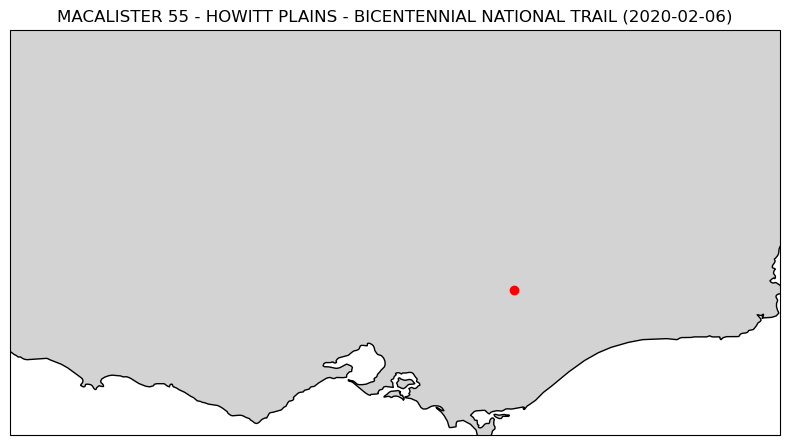

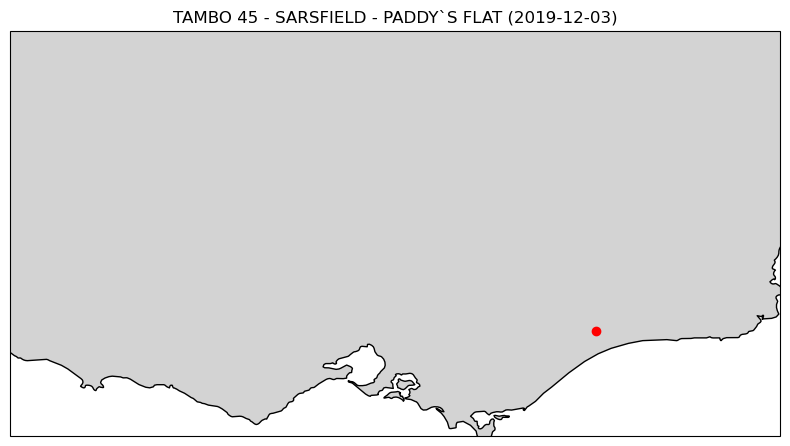

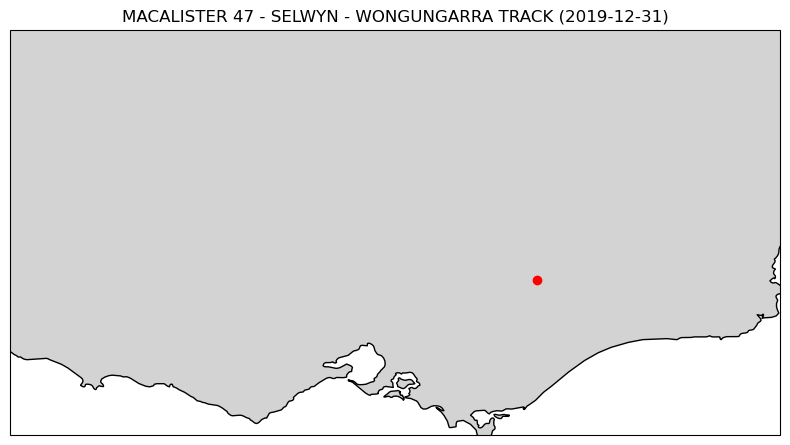

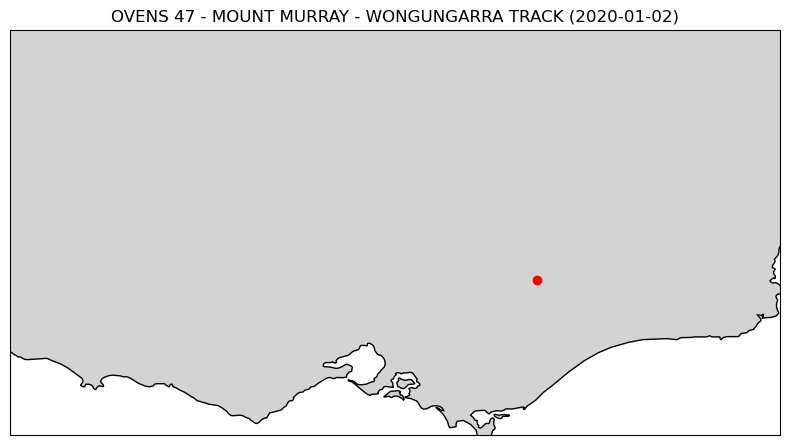

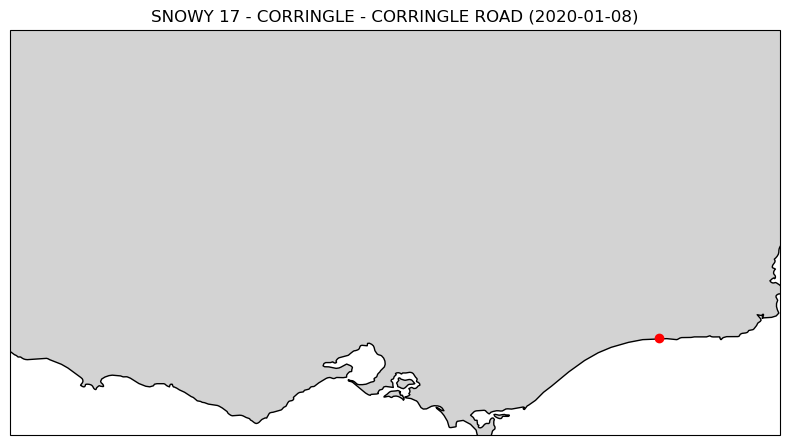

...

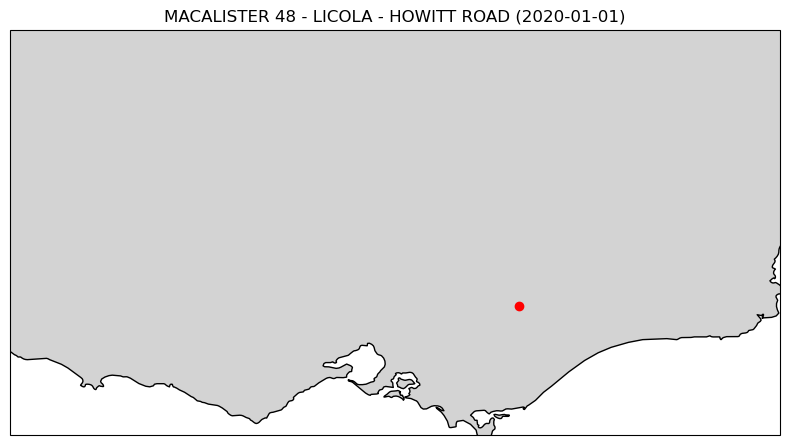

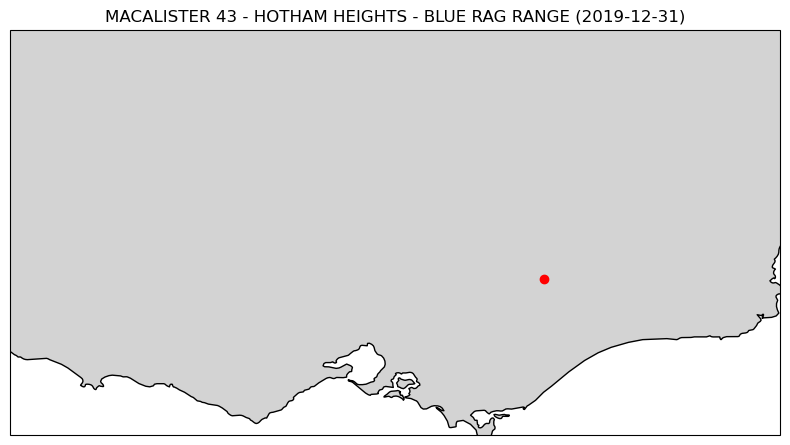

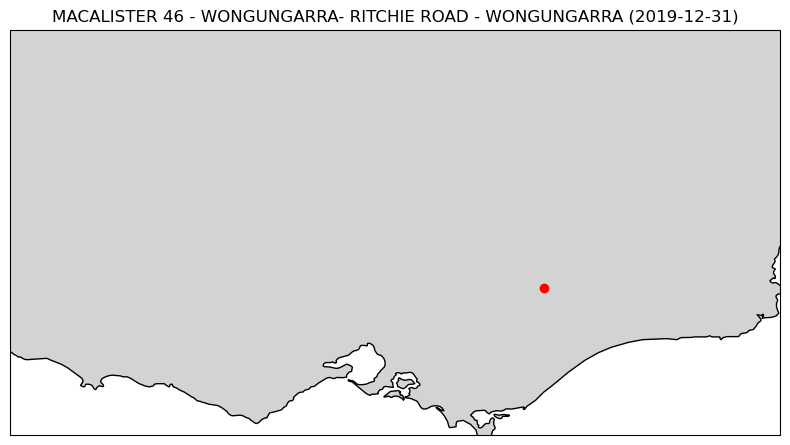

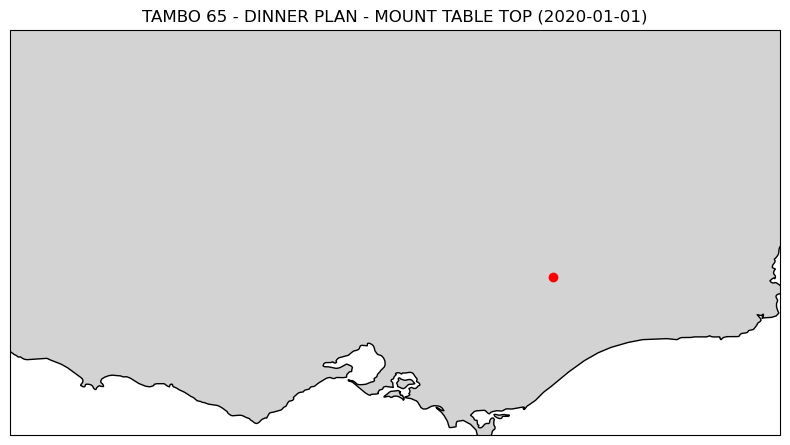

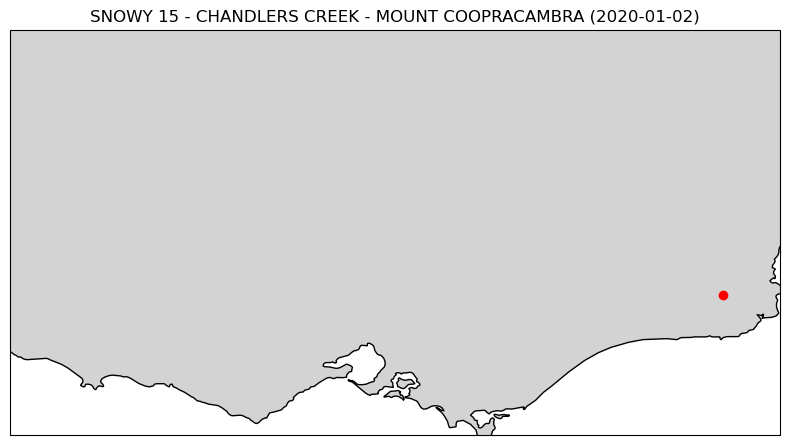

In [23]:
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from datetime import datetime

# Load the shapefile
shapefile_path = r"C:\Users\Nur Izfarwiza\Documents\Dissertation\Order_CD850U\mga94_54\esrishape\cma100\East Gippsland-0\FIRE\FIRE_HISTORY_ORIGIN.shp"
gdf = gpd.read_file(shapefile_path)
gdf = gdf.to_crs(epsg=4326)  # Convert to lat/lon
gdf['FIRE_START'] = gdf['FIRE_START'].astype('datetime64[ns]')

# Filter for fires from Dec 2019 to Feb 2020
djf_fires = gdf[
    (gdf['FIRE_START'] >= datetime(2019, 12, 1)) &
    (gdf['FIRE_START'] <= datetime(2020, 2, 29))
]

# Plot each fire origin point with its fire name
for _, row in djf_fires.iterrows():
    fig = plt.figure(figsize=(8, 6))
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.set_extent([140.5, 150, -39, -34])
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS)
    ax.add_feature(cfeature.LAND, facecolor='lightgray')

    # Plot fire point
    ax.plot(row.geometry.x, row.geometry.y, marker='o', color='red', transform=ccrs.PlateCarree())
    ax.set_title(f"{row['FIRE_NAME']} ({row['FIRE_START'].date()})")
    plt.tight_layout()
    plt.show()


C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\1580840906.py:29: RuntimeWarning: invalid value encountered in cast
  times = ds.variables["time"][:]  # usually 3-hour intervals (e.g. [0, 180, ..., 1260])
C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\1580840906.py:29: UserWarning: WARNING: valid_range not used since it
cannot be safely cast to variable data type
  times = ds.variables["time"][:]  # usually 3-hour intervals (e.g. [0, 180, ..., 1260])


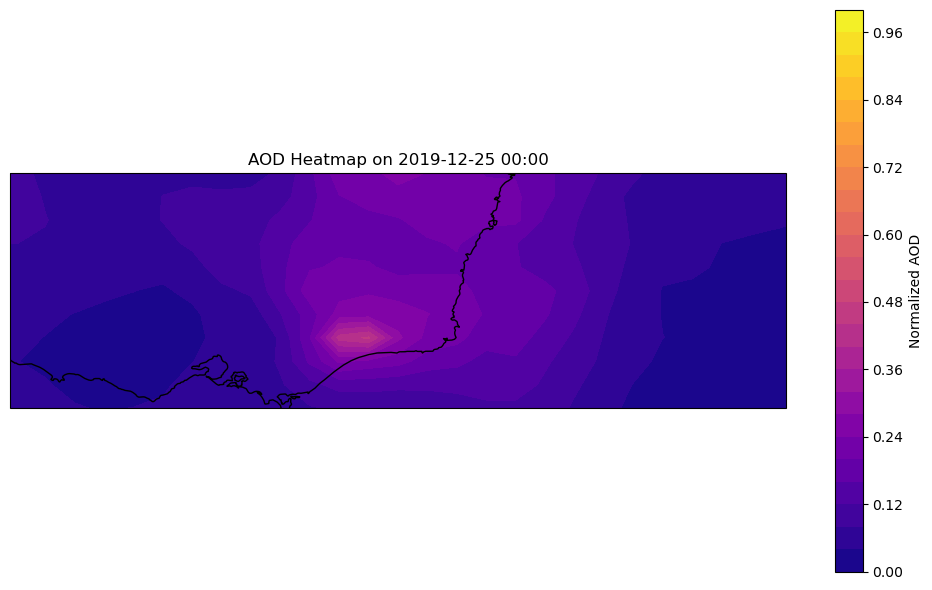

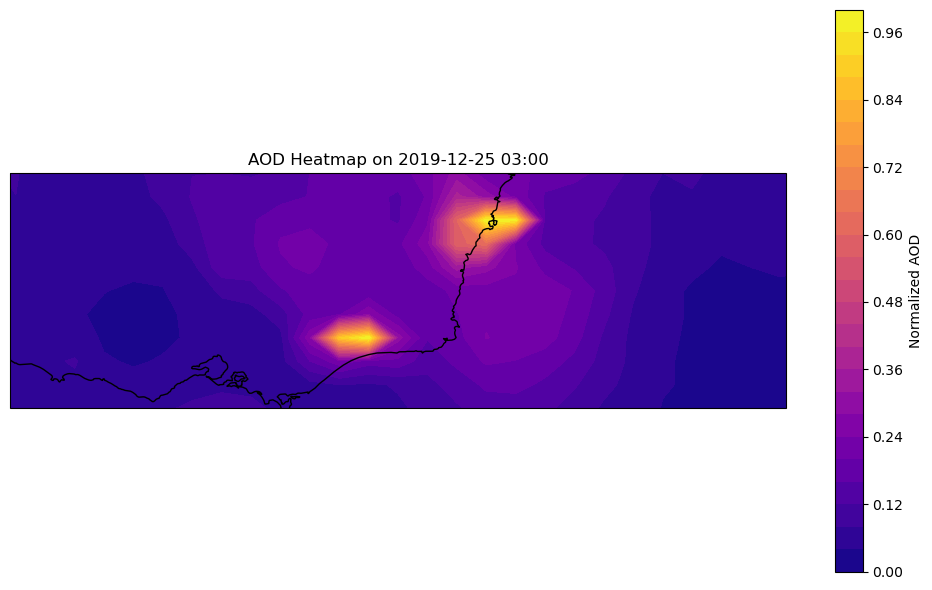

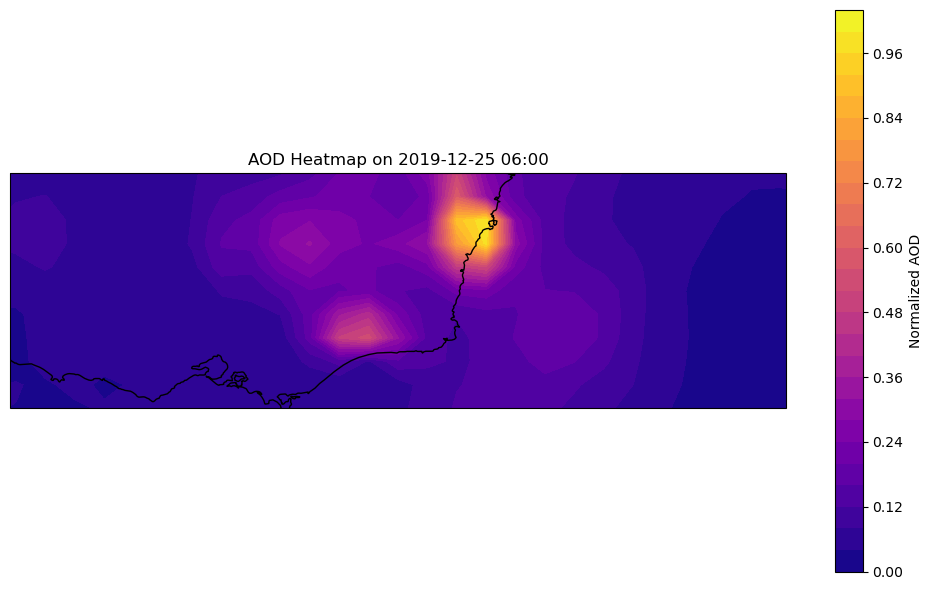

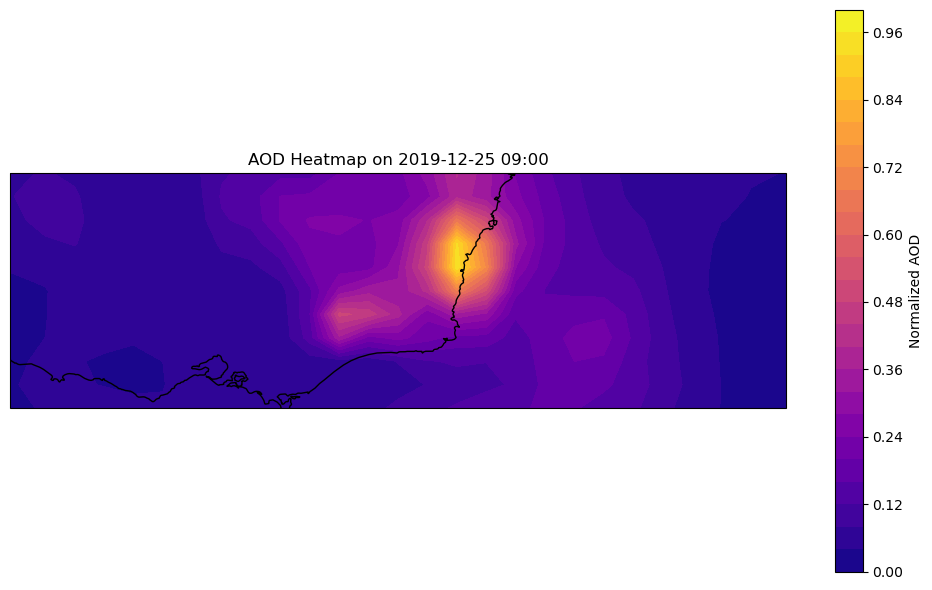

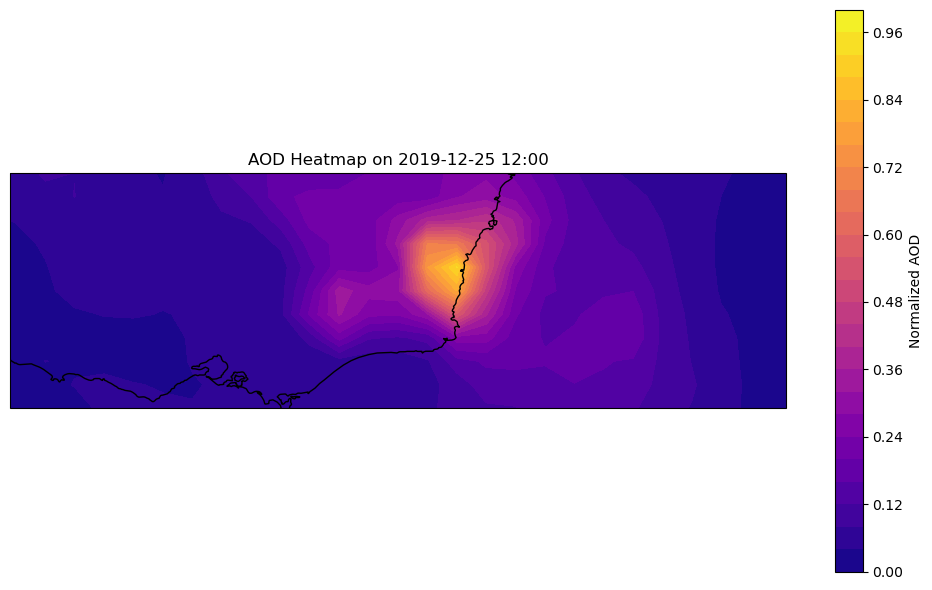

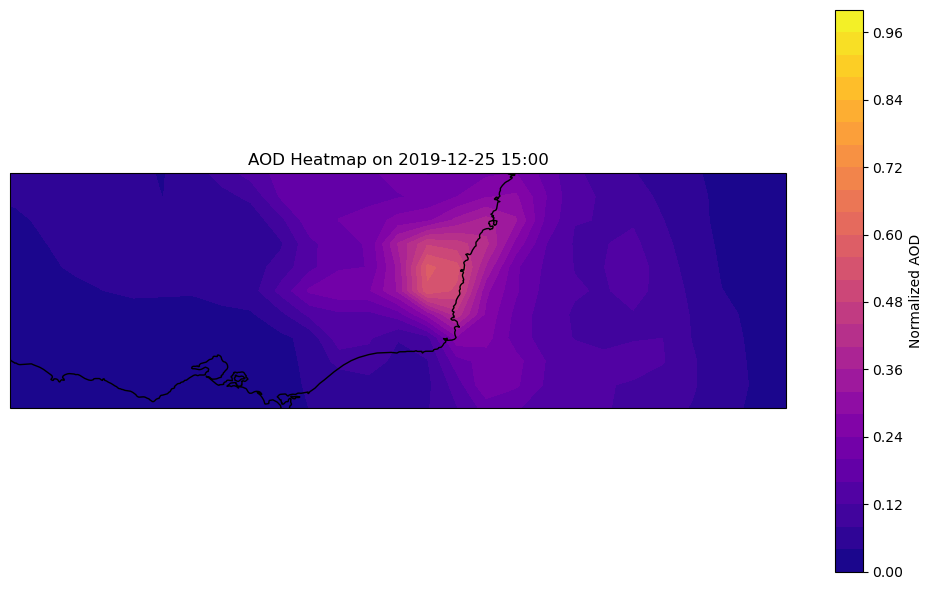

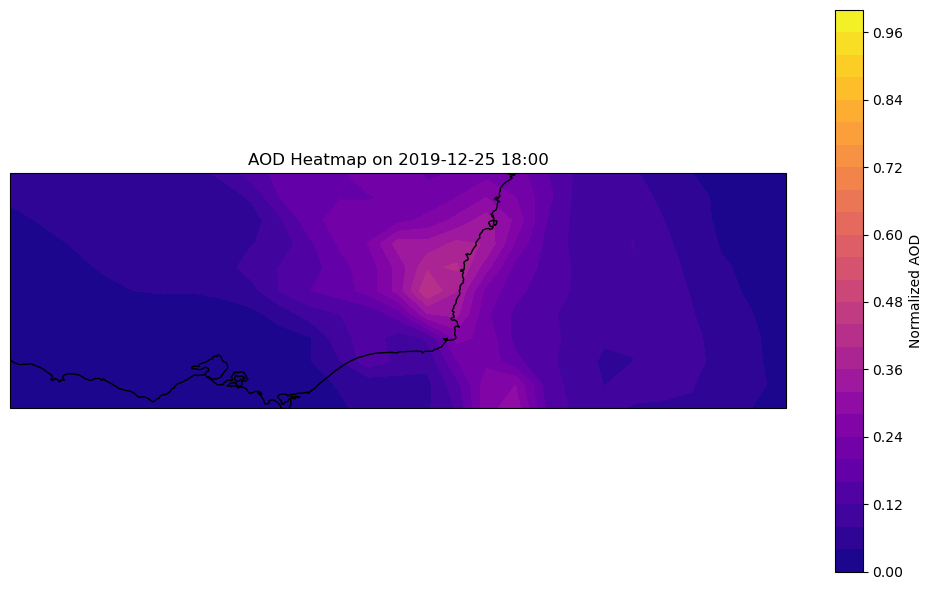

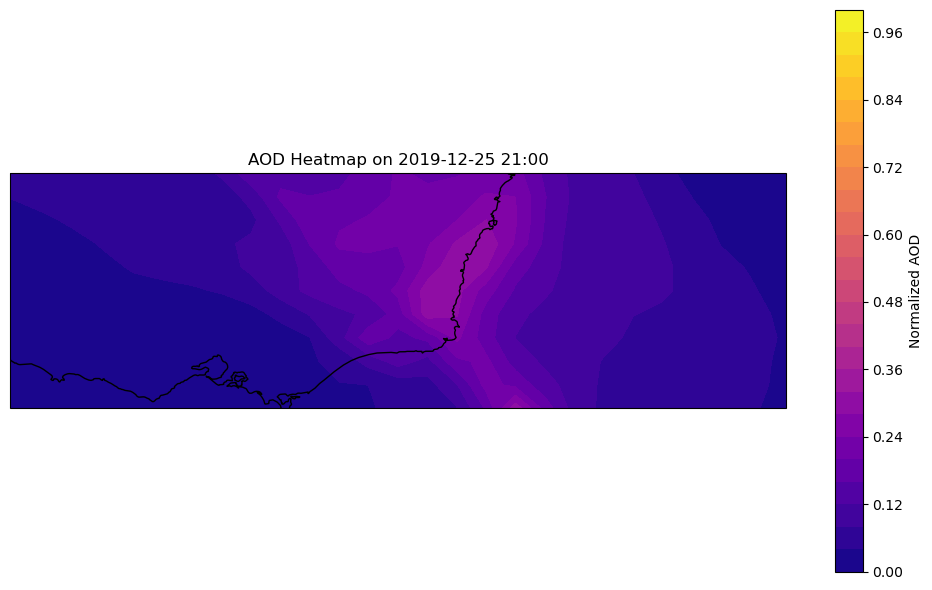

C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\1580840906.py:29: RuntimeWarning: invalid value encountered in cast
  times = ds.variables["time"][:]  # usually 3-hour intervals (e.g. [0, 180, ..., 1260])
C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\1580840906.py:29: UserWarning: WARNING: valid_range not used since it
cannot be safely cast to variable data type
  times = ds.variables["time"][:]  # usually 3-hour intervals (e.g. [0, 180, ..., 1260])


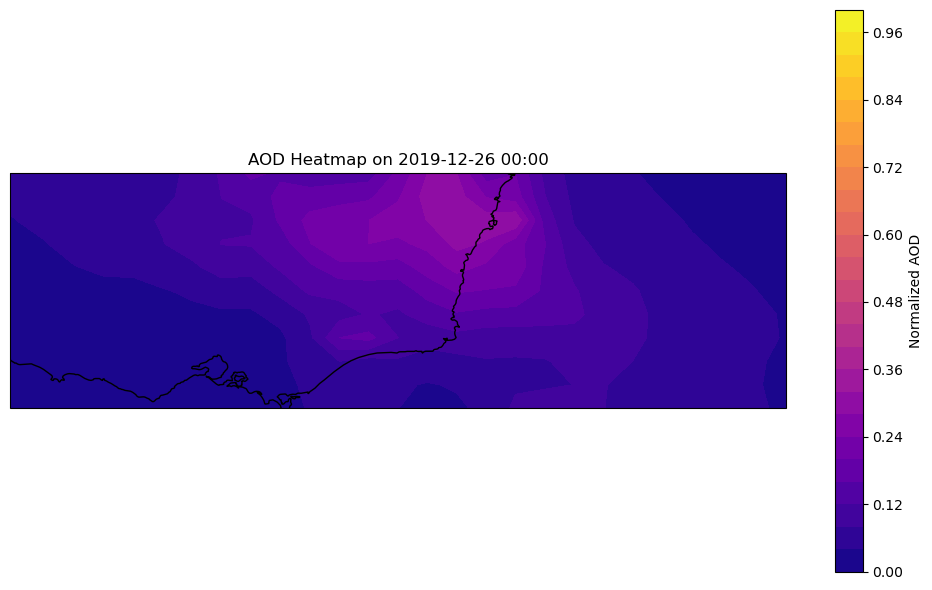

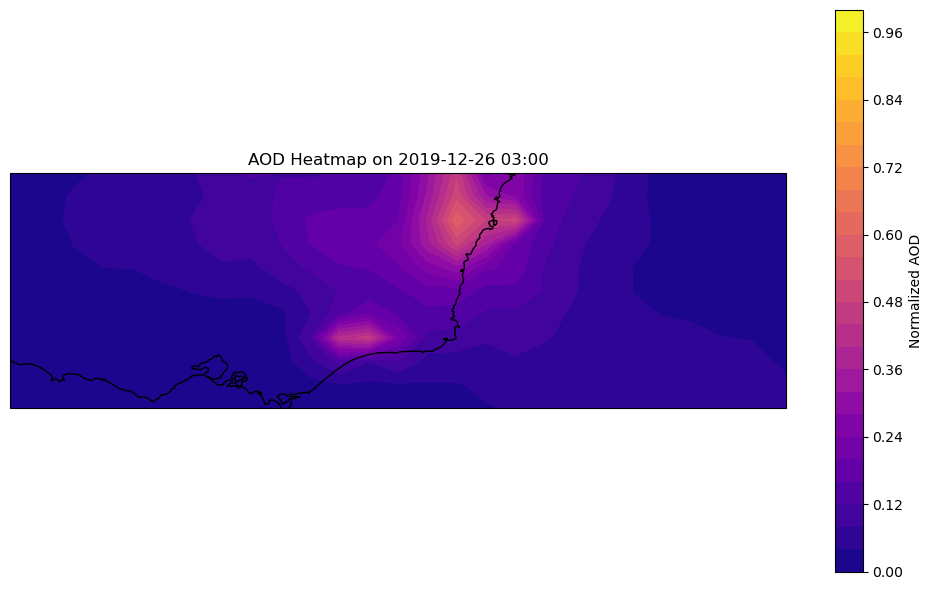

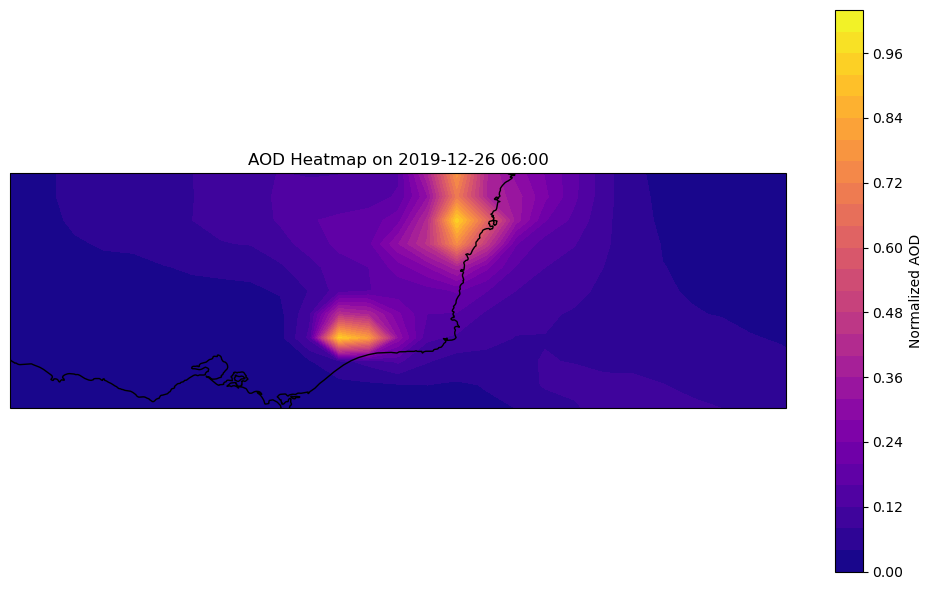

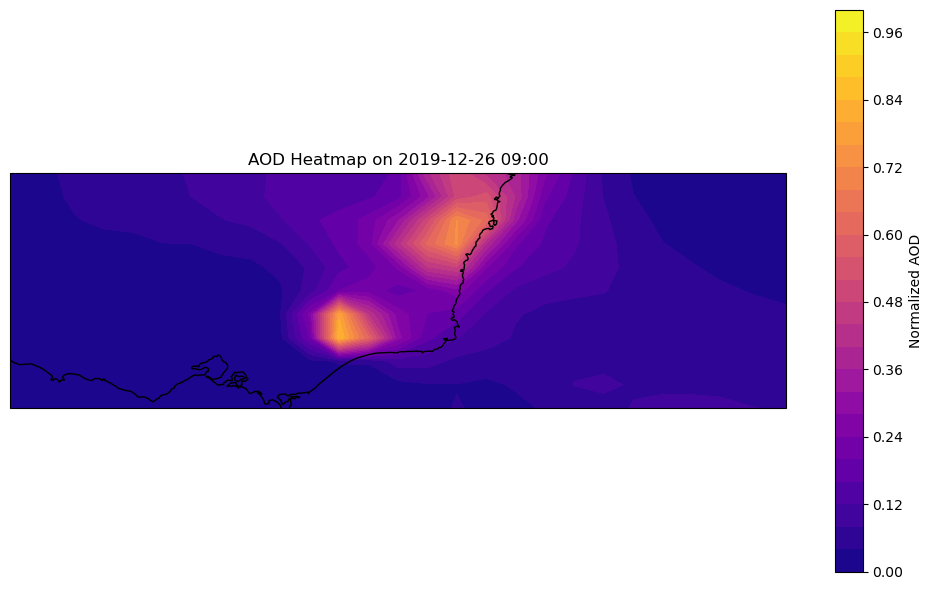

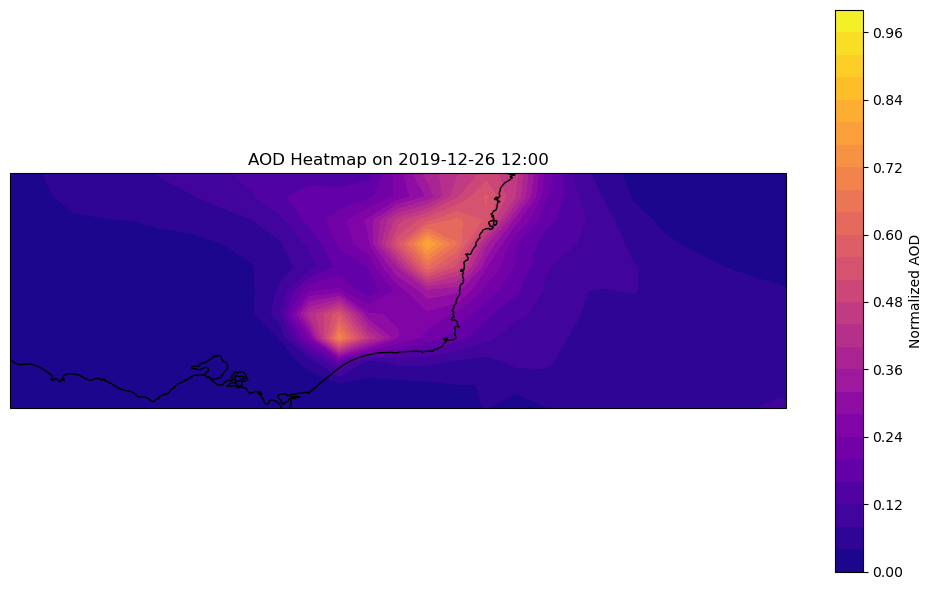

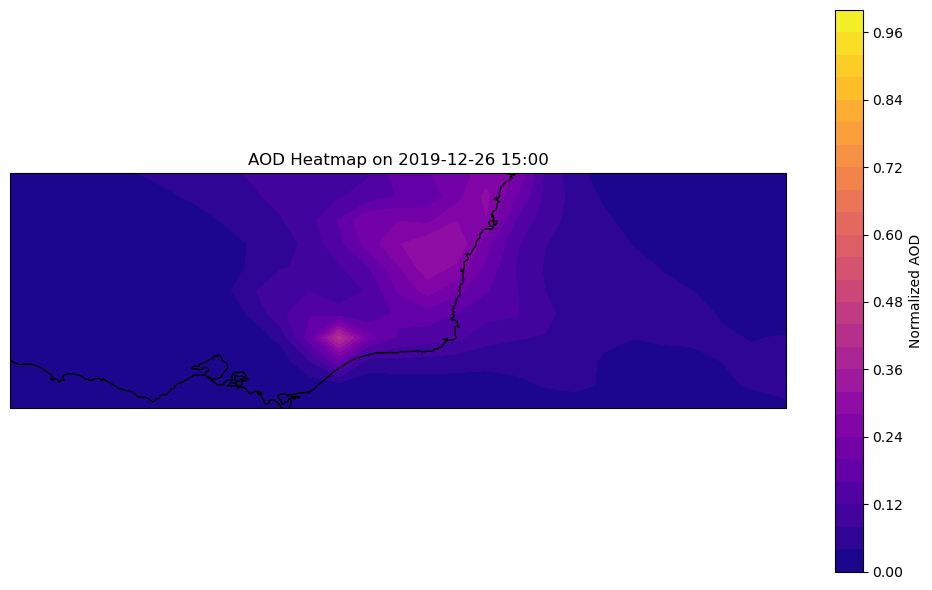

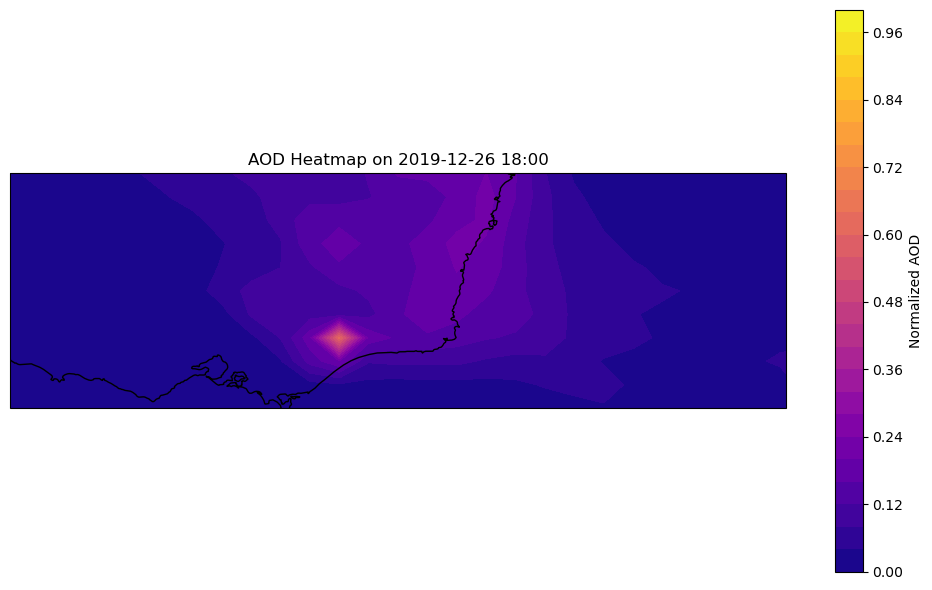

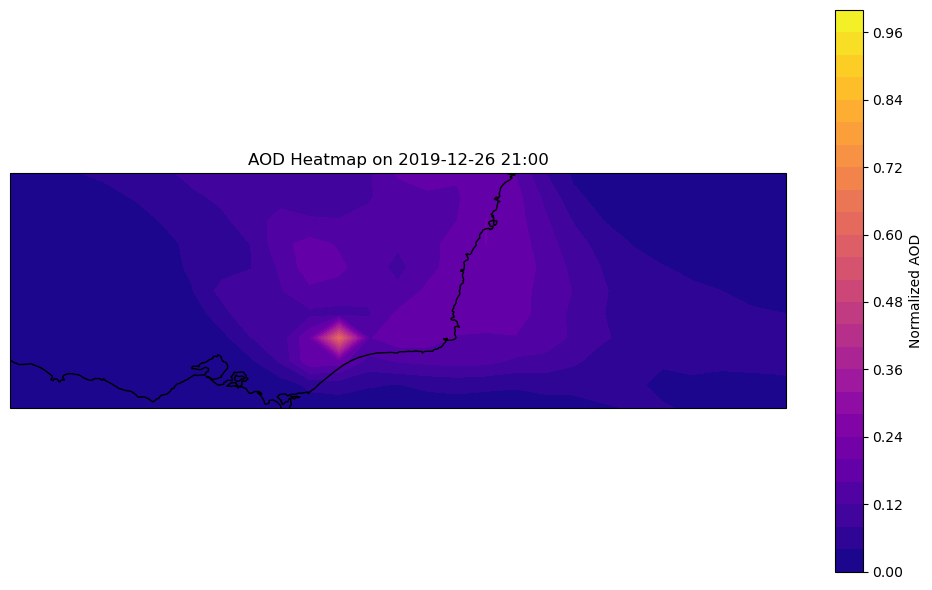

C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\1580840906.py:29: RuntimeWarning: invalid value encountered in cast
  times = ds.variables["time"][:]  # usually 3-hour intervals (e.g. [0, 180, ..., 1260])
C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\1580840906.py:29: UserWarning: WARNING: valid_range not used since it
cannot be safely cast to variable data type
  times = ds.variables["time"][:]  # usually 3-hour intervals (e.g. [0, 180, ..., 1260])


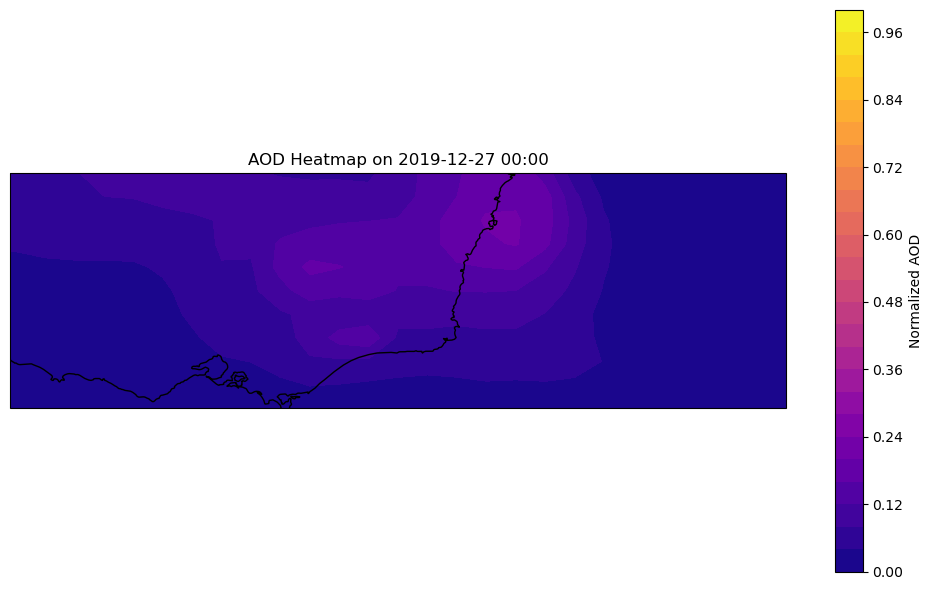

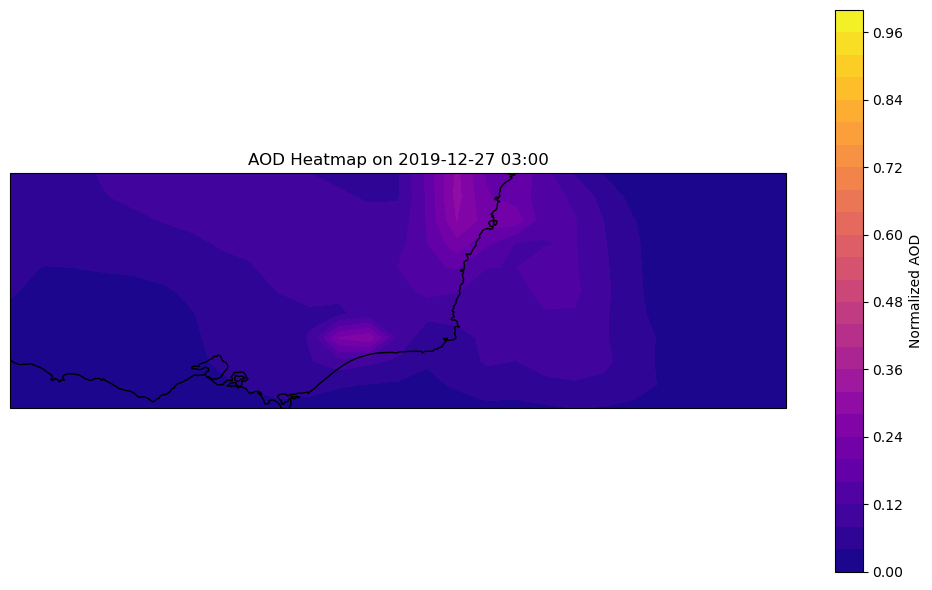

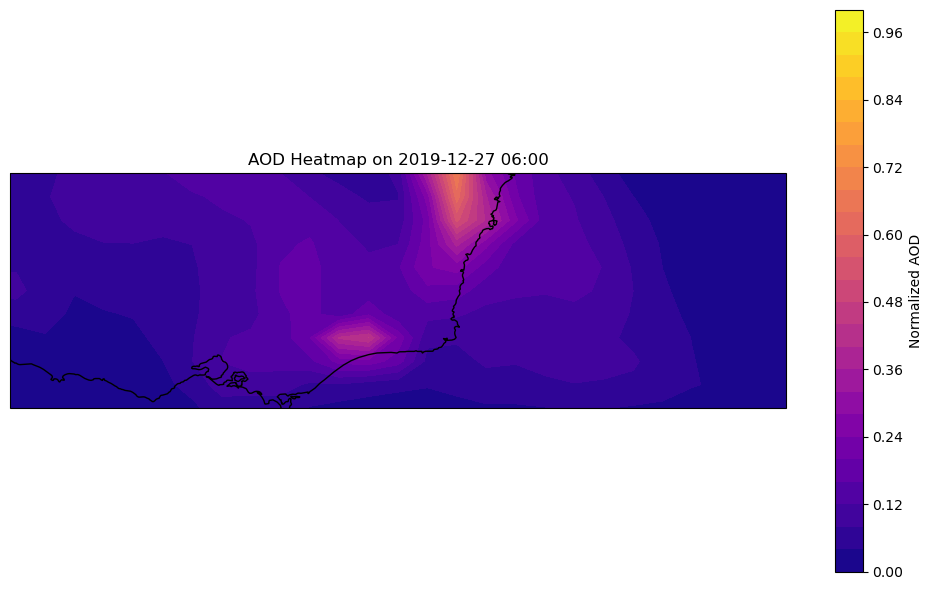

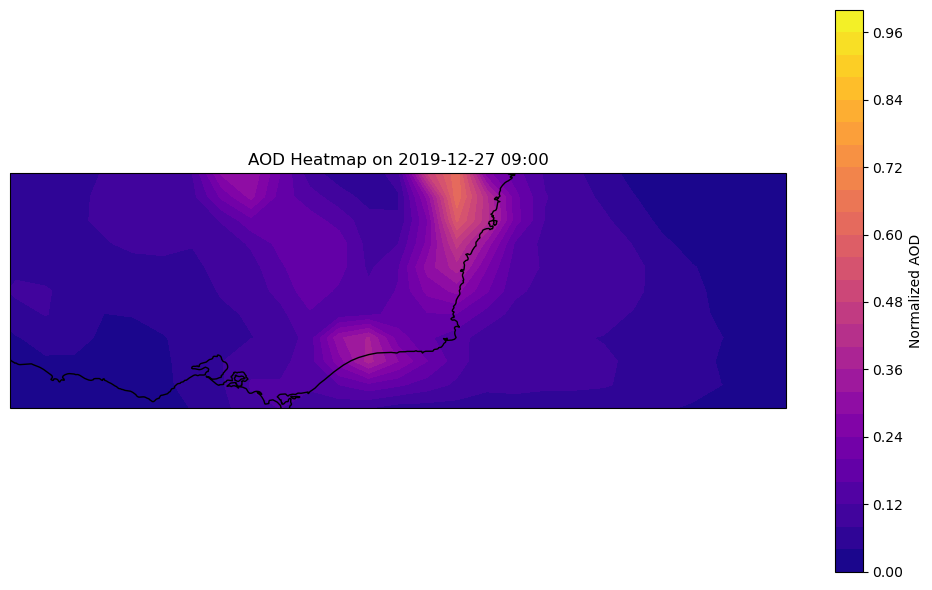

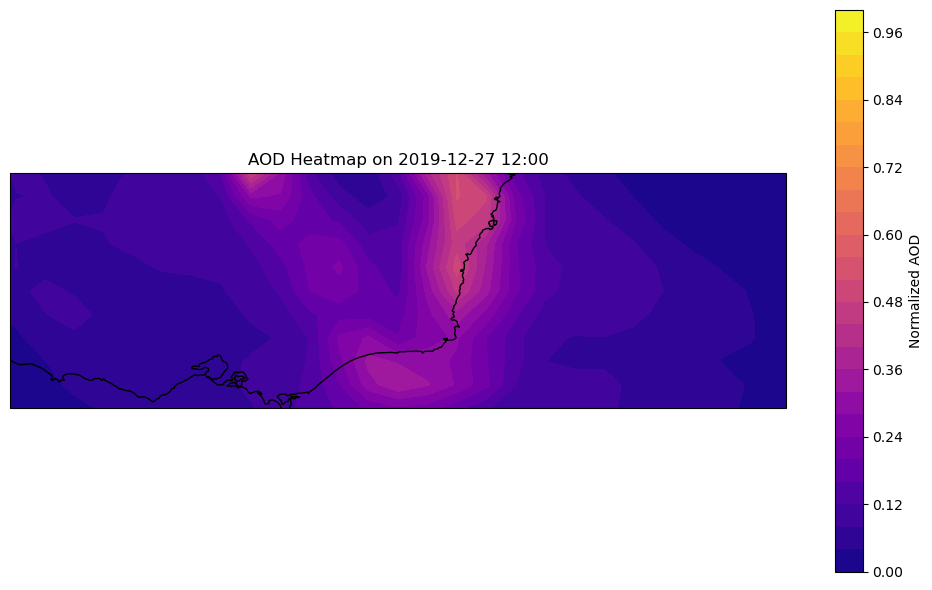

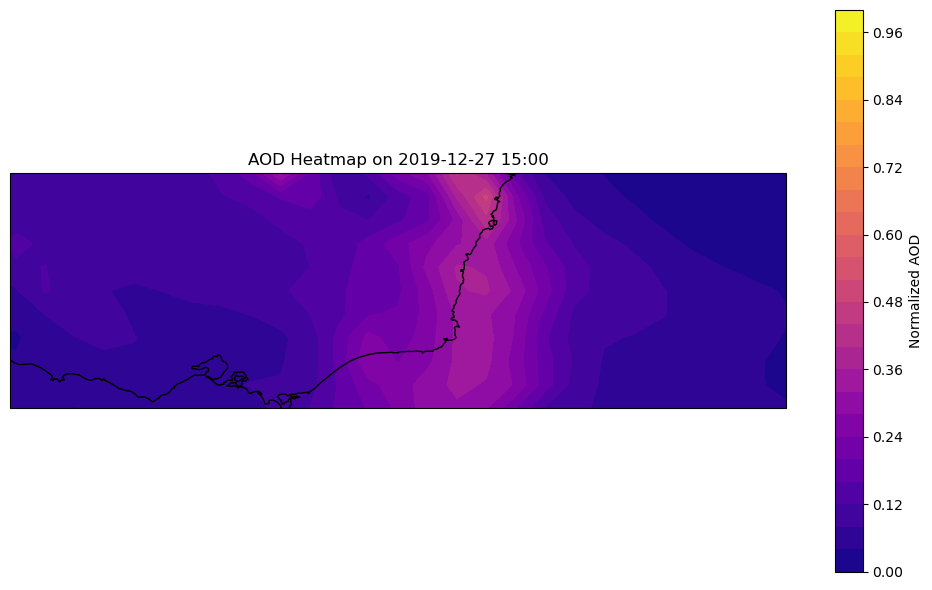

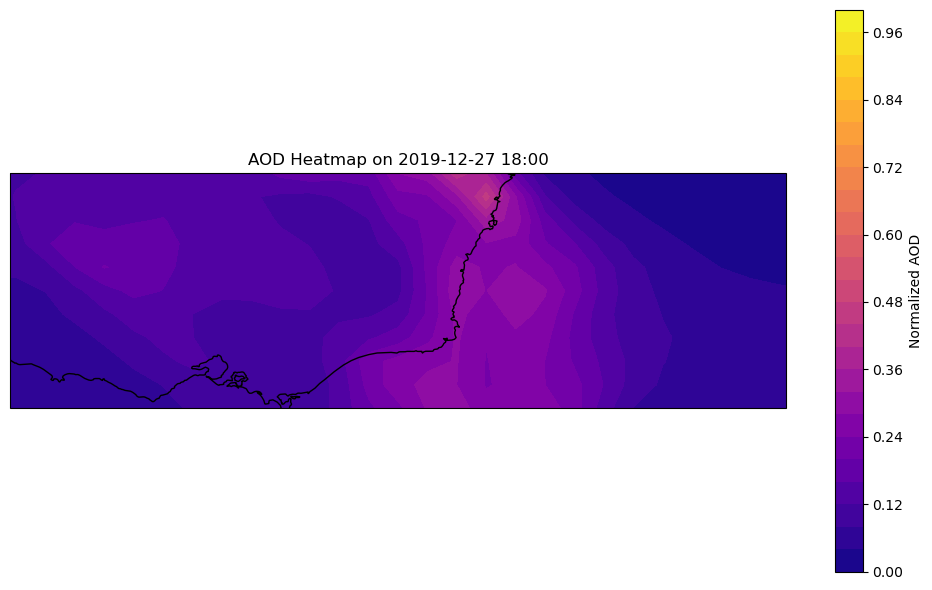

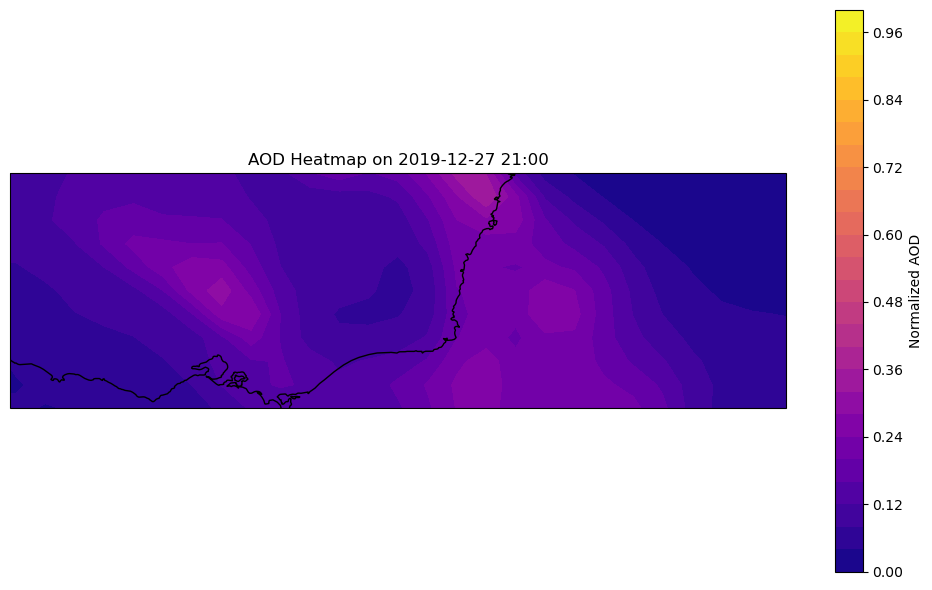

C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\1580840906.py:29: RuntimeWarning: invalid value encountered in cast
  times = ds.variables["time"][:]  # usually 3-hour intervals (e.g. [0, 180, ..., 1260])
C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\1580840906.py:29: UserWarning: WARNING: valid_range not used since it
cannot be safely cast to variable data type
  times = ds.variables["time"][:]  # usually 3-hour intervals (e.g. [0, 180, ..., 1260])


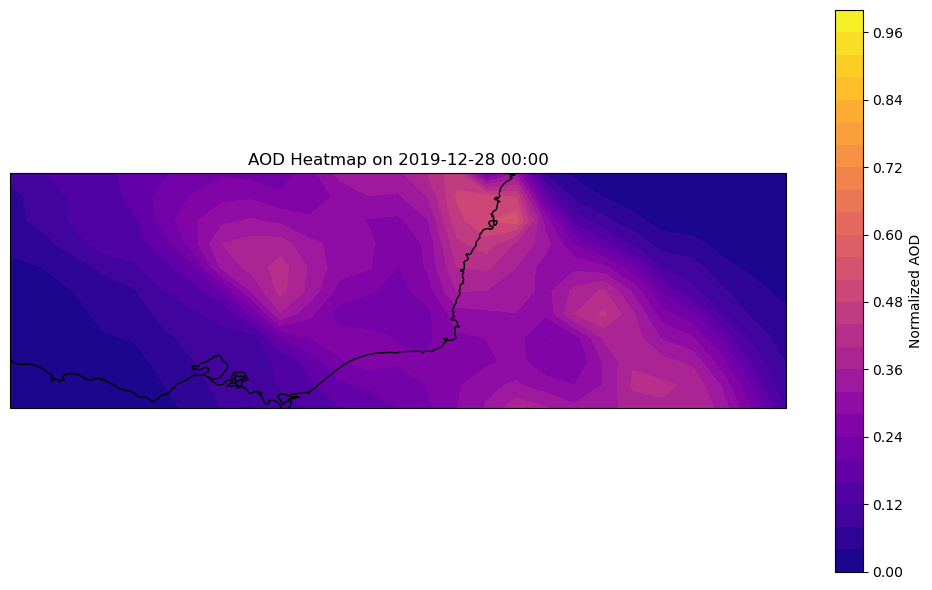

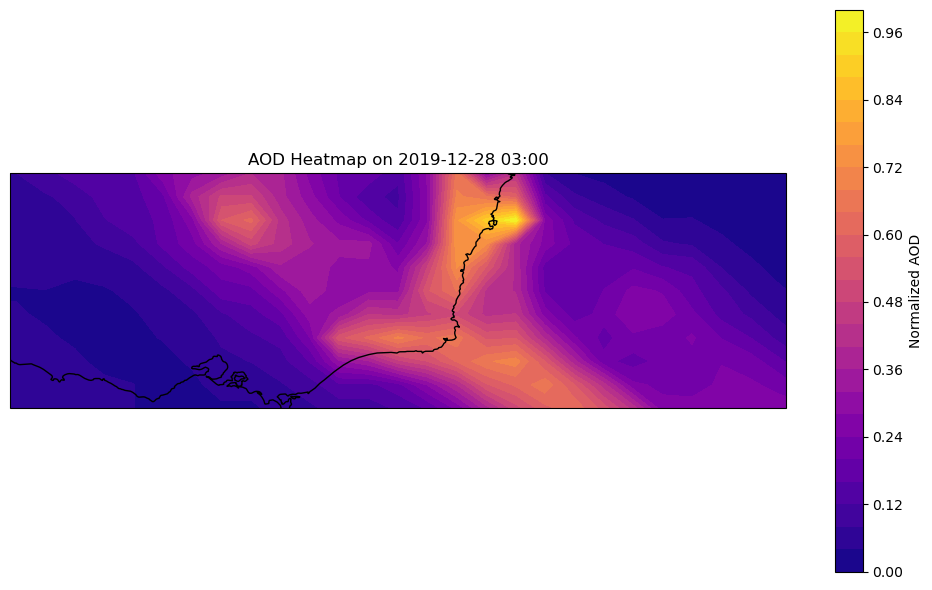

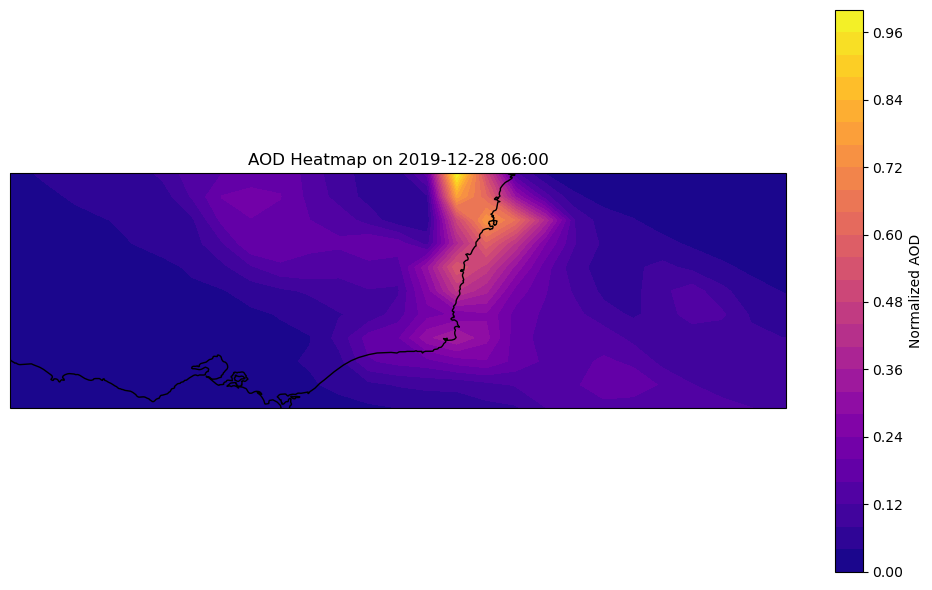

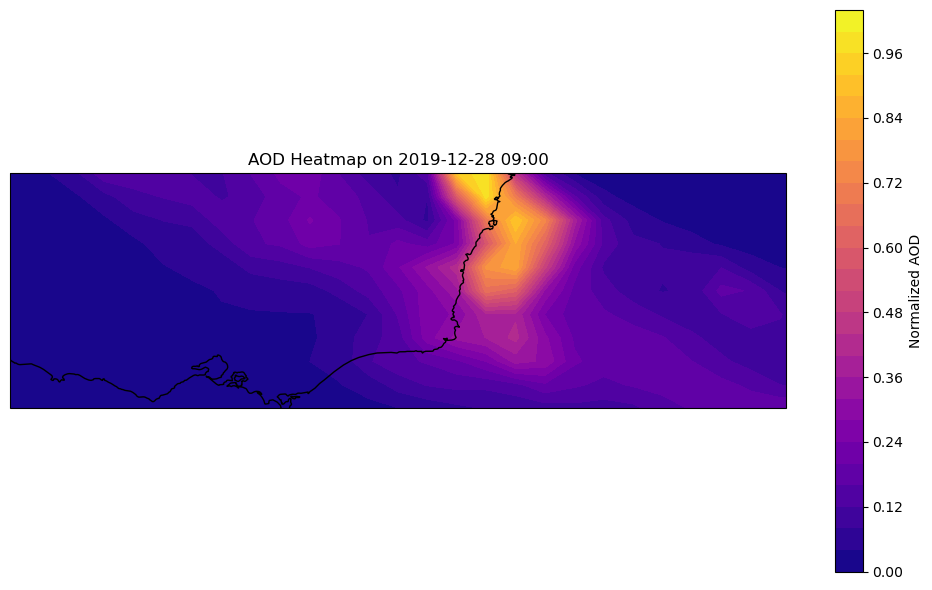

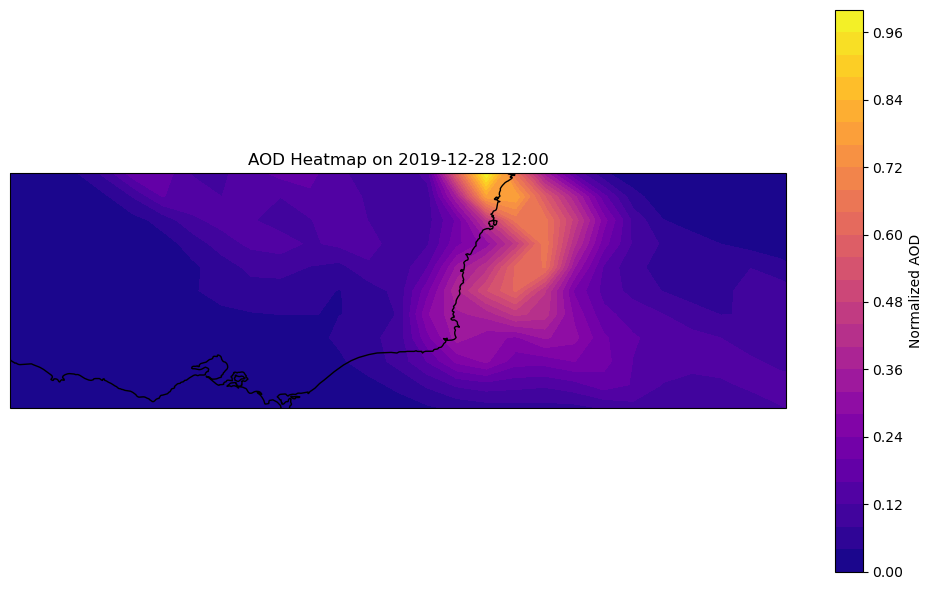

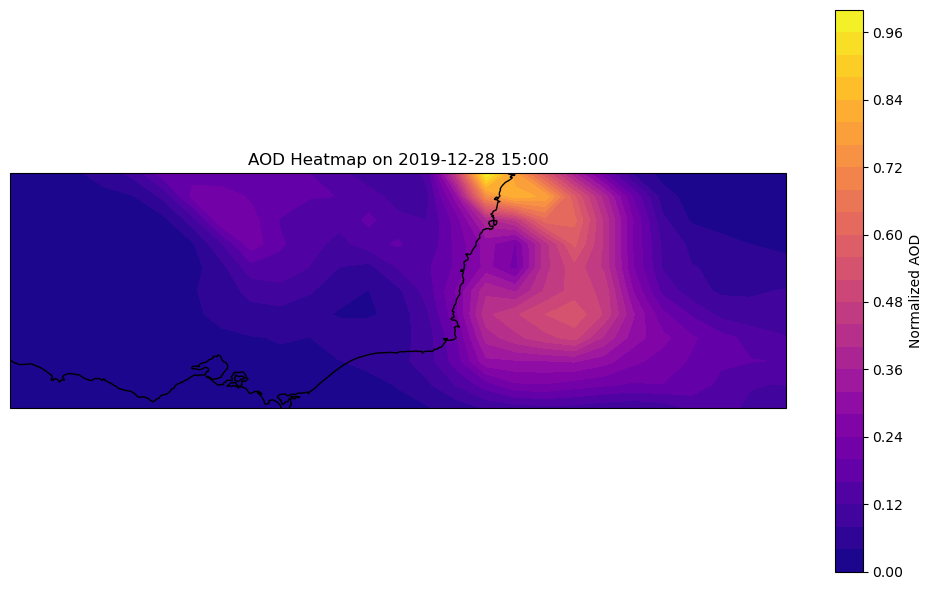

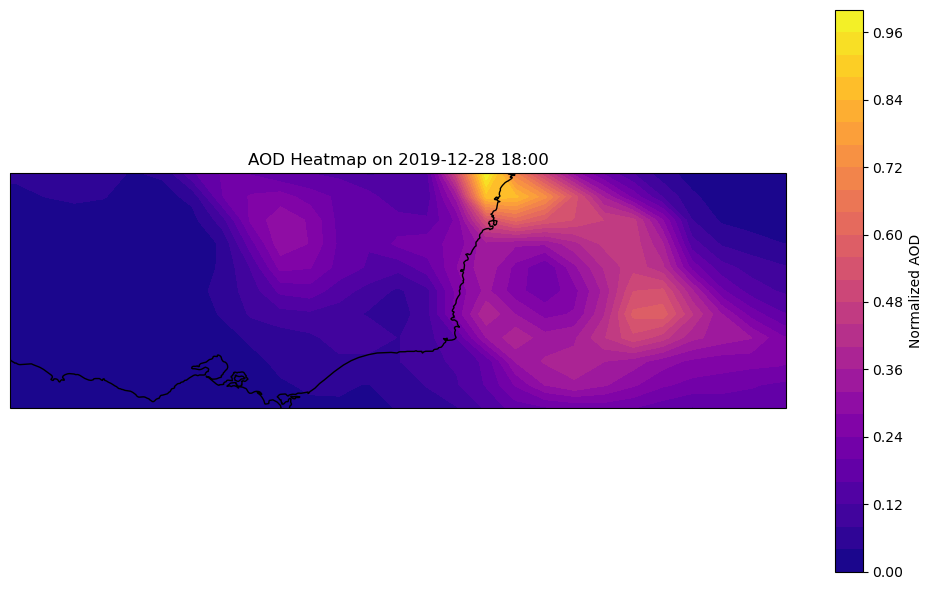

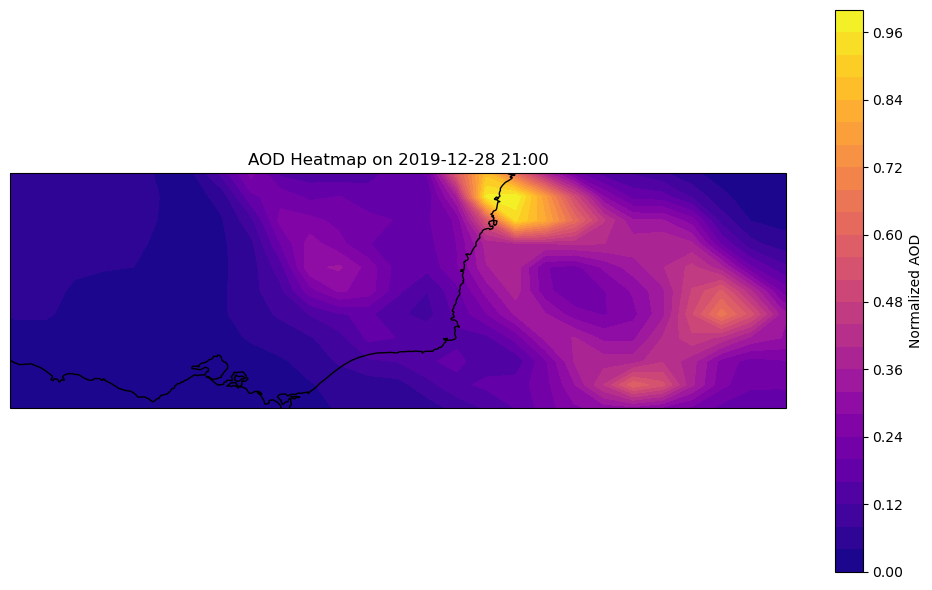

C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\1580840906.py:29: RuntimeWarning: invalid value encountered in cast
  times = ds.variables["time"][:]  # usually 3-hour intervals (e.g. [0, 180, ..., 1260])
C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\1580840906.py:29: UserWarning: WARNING: valid_range not used since it
cannot be safely cast to variable data type
  times = ds.variables["time"][:]  # usually 3-hour intervals (e.g. [0, 180, ..., 1260])


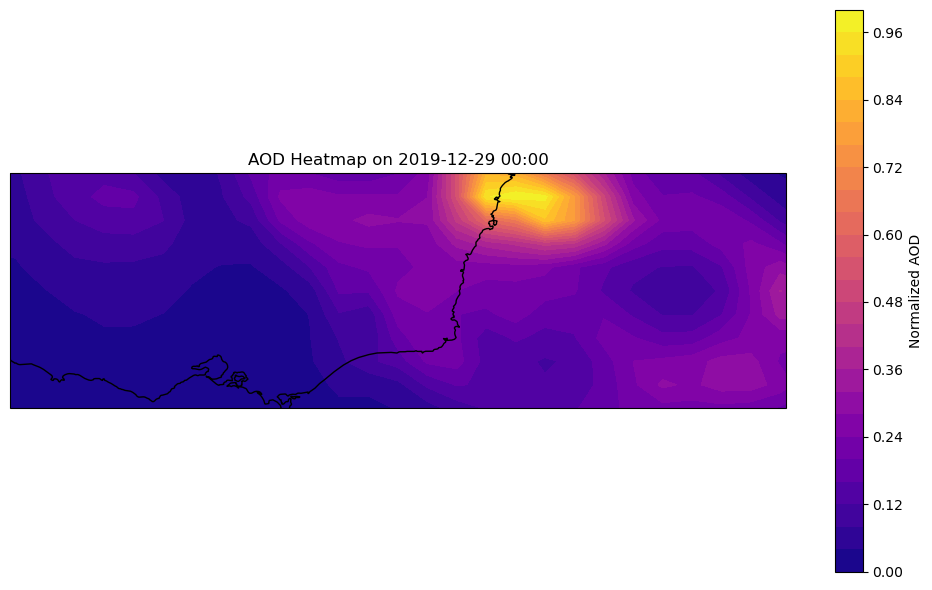

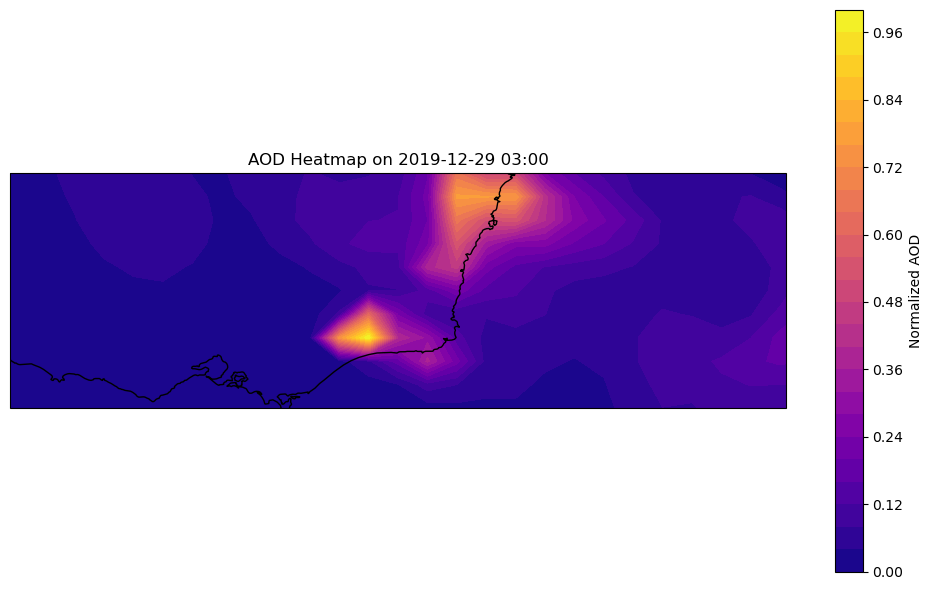

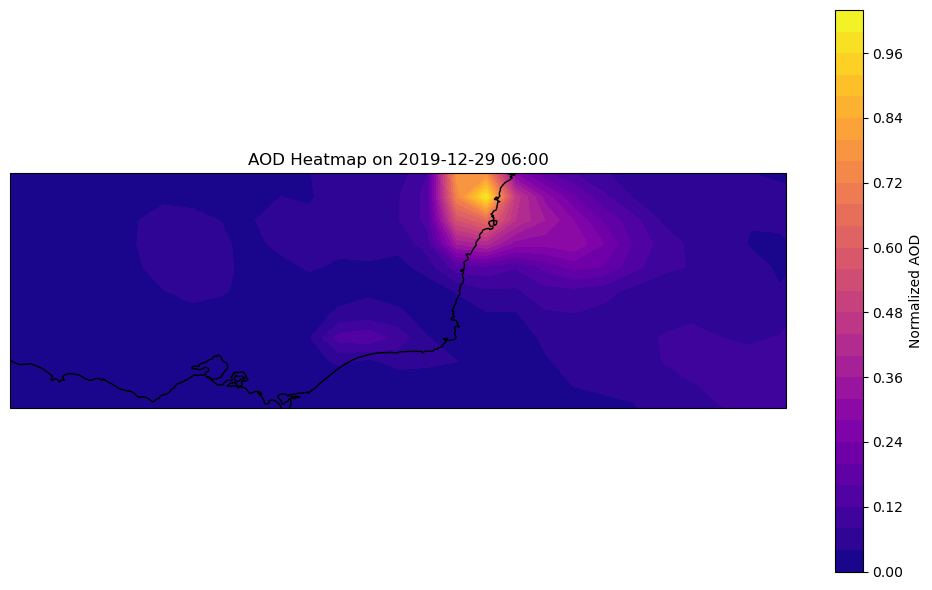

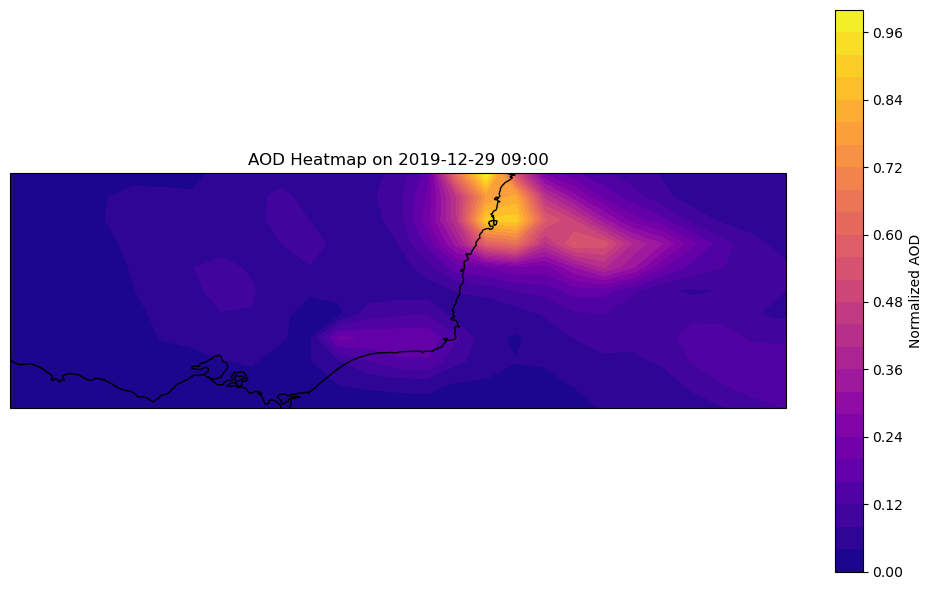

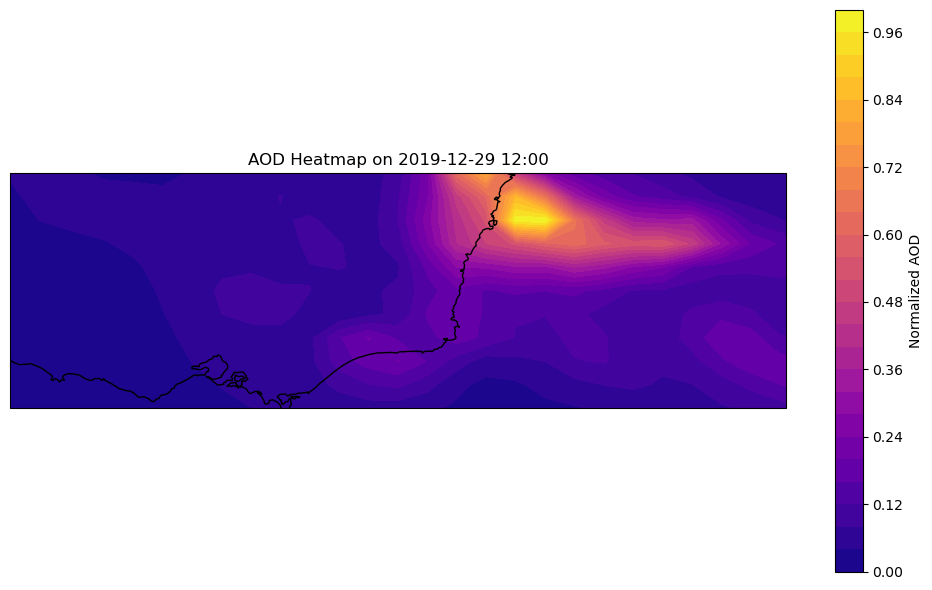

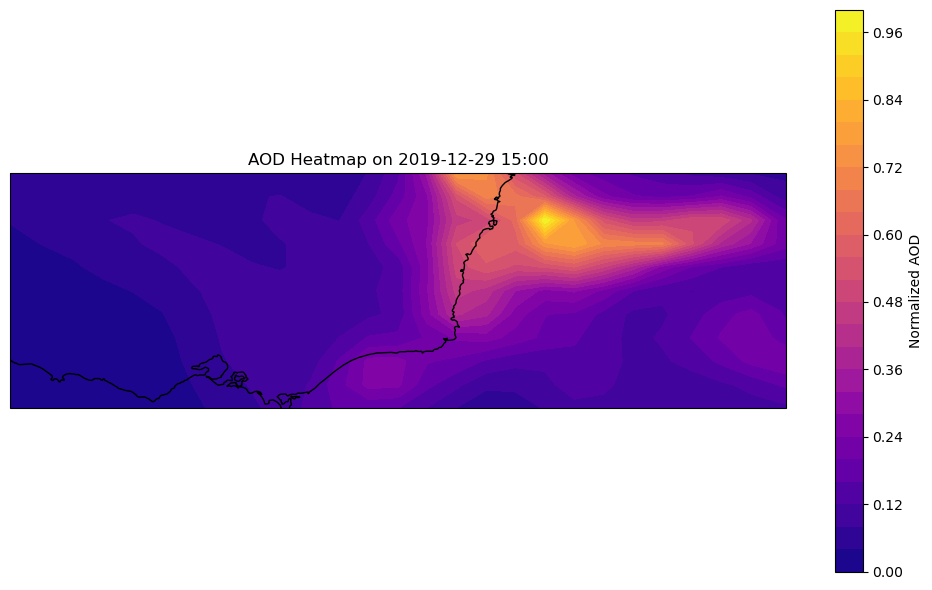

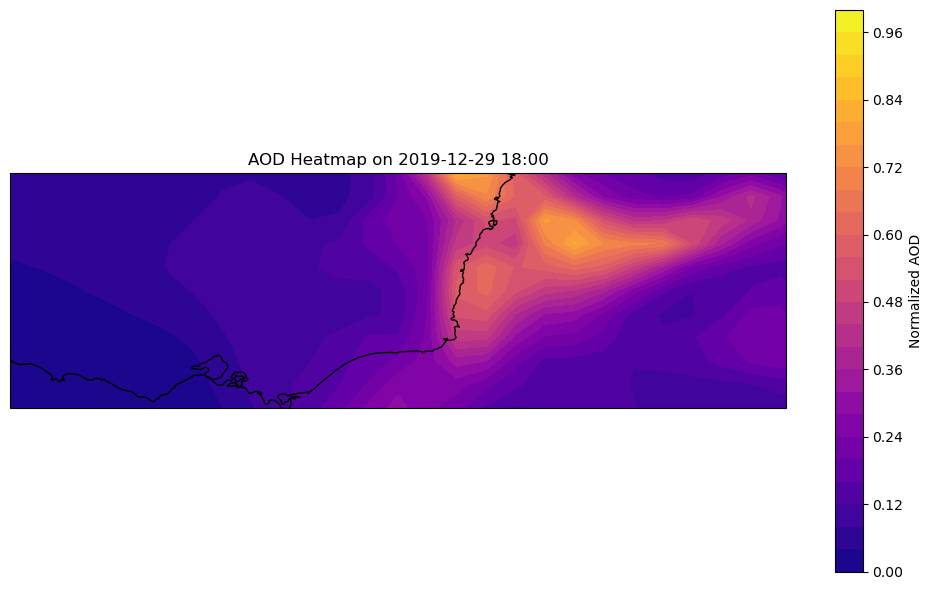

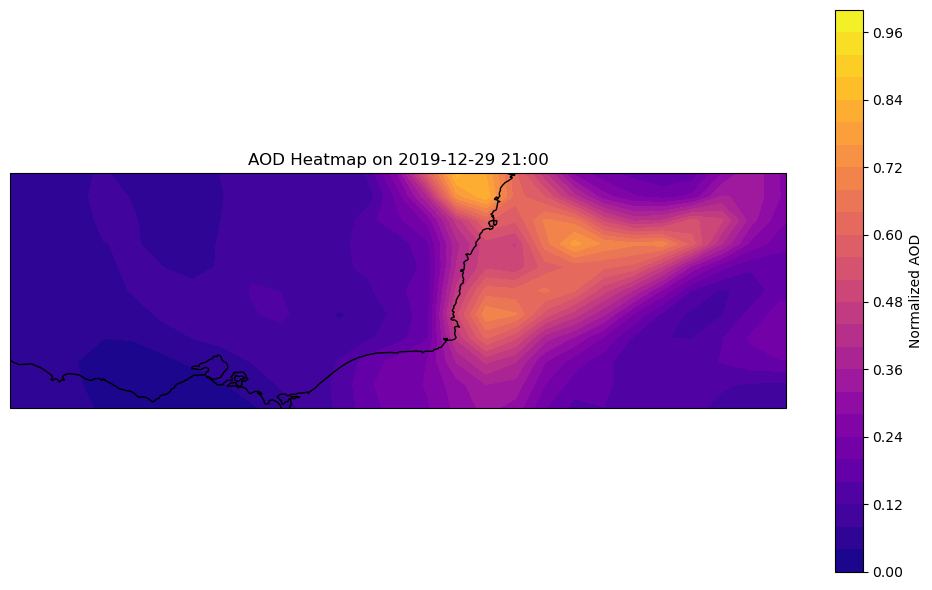

In [24]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from datetime import datetime, timedelta
from netCDF4 import Dataset
import numpy as np
import os

# === CONFIGURATION ===
start_date = datetime(2019, 12, 25)
num_days = 5
folder_path = r"C:\Users\Nur Izfarwiza\Documents\Dissertation\AOD"
file_template = "MERRA2_400.inst3_2d_gas_Nx.{}.nc4"

# === Loop through each day ===
for day_offset in range(num_days):
    date = start_date + timedelta(days=day_offset)
    date_str = date.strftime('%Y%m%d')
    file_path = os.path.join(folder_path, file_template.format(date_str))
    
    if not os.path.exists(file_path):
        print(f"⚠️ File not found: {file_path}")
        continue

    ds = Dataset(file_path)
    aod_data = ds.variables["AODANA"][:]  # shape: (8, 361, 576)
    lats = ds.variables["lat"][:]
    lons = ds.variables["lon"][:]
    times = ds.variables["time"][:]  # usually 3-hour intervals (e.g. [0, 180, ..., 1260])
    lon_grid, lat_grid = np.meshgrid(lons, lats)

    for t_index in range(aod_data.shape[0]):
        aod_slice = aod_data[t_index]
        aod_slice = np.nan_to_num(aod_slice, nan=0.0)
        norm_aod = (aod_slice - np.min(aod_slice)) / (np.max(aod_slice) + 1e-6)
        timestamp = date + timedelta(minutes=int(times[t_index]))

        # === Plotting ===
        plt.figure(figsize=(10, 6))
        ax = plt.axes(projection=ccrs.PlateCarree())
        ax.set_extent([140.5, 157, -39, -34])  # Focus on Victoria/Gippsland
        ax.add_feature(cfeature.COASTLINE)
        ax.add_feature(cfeature.BORDERS)
        ax.add_feature(cfeature.LAND, facecolor='lightgray')

        cf = ax.contourf(lon_grid, lat_grid, norm_aod, levels=30, cmap='plasma', transform=ccrs.PlateCarree())
        plt.colorbar(cf, ax=ax, label="Normalized AOD")
        plt.title(f"AOD Heatmap on {timestamp.strftime('%Y-%m-%d %H:%M')}")
        plt.tight_layout()
        plt.show()

    ds.close()


C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\3317654991.py:43: RuntimeWarning: invalid value encountered in cast
  times = ds.variables["time"][:]  # in minutes
C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\3317654991.py:43: UserWarning: WARNING: valid_range not used since it
cannot be safely cast to variable data type
  times = ds.variables["time"][:]  # in minutes


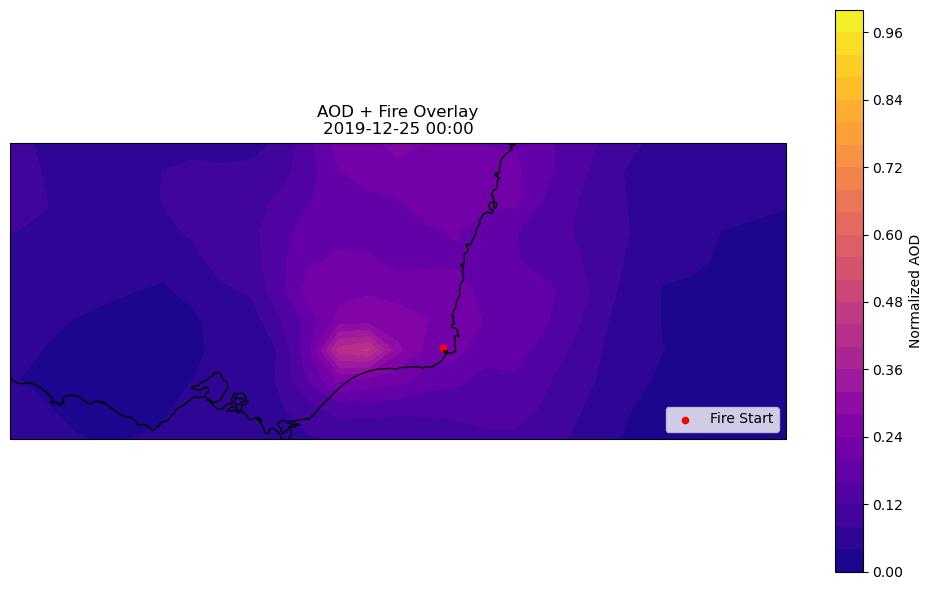

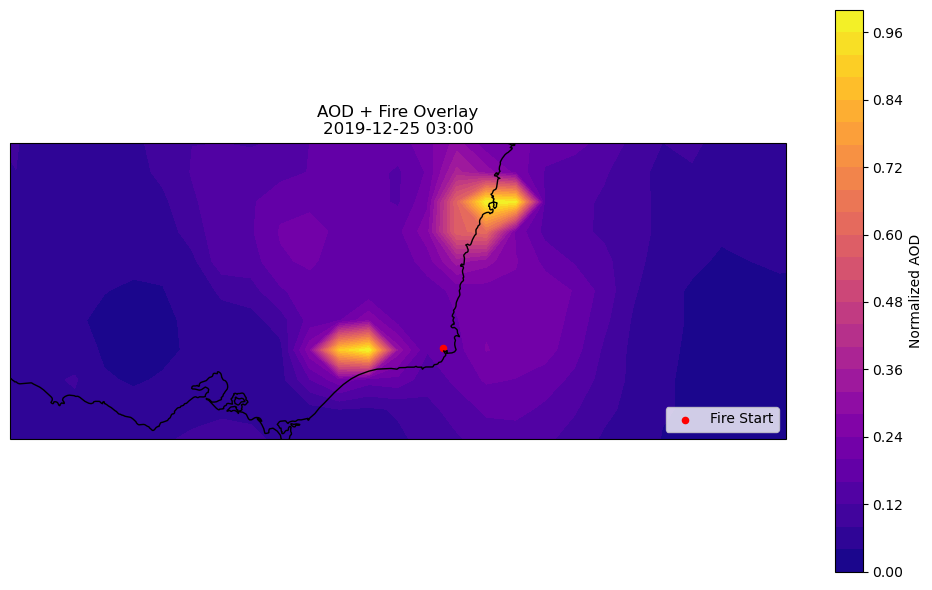

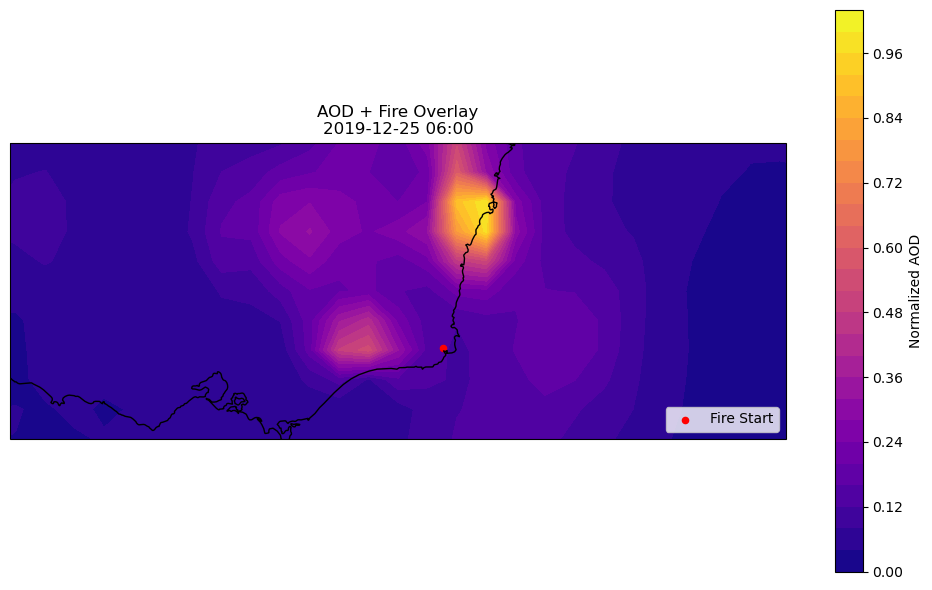

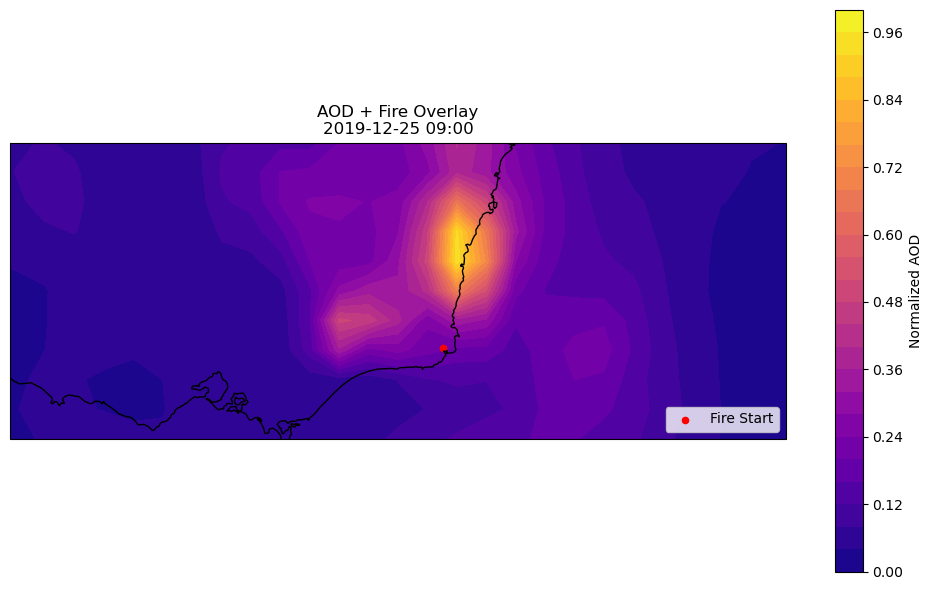

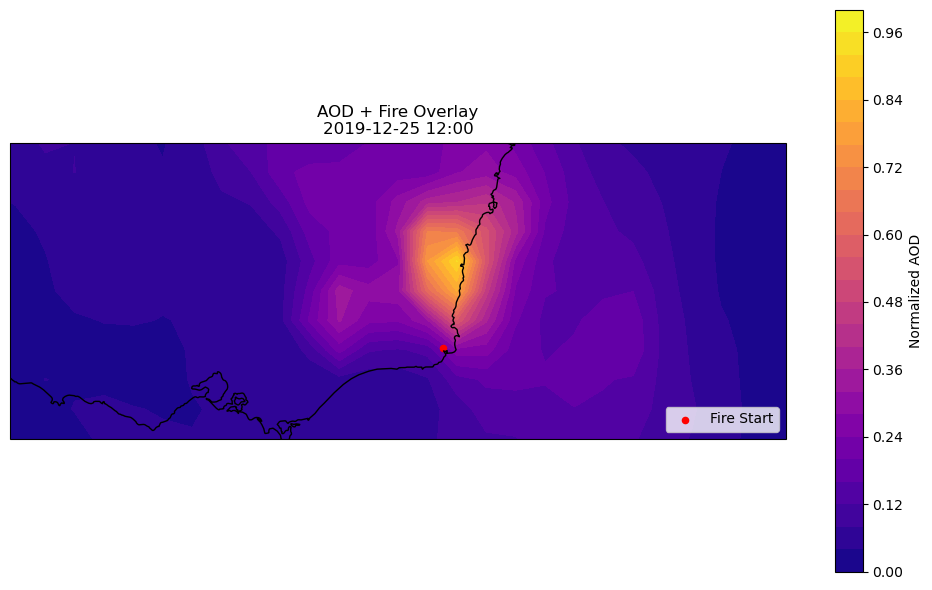

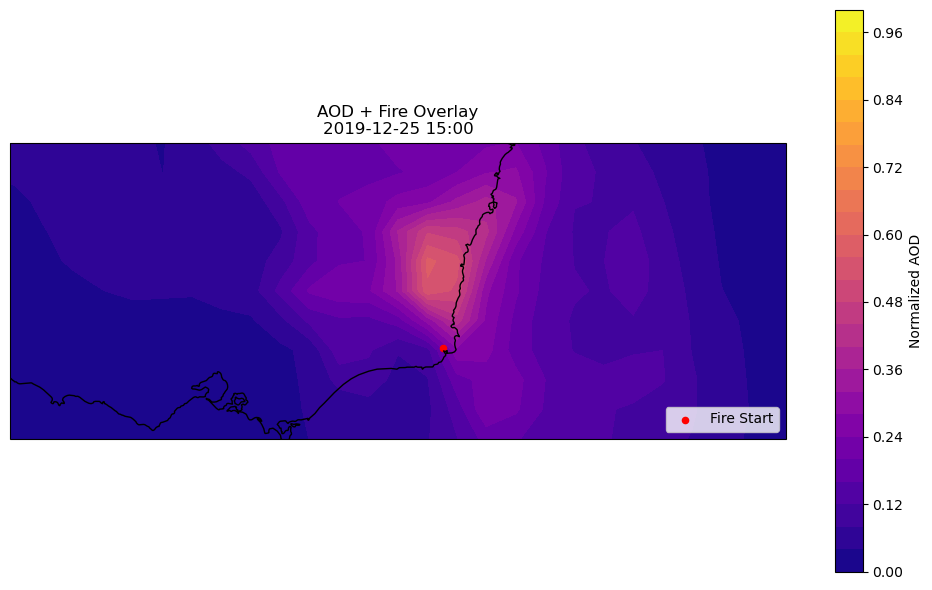

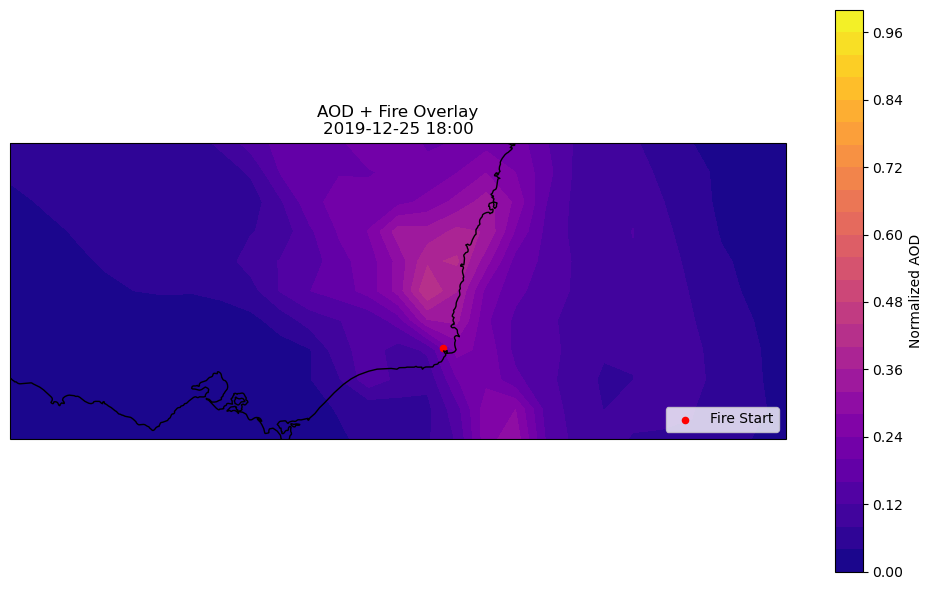

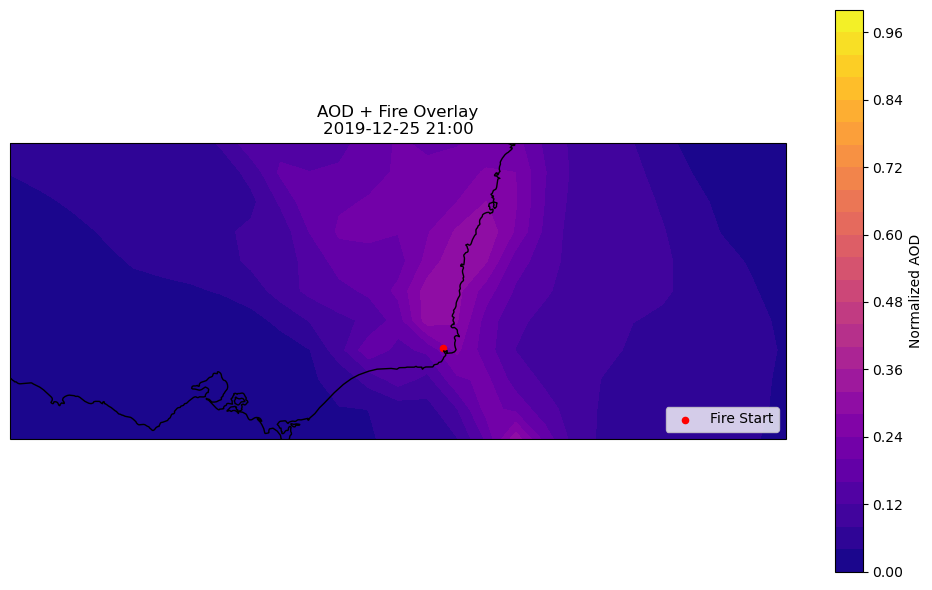

C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\3317654991.py:43: RuntimeWarning: invalid value encountered in cast
  times = ds.variables["time"][:]  # in minutes
C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\3317654991.py:43: UserWarning: WARNING: valid_range not used since it
cannot be safely cast to variable data type
  times = ds.variables["time"][:]  # in minutes


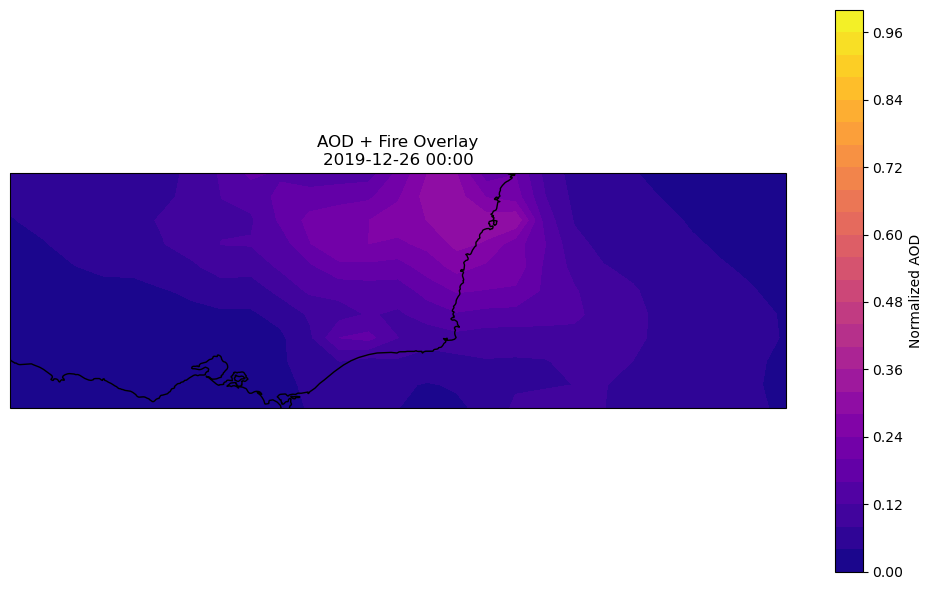

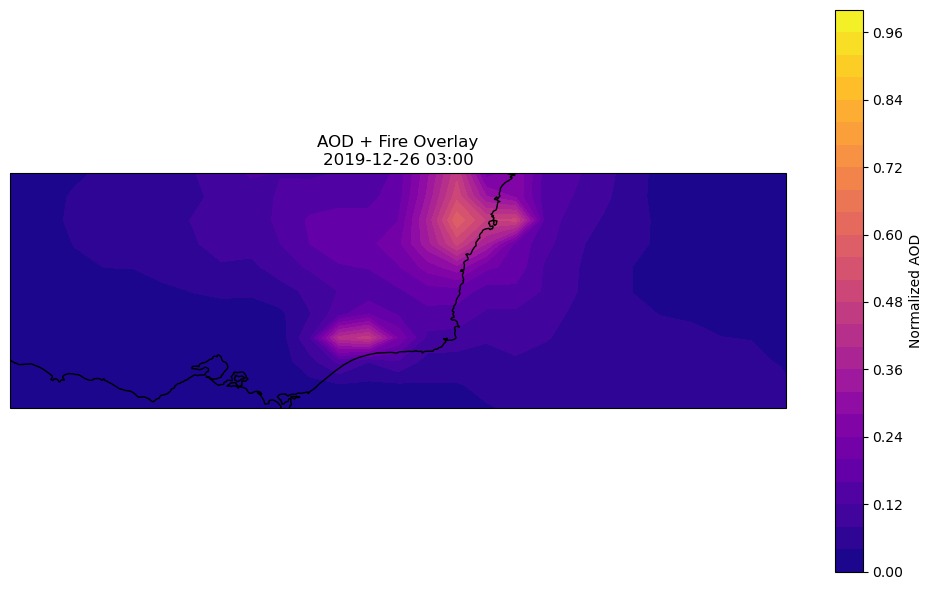

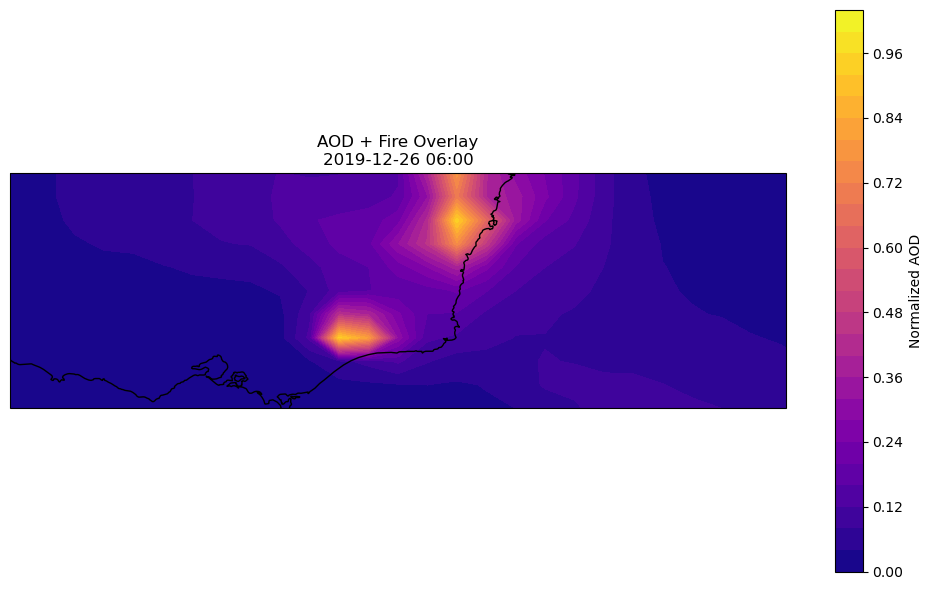

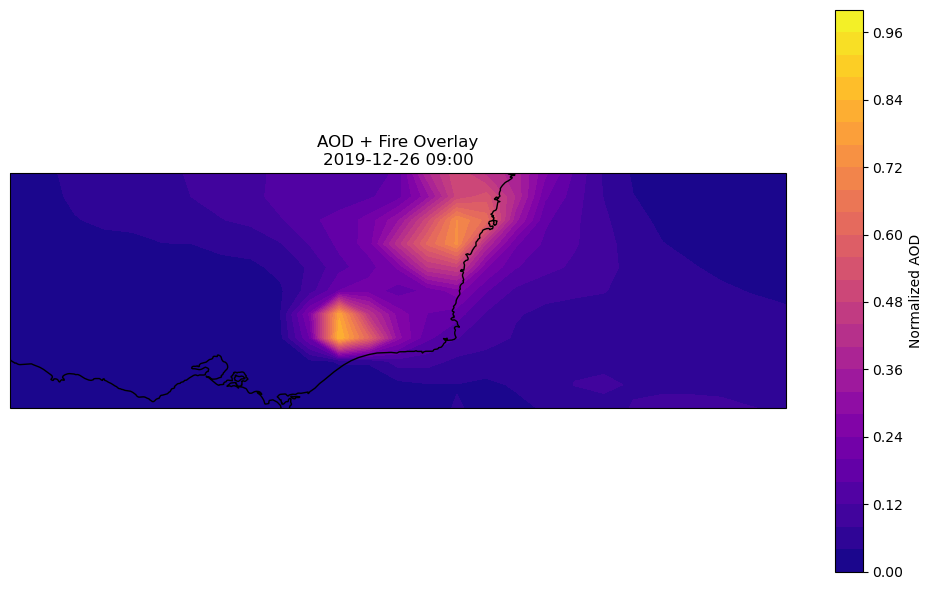

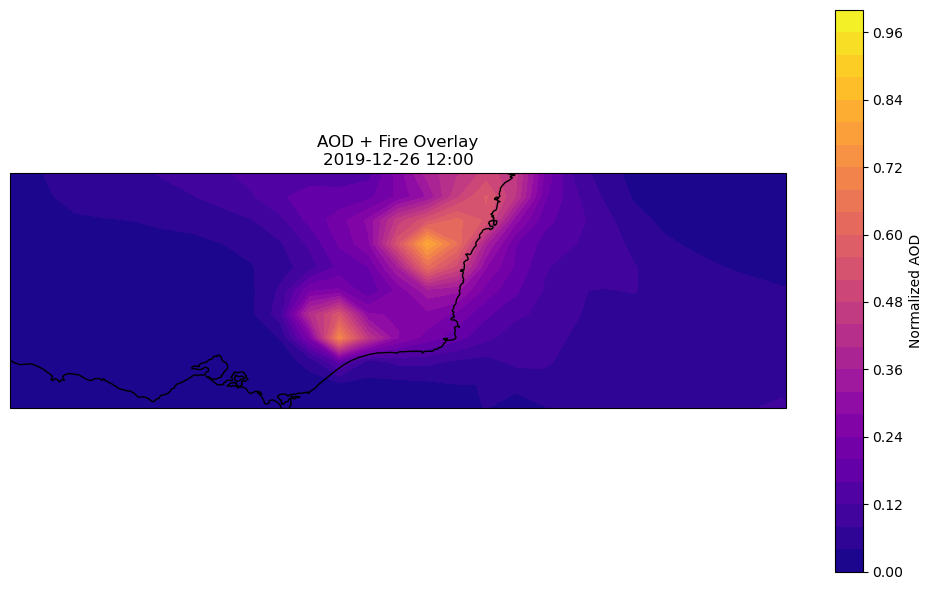

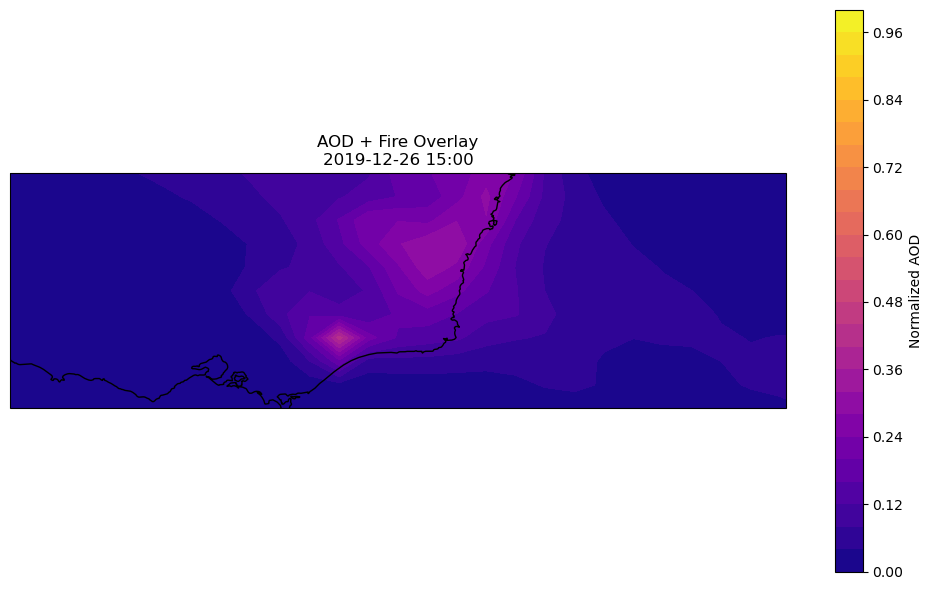

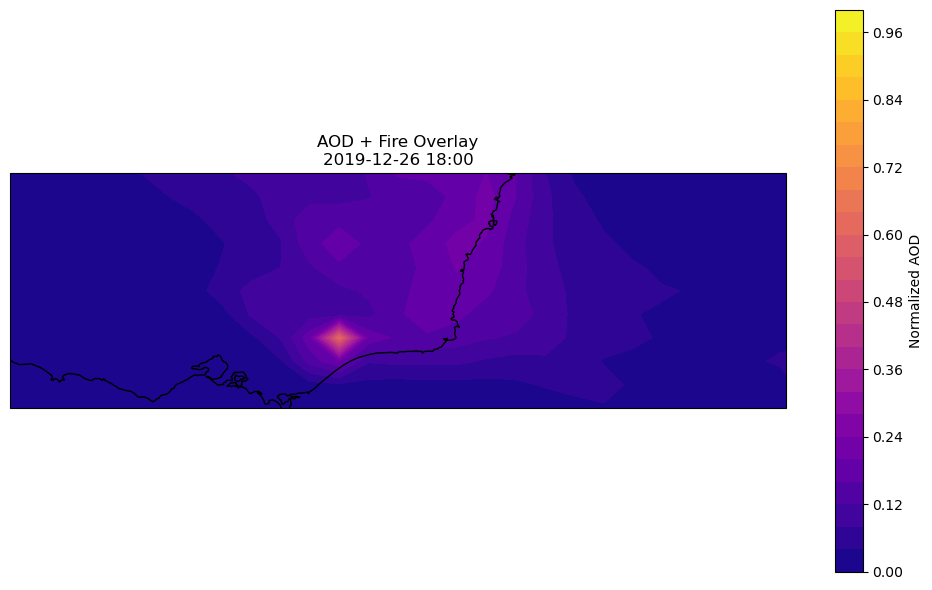

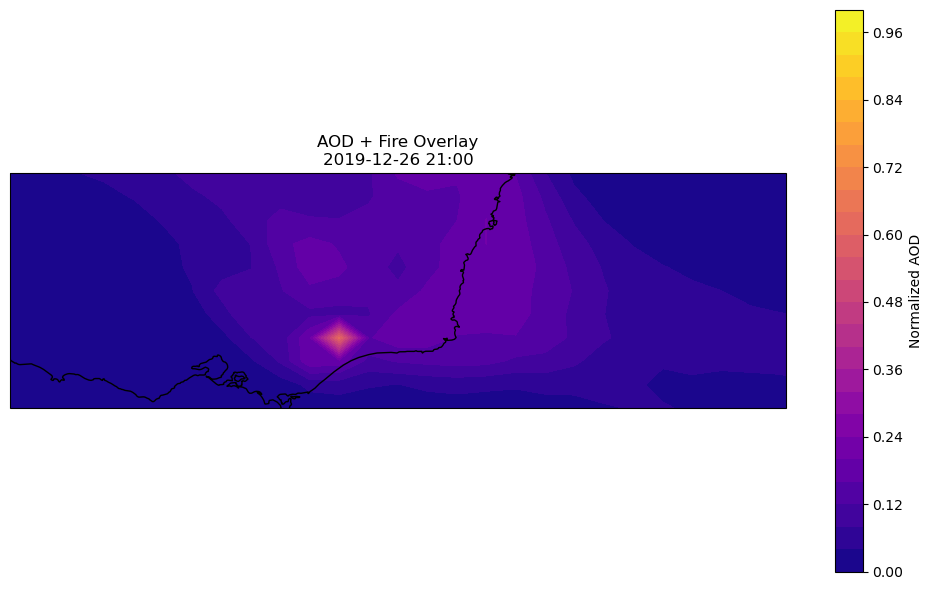

C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\3317654991.py:43: RuntimeWarning: invalid value encountered in cast
  times = ds.variables["time"][:]  # in minutes
C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\3317654991.py:43: UserWarning: WARNING: valid_range not used since it
cannot be safely cast to variable data type
  times = ds.variables["time"][:]  # in minutes


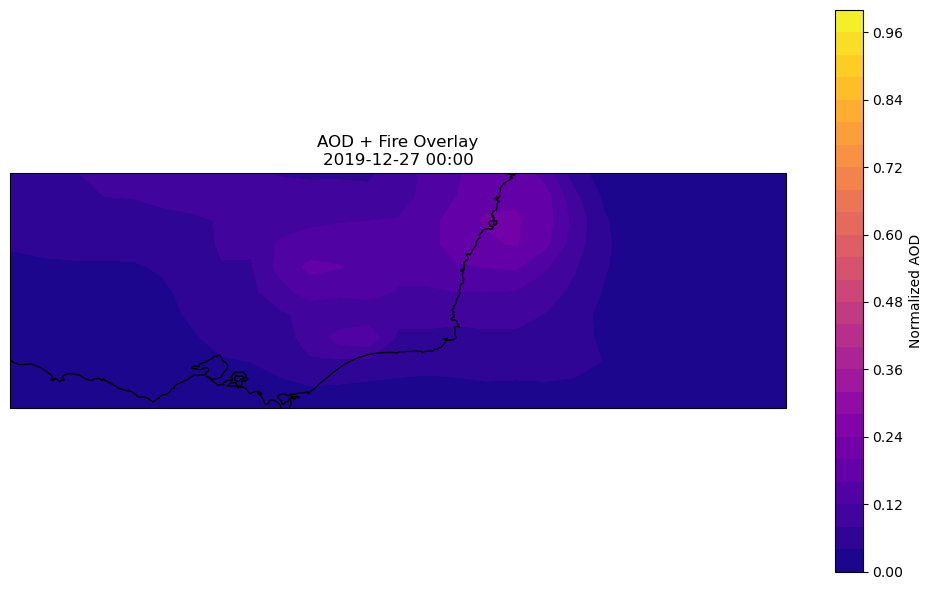

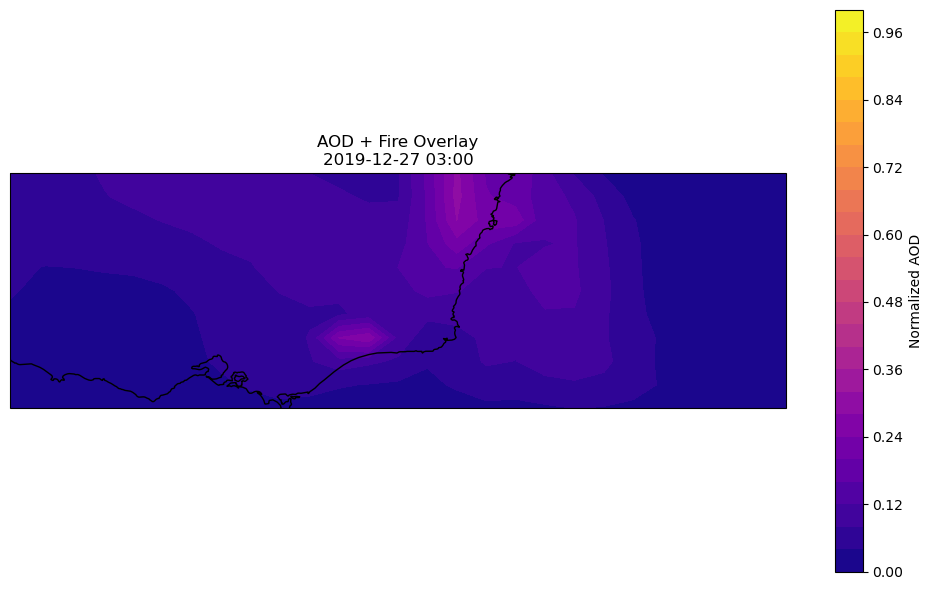

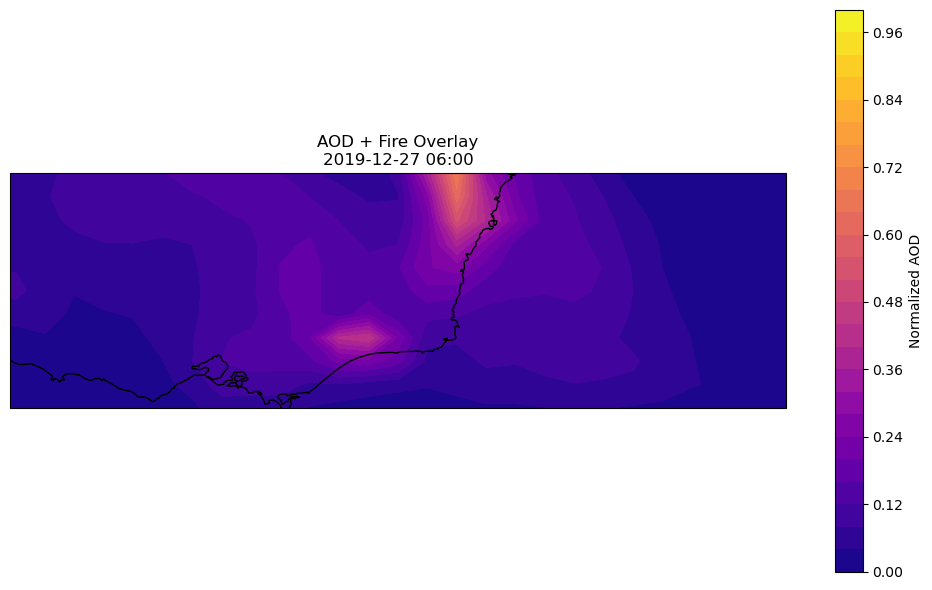

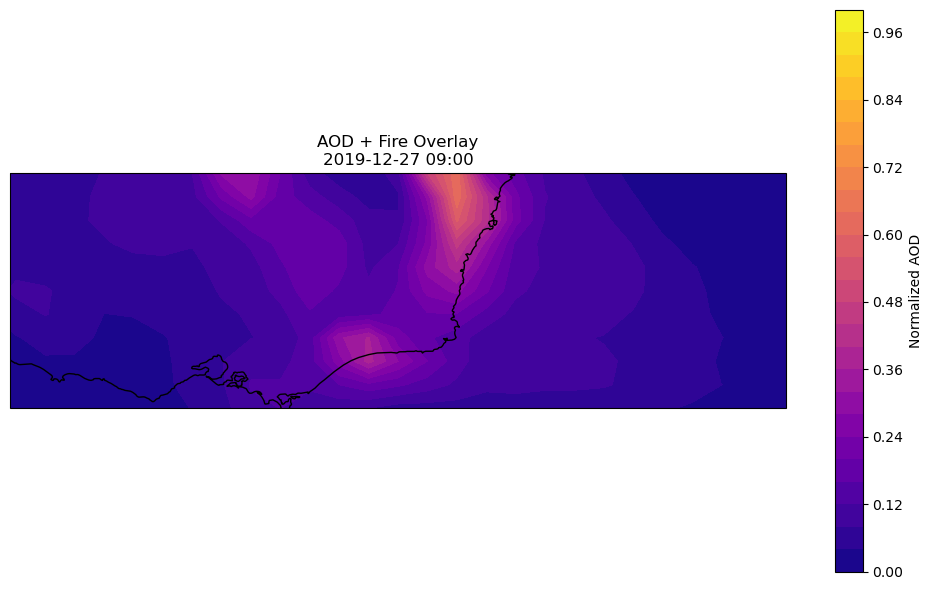

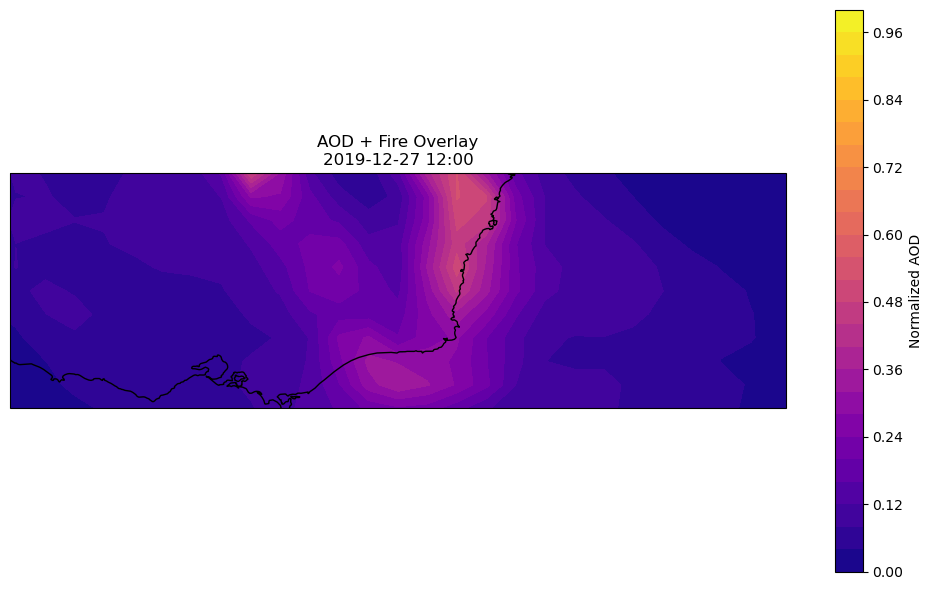

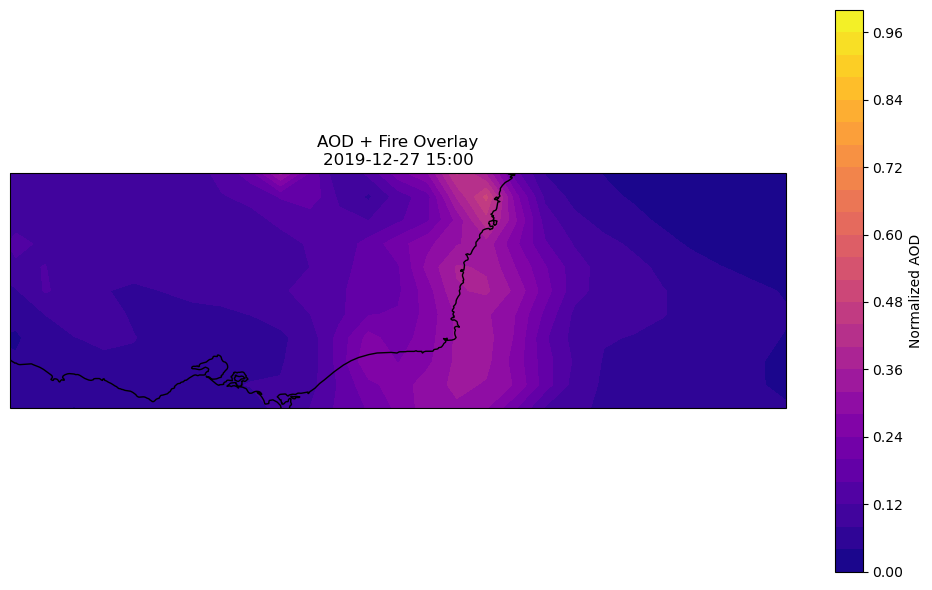

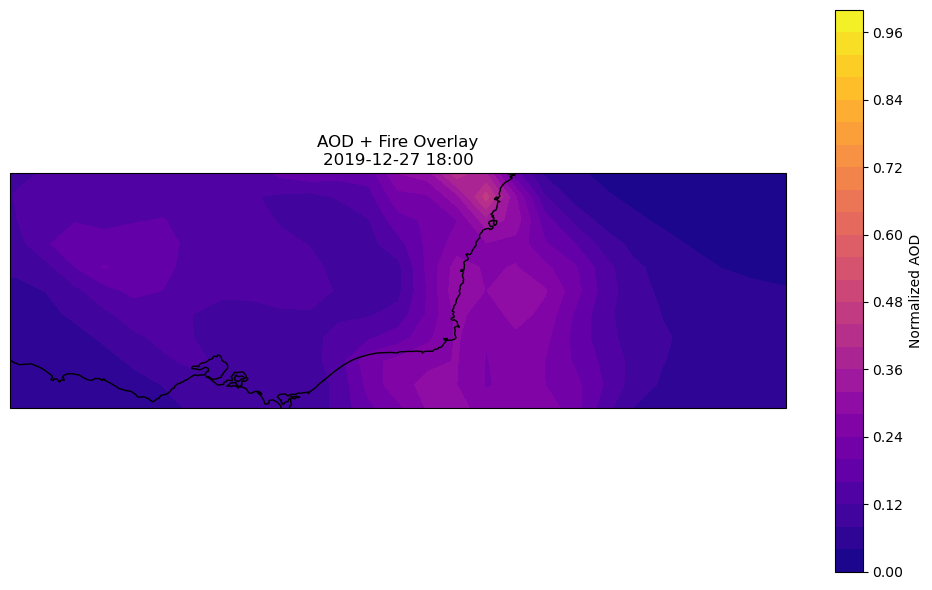

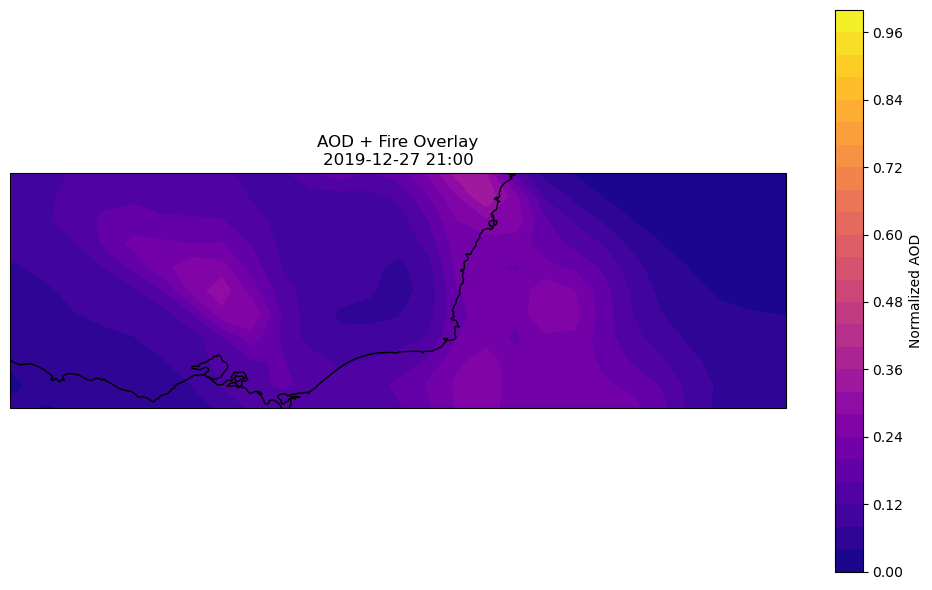

C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\3317654991.py:43: RuntimeWarning: invalid value encountered in cast
  times = ds.variables["time"][:]  # in minutes
C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\3317654991.py:43: UserWarning: WARNING: valid_range not used since it
cannot be safely cast to variable data type
  times = ds.variables["time"][:]  # in minutes


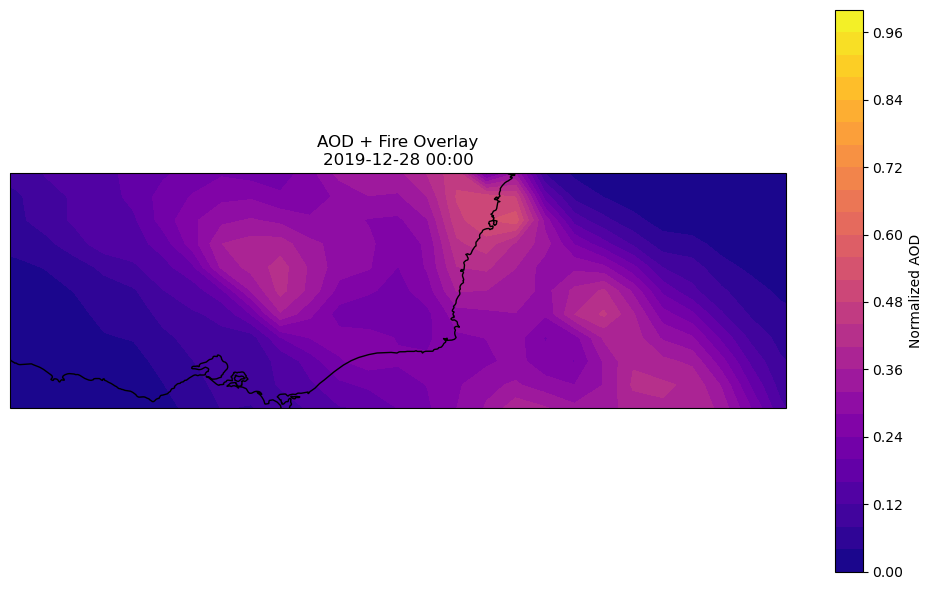

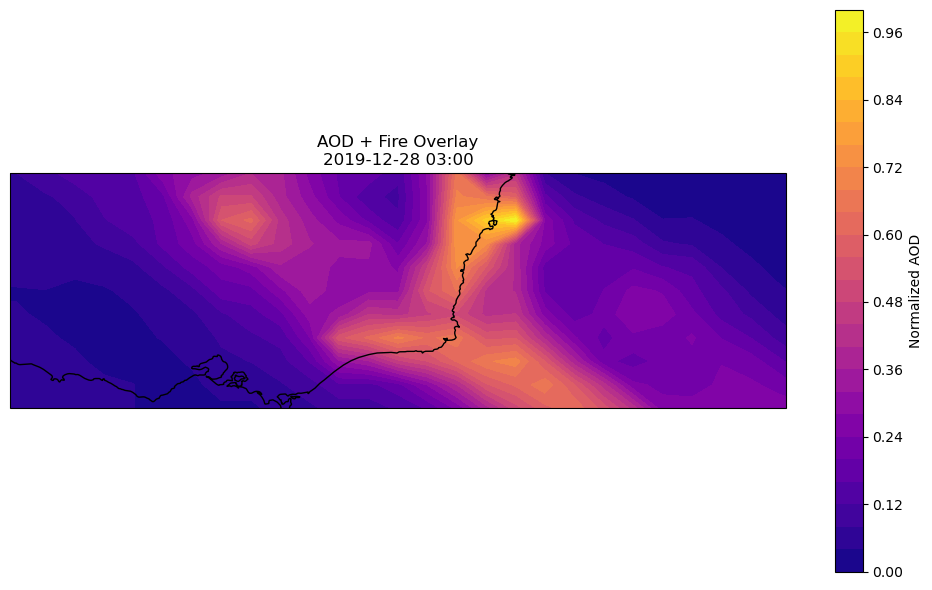

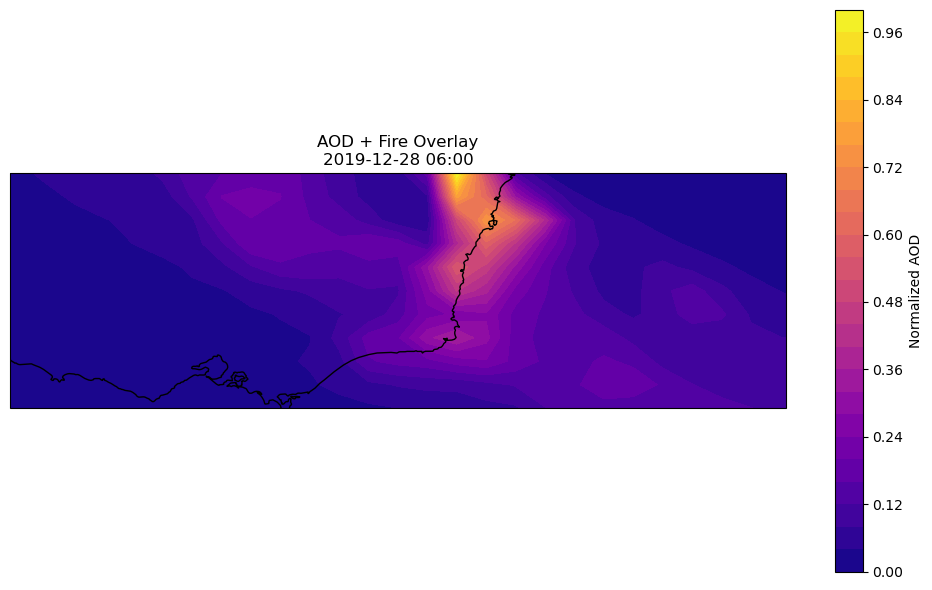

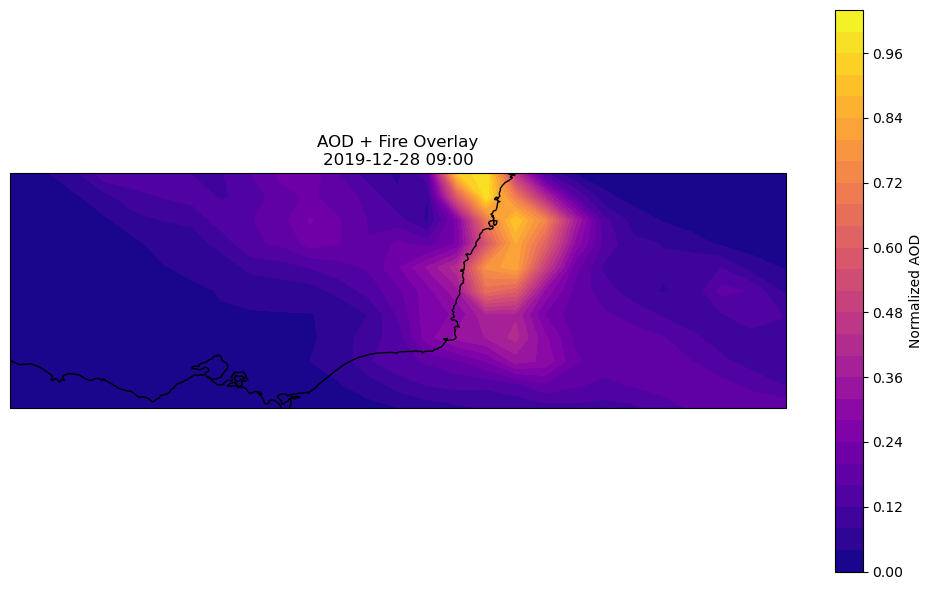

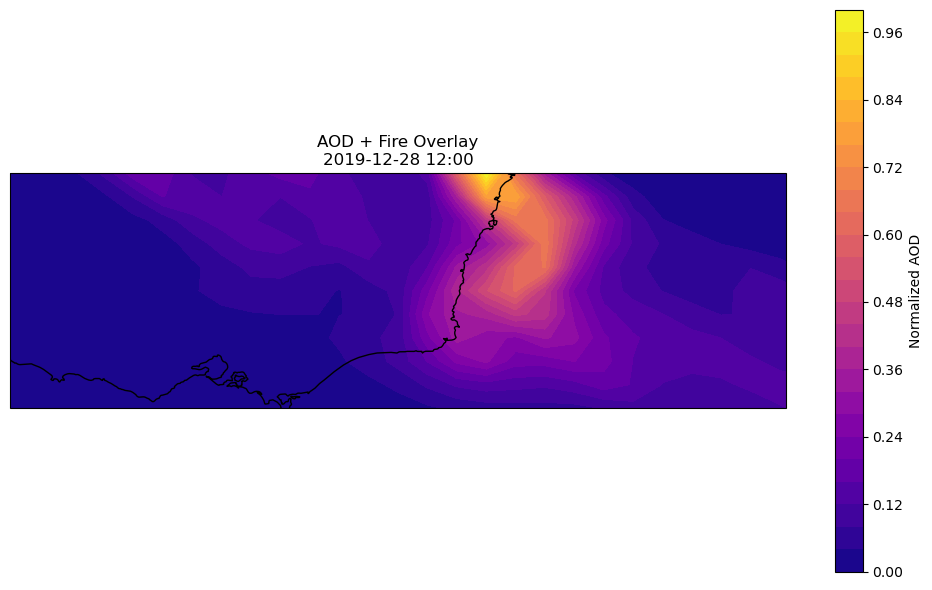

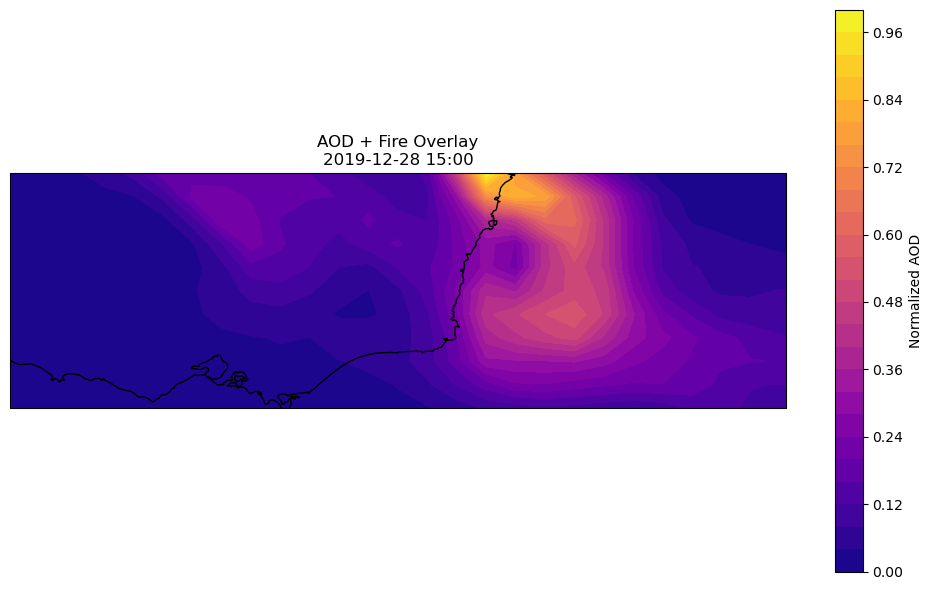

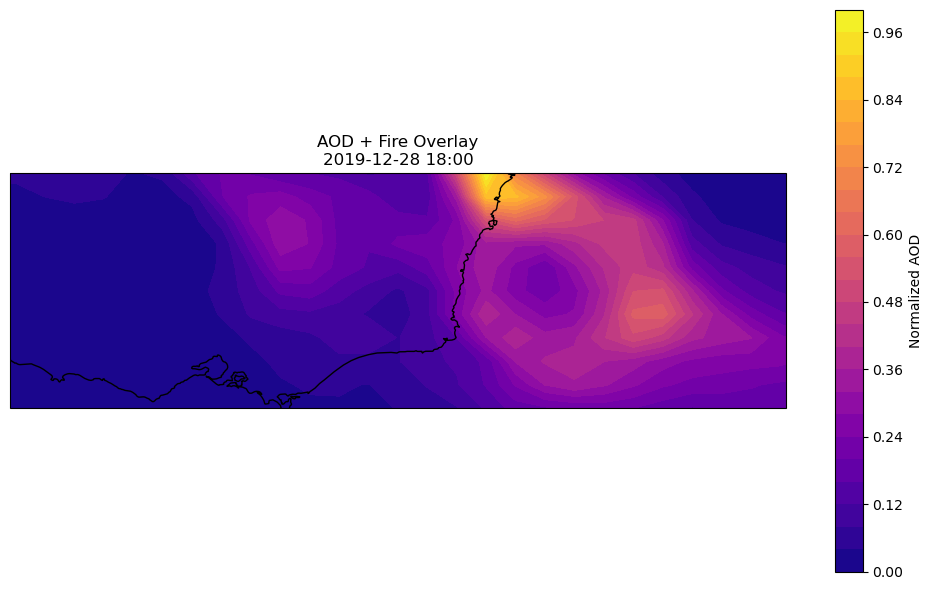

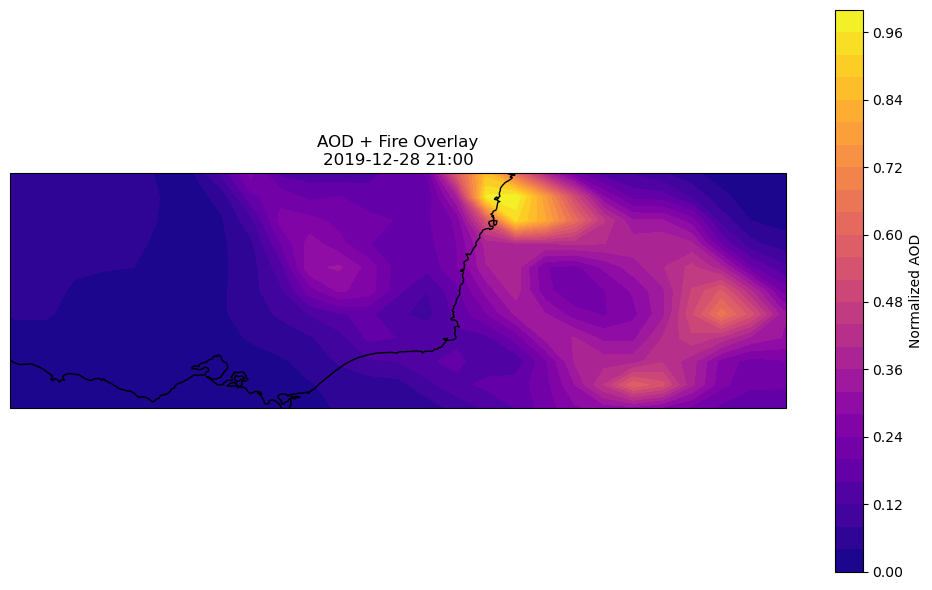

C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\3317654991.py:43: RuntimeWarning: invalid value encountered in cast
  times = ds.variables["time"][:]  # in minutes
C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\3317654991.py:43: UserWarning: WARNING: valid_range not used since it
cannot be safely cast to variable data type
  times = ds.variables["time"][:]  # in minutes


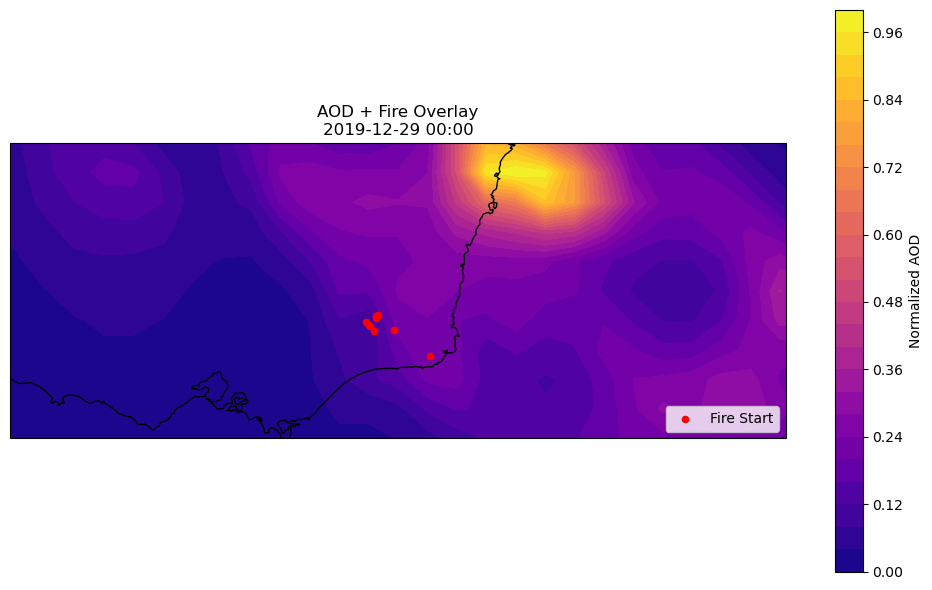

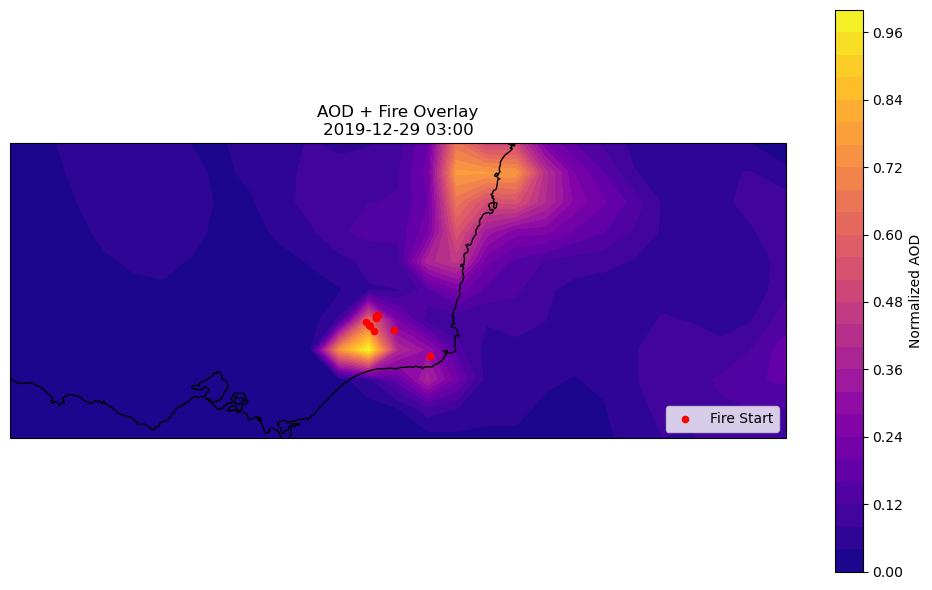

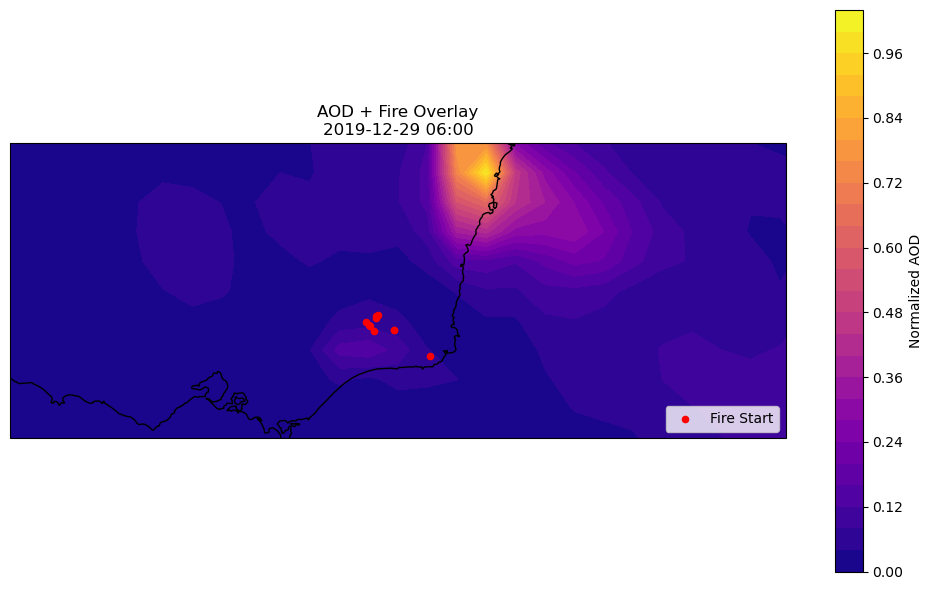

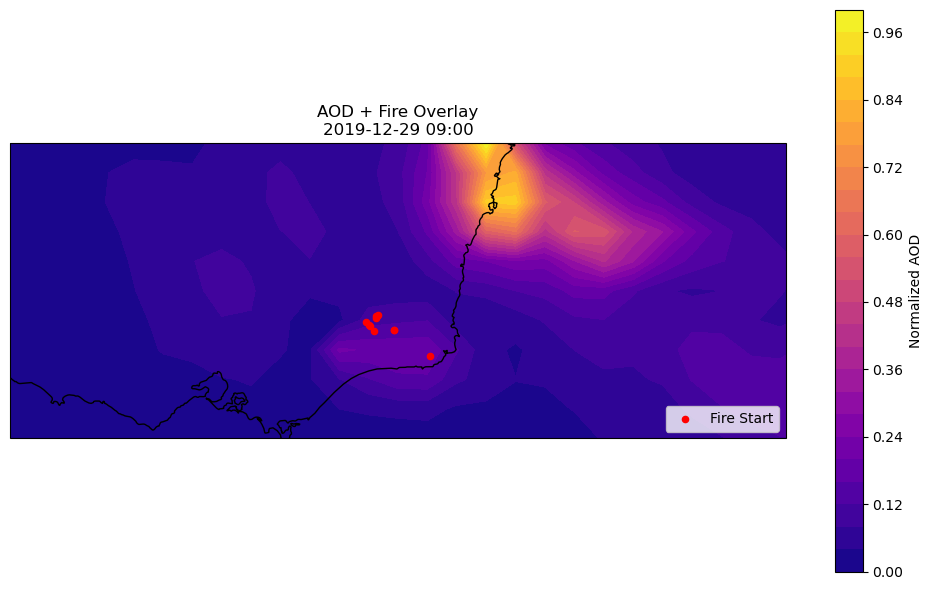

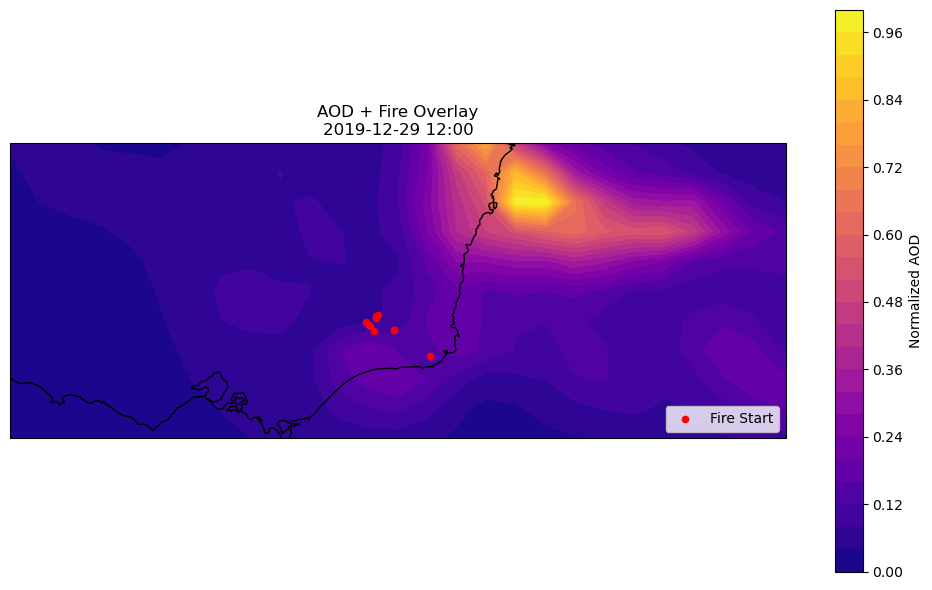

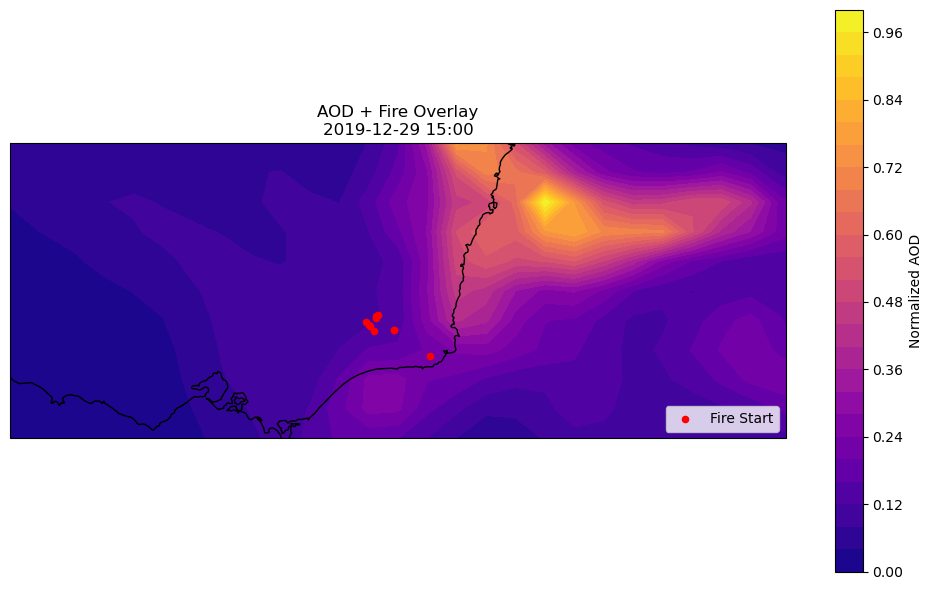

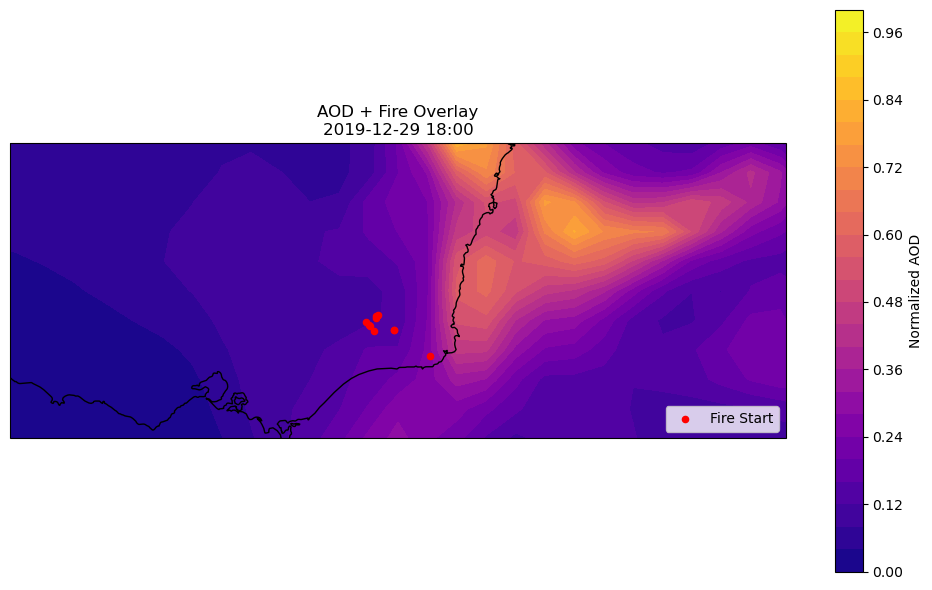

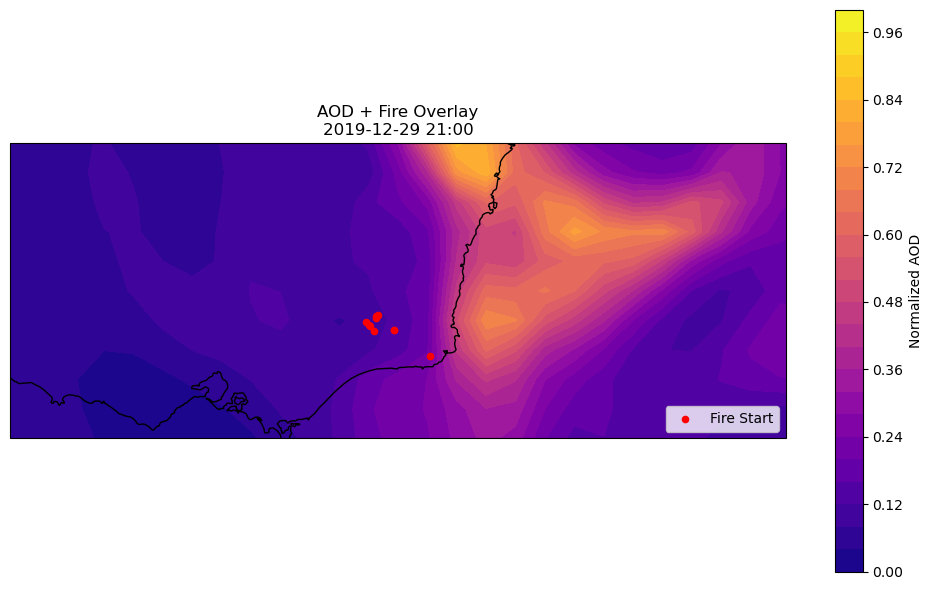

In [26]:
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from datetime import datetime, timedelta
from netCDF4 import Dataset
import numpy as np
import os
import pandas as pd

# === Fire shapefile ===
fire_path = r"C:\Users\Nur Izfarwiza\Documents\Dissertation\Order_CD850U\mga94_54\esrishape\cma100\East Gippsland-0\FIRE\FIRE_HISTORY_ORIGIN.shp"
gdf = gpd.read_file(fire_path)
gdf = gdf.to_crs(epsg=4326)  # convert to lat/lon

# === Filter fires between Dec 2019 and Jan 2020 ===
gdf['FIRE_START'] = pd.to_datetime(gdf['FIRE_START'], errors='coerce')
filtered_fires = gdf[
    (gdf['FIRE_START'] >= '2019-12-25') & 
    (gdf['FIRE_START'] <= '2020-01-05')
]

# === AOD data config ===
start_date = datetime(2019, 12, 25)
num_days = 5
folder_path = r"C:\Users\Nur Izfarwiza\Documents\Dissertation\AOD"
file_template = "MERRA2_400.inst3_2d_gas_Nx.{}.nc4"

# === Loop through AOD files ===
for day_offset in range(num_days):
    date = start_date + timedelta(days=day_offset)
    date_str = date.strftime('%Y%m%d')
    file_path = os.path.join(folder_path, file_template.format(date_str))

    if not os.path.exists(file_path):
        print(f"⚠️ File not found: {file_path}")
        continue

    ds = Dataset(file_path)
    aod_data = ds.variables["AODANA"][:]  # shape (8, 361, 576)
    lats = ds.variables["lat"][:]
    lons = ds.variables["lon"][:]
    times = ds.variables["time"][:]  # in minutes
    lon_grid, lat_grid = np.meshgrid(lons, lats)

    for t_index in range(aod_data.shape[0]):
        aod_slice = np.nan_to_num(aod_data[t_index], nan=0.0)
        norm_aod = (aod_slice - np.min(aod_slice)) / (np.max(aod_slice) + 1e-6)
        timestamp = date + timedelta(minutes=int(times[t_index]))
        current_date = timestamp.date()

        # Get fire points for this timestamp
        daily_fires = filtered_fires[filtered_fires['FIRE_START'].dt.date == current_date]

        # === Plotting ===
        plt.figure(figsize=(10, 6))
        ax = plt.axes(projection=ccrs.PlateCarree())
        ax.set_extent([140.5, 157, -39, -34])  # Zoom on Victoria
        ax.add_feature(cfeature.COASTLINE)
        ax.add_feature(cfeature.BORDERS)
        ax.add_feature(cfeature.LAND, facecolor='lightgray')

        # AOD heatmap
        cf = ax.contourf(lon_grid, lat_grid, norm_aod, levels=30, cmap='plasma', transform=ccrs.PlateCarree())
        plt.colorbar(cf, ax=ax, label='Normalized AOD')

        # Fire overlay
        if not daily_fires.empty:
            daily_fires.plot(ax=ax, color='red', markersize=20, label='Fire Start')
            plt.legend(loc='lower right')

        plt.title(f"AOD + Fire Overlay\n{timestamp.strftime('%Y-%m-%d %H:%M')}")
        plt.tight_layout()
        plt.show()

    ds.close()


C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\330986273.py:15: RuntimeWarning: invalid value encountered in cast
  times = ds.variables["time"][:]  # in hours from midnight
C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\330986273.py:15: UserWarning: WARNING: valid_range not used since it
cannot be safely cast to variable data type
  times = ds.variables["time"][:]  # in hours from midnight


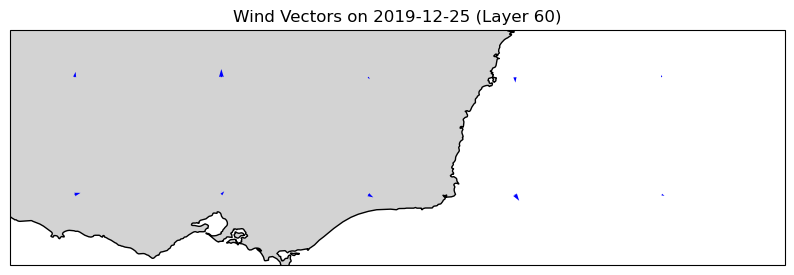

In [27]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from netCDF4 import Dataset
from datetime import datetime

# === Load wind data for a specific day ===
file_path = r"C:\Users\Nur Izfarwiza\Documents\Dissertation\Wind\MERRA2_400.tavg3_3d_asm_Nv.20191225.nc4"
ds = Dataset(file_path)

# === Extract relevant data ===
lats = ds.variables["lat"][:]
lons = ds.variables["lon"][:]
times = ds.variables["time"][:]  # in hours from midnight
U = ds.variables["U"][:, 60, :, :]  # Layer 60
V = ds.variables["V"][:, 60, :, :]

# === Choose time index to visualize ===
t_index = 0
u_slice = U[t_index]
v_slice = V[t_index]
lon_grid, lat_grid = np.meshgrid(lons, lats)

# === Subsample for visualization clarity ===
step = 5
lon_sub = lon_grid[::step, ::step]
lat_sub = lat_grid[::step, ::step]
u_sub = u_slice[::step, ::step]
v_sub = v_slice[::step, ::step]

# === Plot wind vectors ===
fig = plt.figure(figsize=(10, 6))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([140.5, 157, -39, -34])
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS)
ax.add_feature(cfeature.LAND, facecolor='lightgray')

# Wind arrows
ax.quiver(lon_sub, lat_sub, u_sub, v_sub, transform=ccrs.PlateCarree(), color='blue', scale=700)
plt.title("Wind Vectors on 2019-12-25 (Layer 60)")
plt.show()

ds.close()


C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\573922315.py:45: RuntimeWarning: invalid value encountered in cast
  aod_times = ds_aod.variables["time"][:]   # in minutes
C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\573922315.py:45: UserWarning: WARNING: valid_range not used since it
cannot be safely cast to variable data type
  aod_times = ds_aod.variables["time"][:]   # in minutes
C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\573922315.py:56: RuntimeWarning: invalid value encountered in cast
  wind_times = ds_wind.variables["time"][:]  # in hours
C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\573922315.py:56: UserWarning: WARNING: valid_range not used since it
cannot be safely cast to variable data type
  wind_times = ds_wind.variables["time"][:]  # in hours


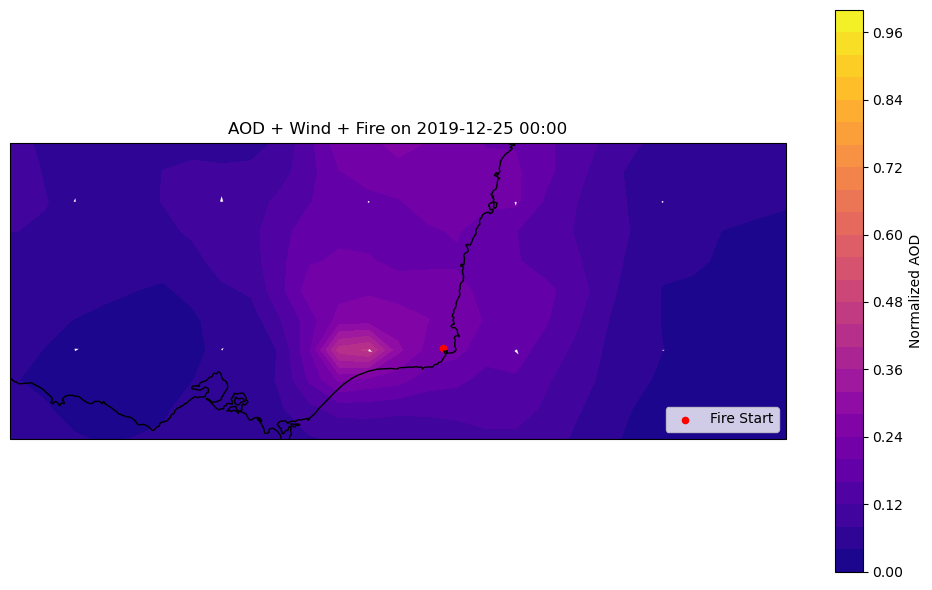

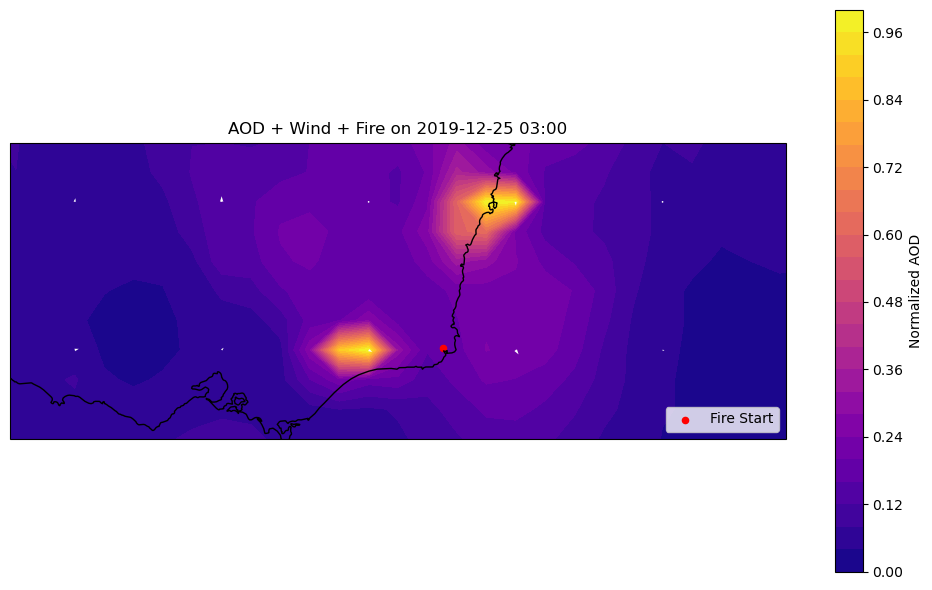

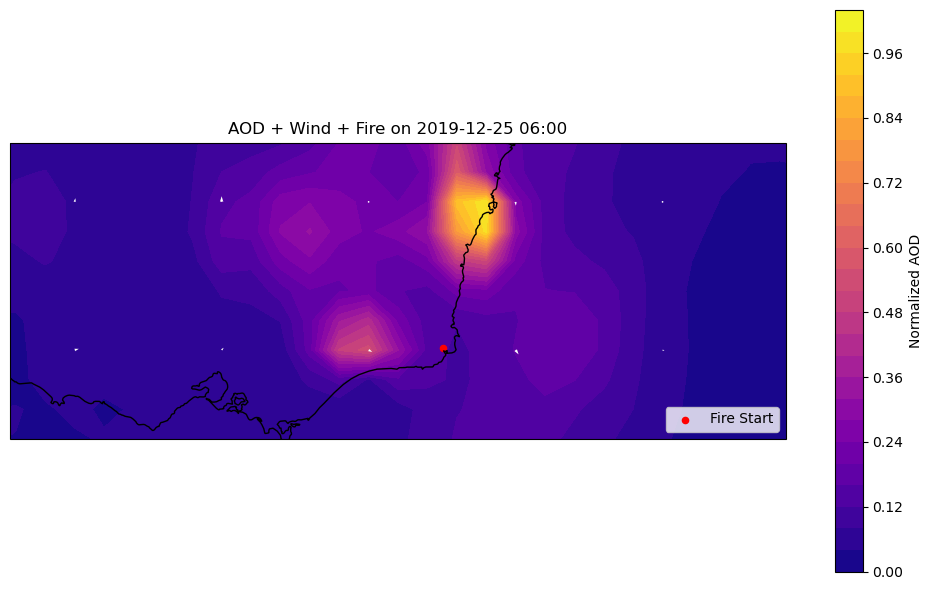

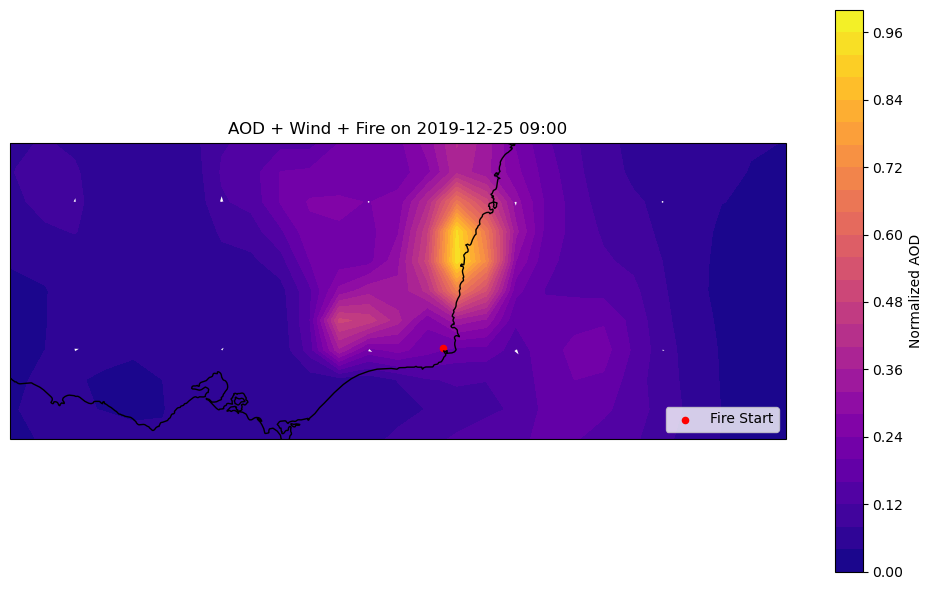

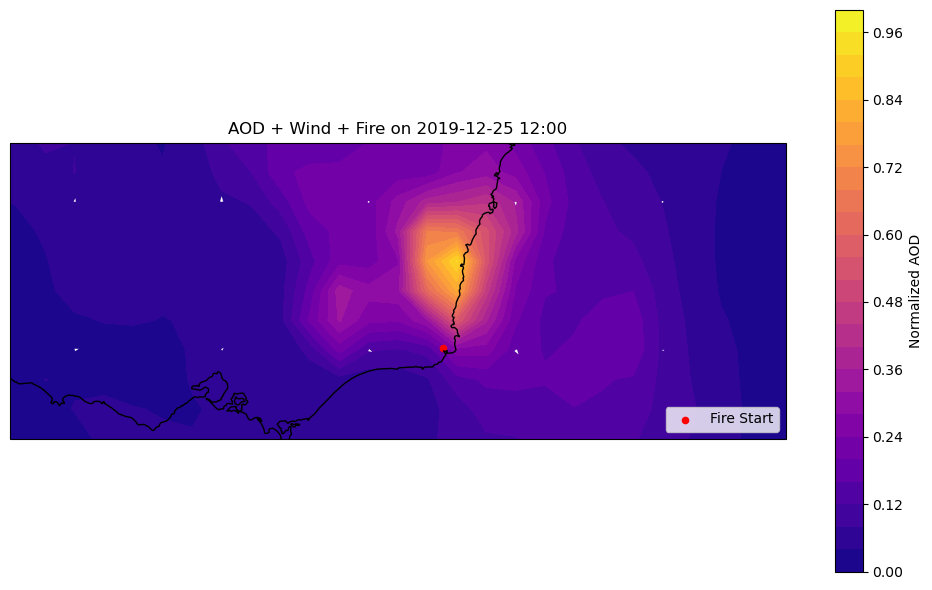

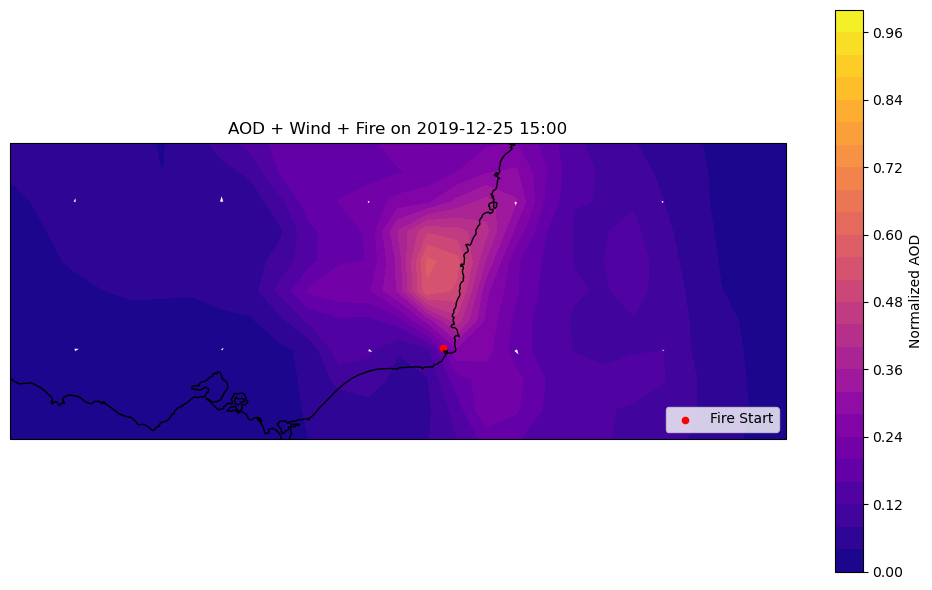

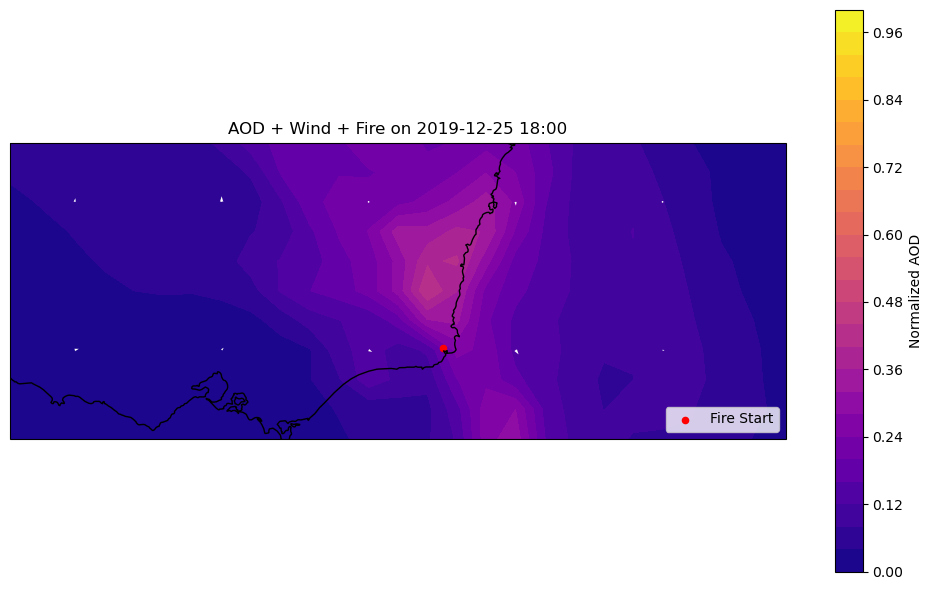

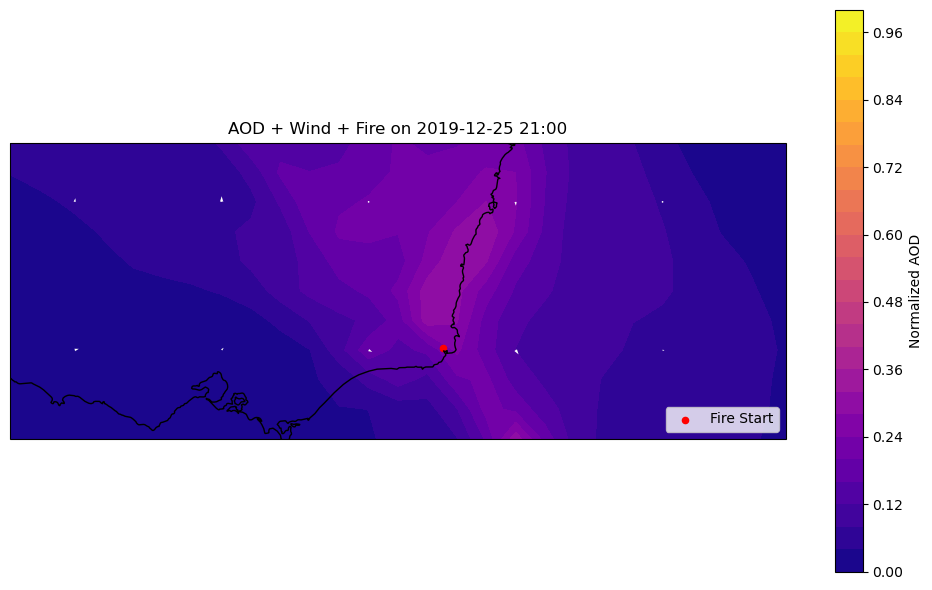

C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\573922315.py:45: RuntimeWarning: invalid value encountered in cast
  aod_times = ds_aod.variables["time"][:]   # in minutes
C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\573922315.py:45: UserWarning: WARNING: valid_range not used since it
cannot be safely cast to variable data type
  aod_times = ds_aod.variables["time"][:]   # in minutes
C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\573922315.py:56: RuntimeWarning: invalid value encountered in cast
  wind_times = ds_wind.variables["time"][:]  # in hours
C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\573922315.py:56: UserWarning: WARNING: valid_range not used since it
cannot be safely cast to variable data type
  wind_times = ds_wind.variables["time"][:]  # in hours


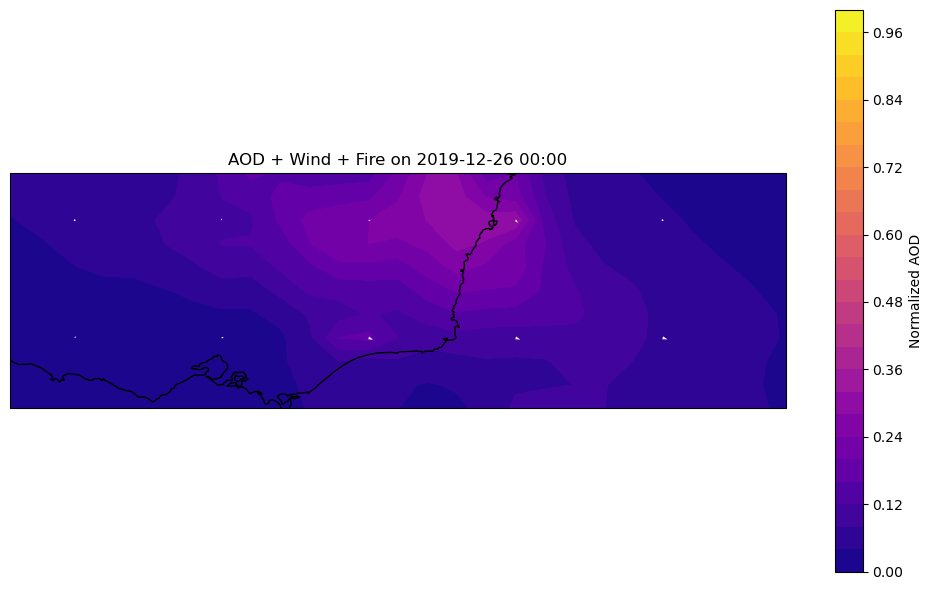

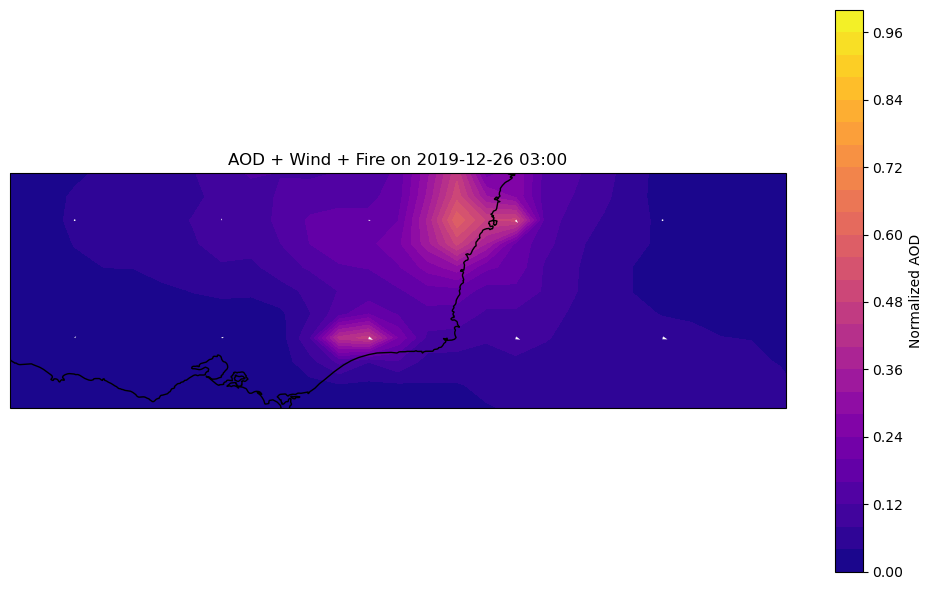

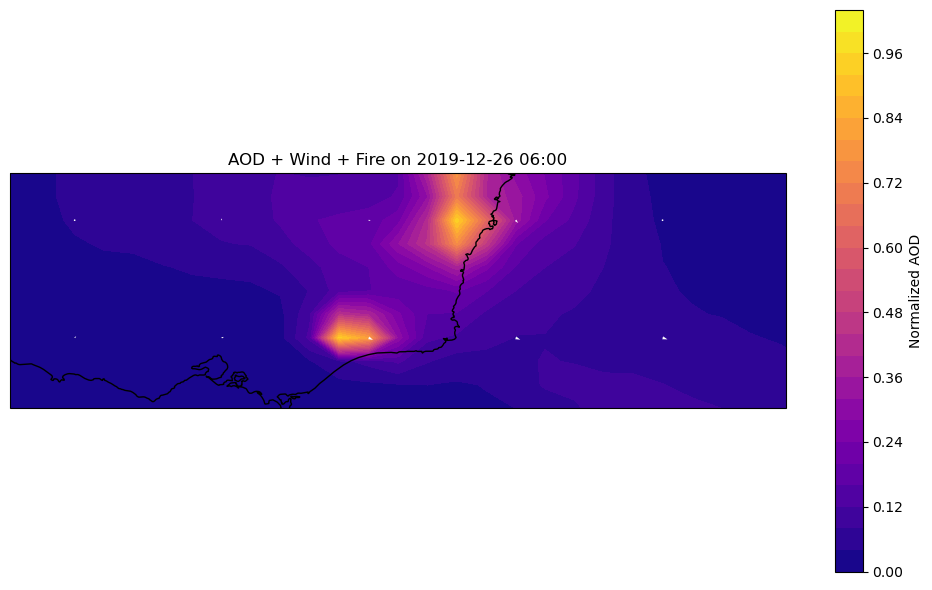

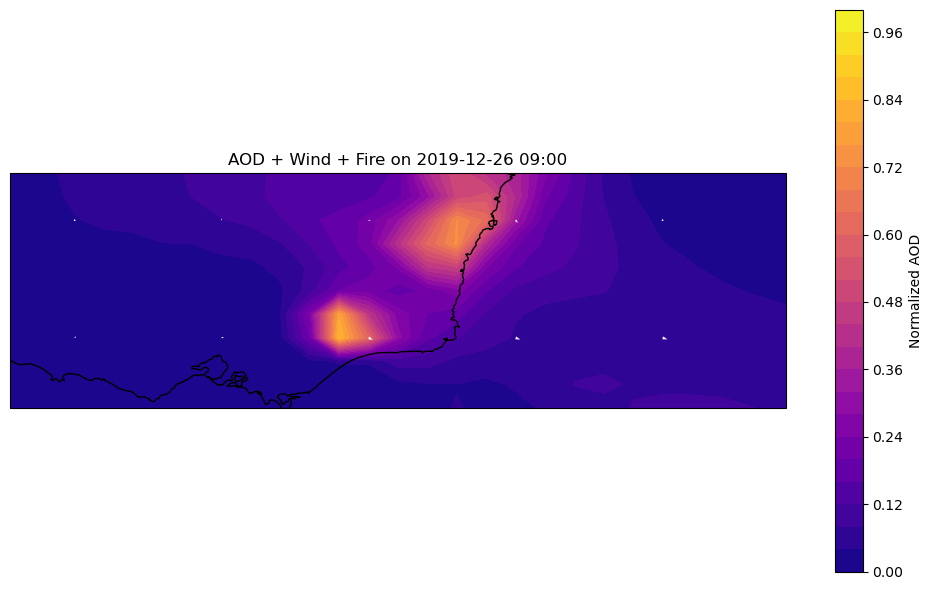

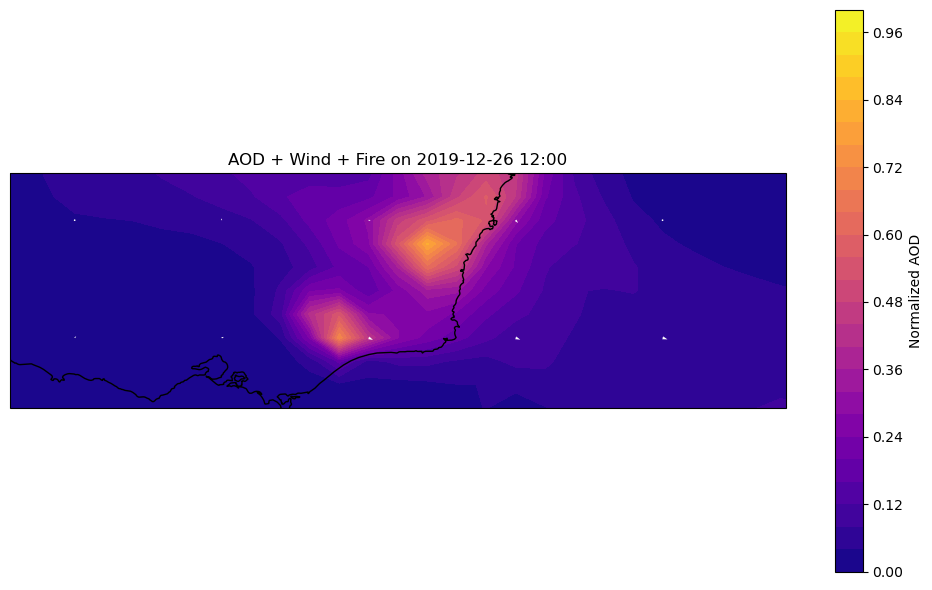

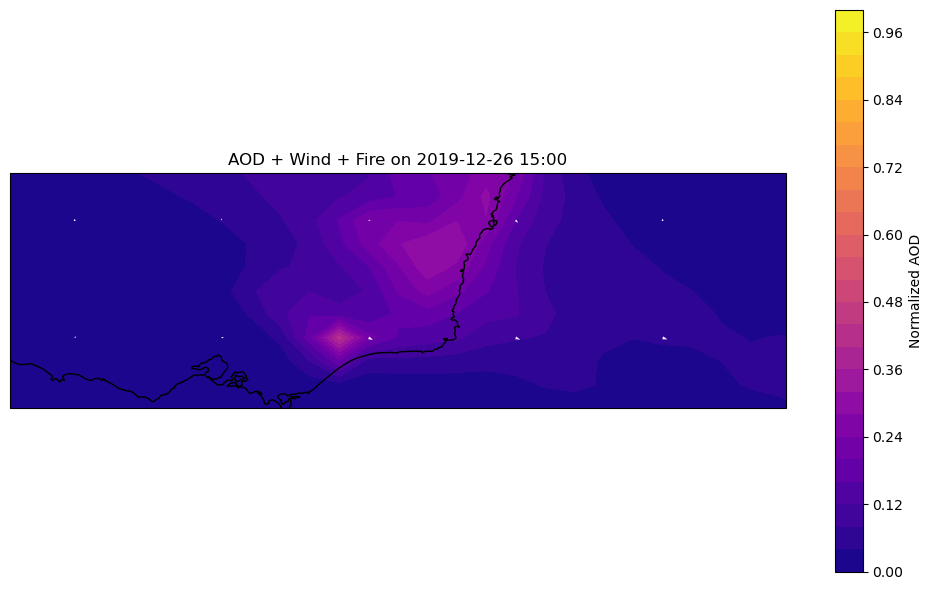

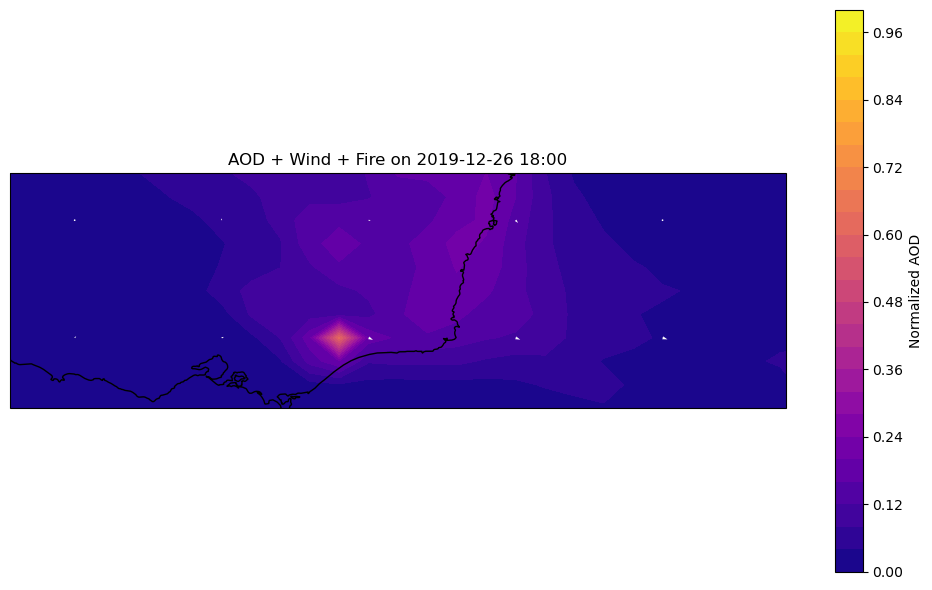

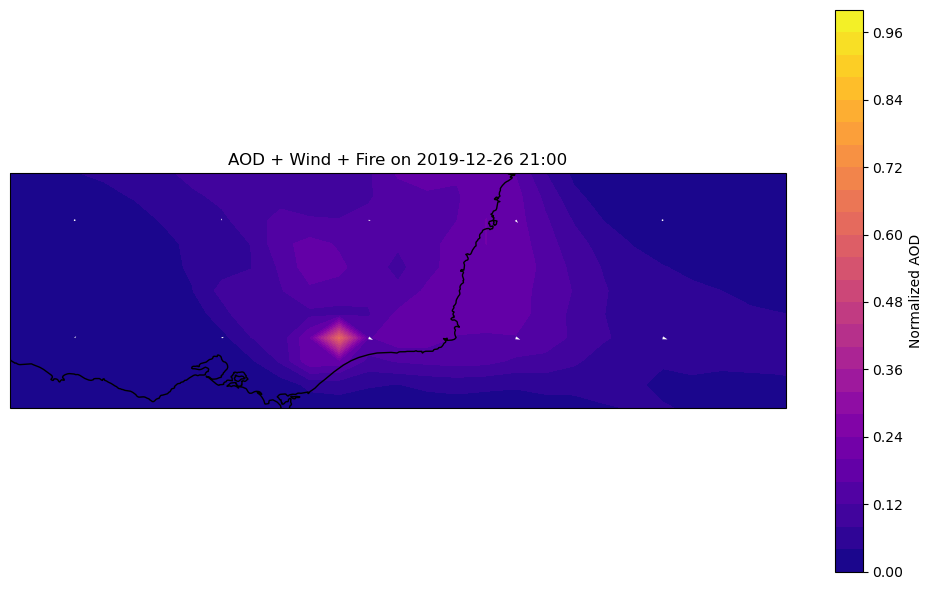

C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\573922315.py:45: RuntimeWarning: invalid value encountered in cast
  aod_times = ds_aod.variables["time"][:]   # in minutes
C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\573922315.py:45: UserWarning: WARNING: valid_range not used since it
cannot be safely cast to variable data type
  aod_times = ds_aod.variables["time"][:]   # in minutes
C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\573922315.py:56: RuntimeWarning: invalid value encountered in cast
  wind_times = ds_wind.variables["time"][:]  # in hours
C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\573922315.py:56: UserWarning: WARNING: valid_range not used since it
cannot be safely cast to variable data type
  wind_times = ds_wind.variables["time"][:]  # in hours


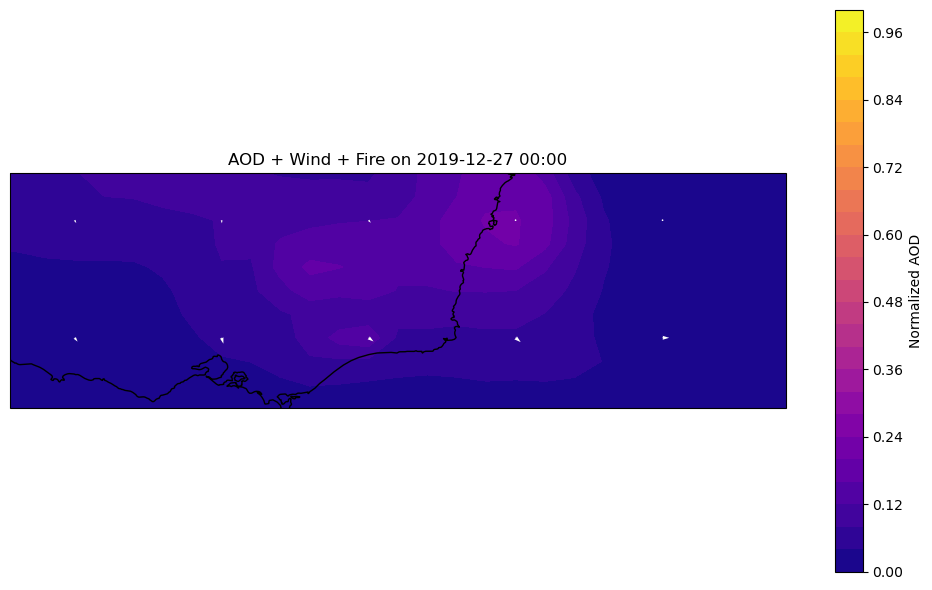

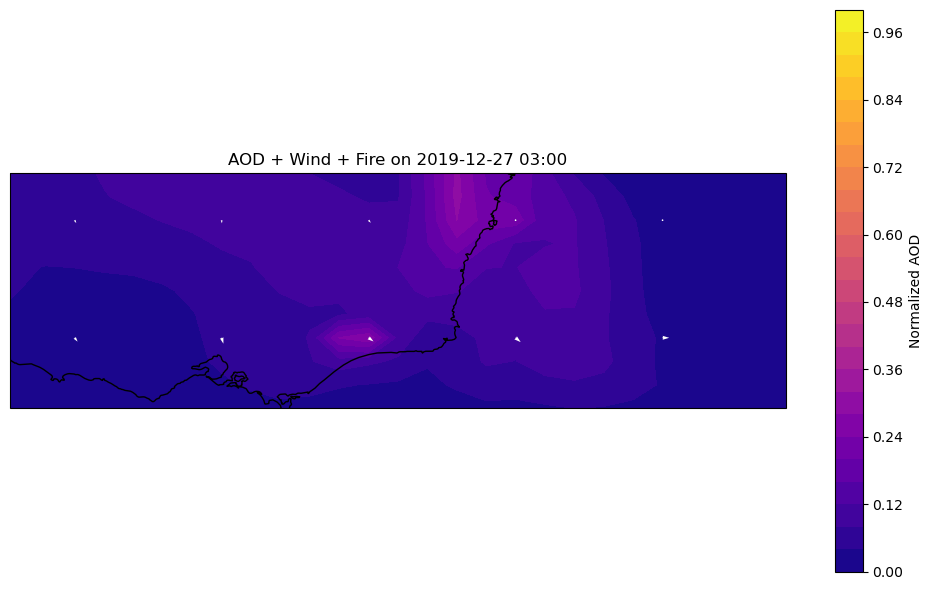

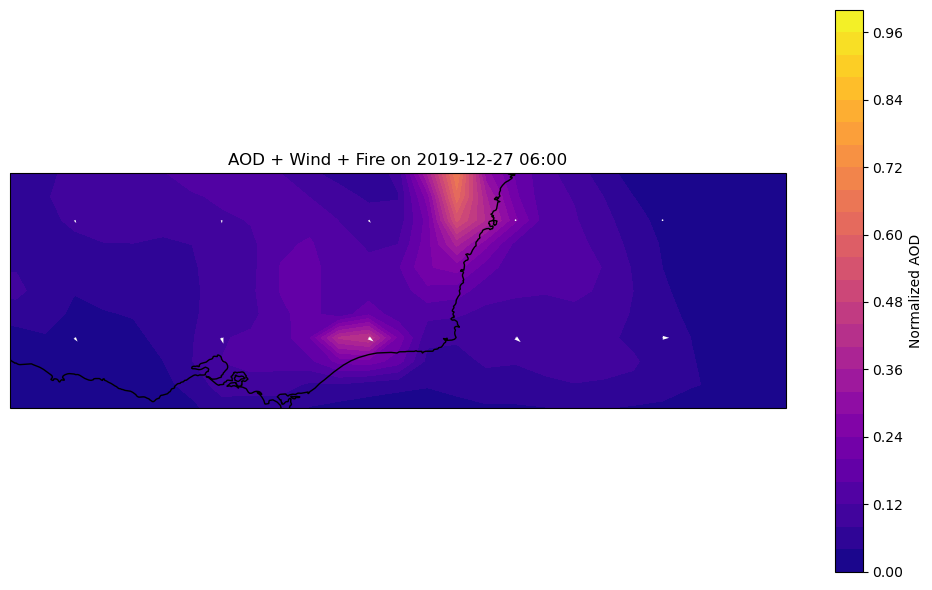

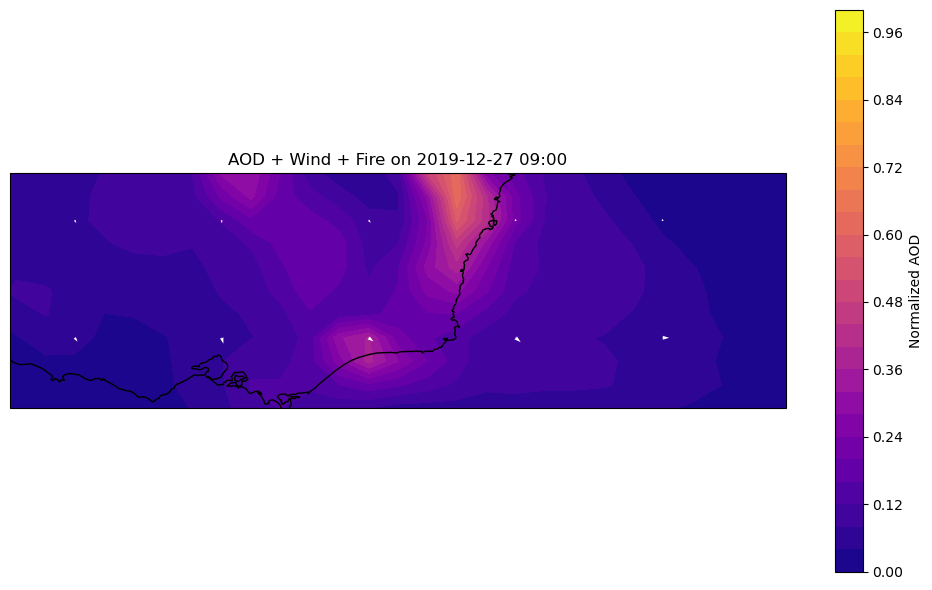

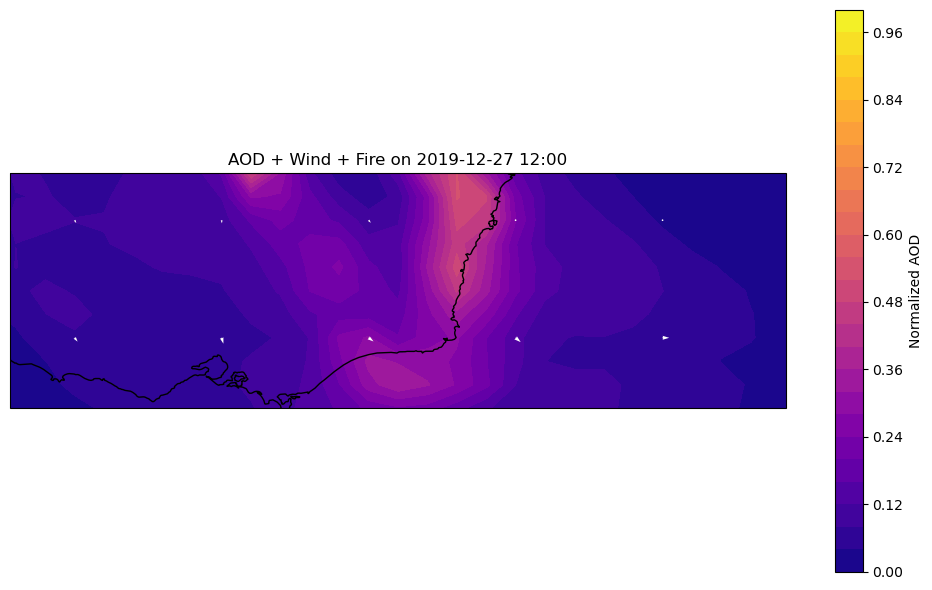

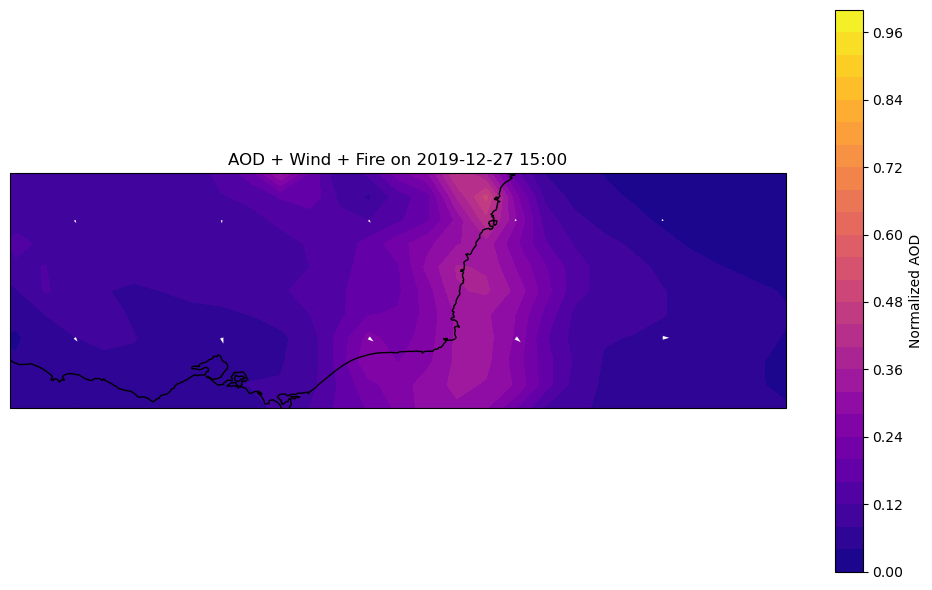

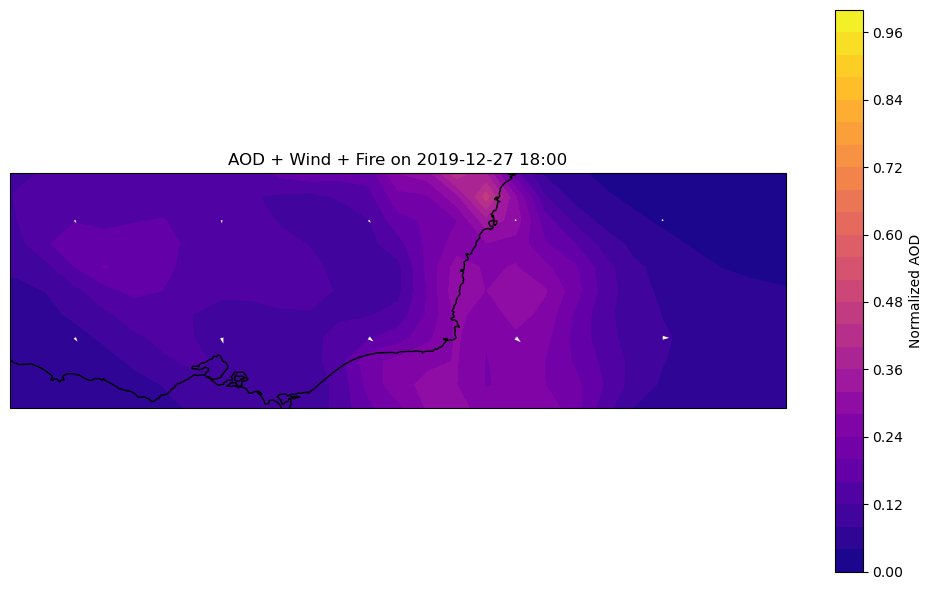

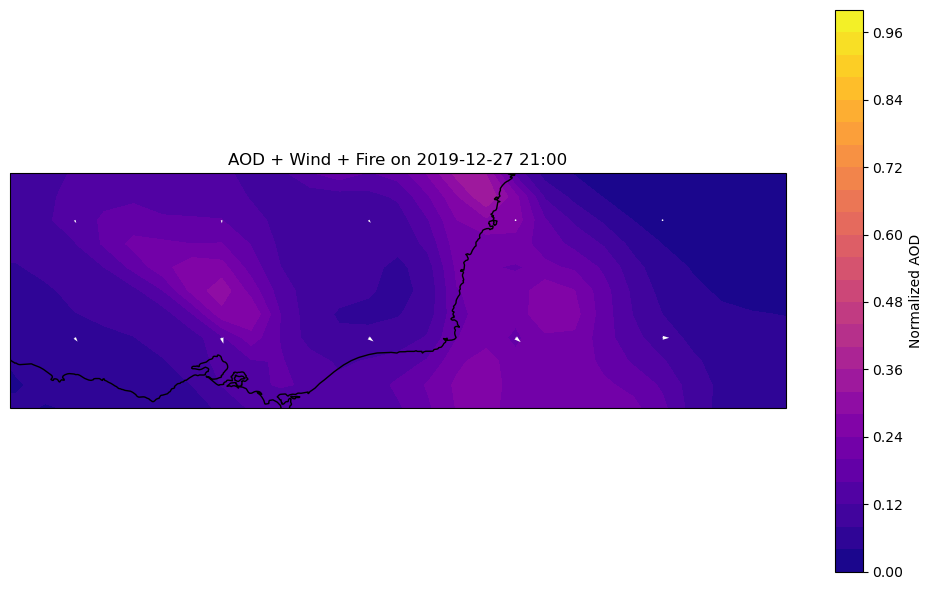

C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\573922315.py:45: RuntimeWarning: invalid value encountered in cast
  aod_times = ds_aod.variables["time"][:]   # in minutes
C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\573922315.py:45: UserWarning: WARNING: valid_range not used since it
cannot be safely cast to variable data type
  aod_times = ds_aod.variables["time"][:]   # in minutes
C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\573922315.py:56: RuntimeWarning: invalid value encountered in cast
  wind_times = ds_wind.variables["time"][:]  # in hours
C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\573922315.py:56: UserWarning: WARNING: valid_range not used since it
cannot be safely cast to variable data type
  wind_times = ds_wind.variables["time"][:]  # in hours


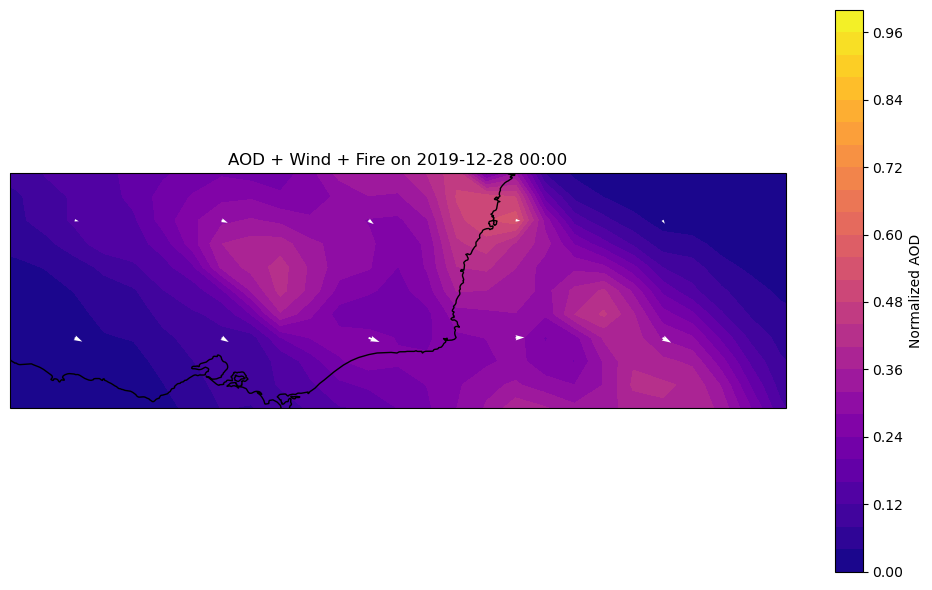

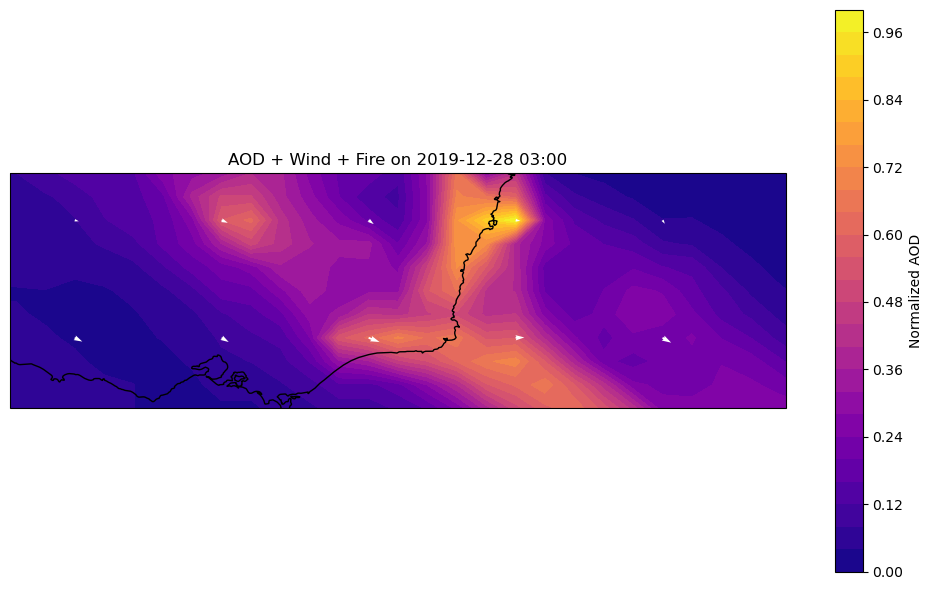

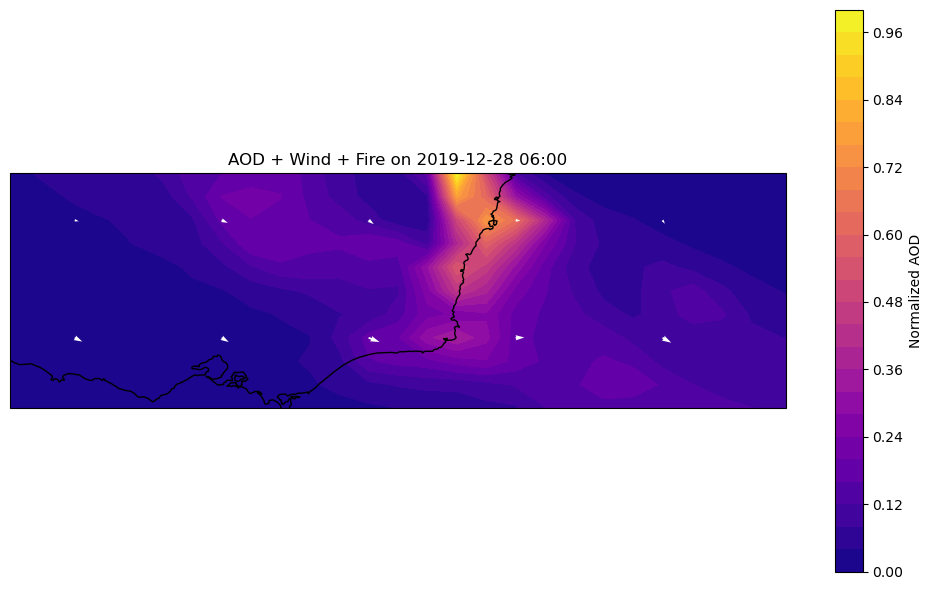

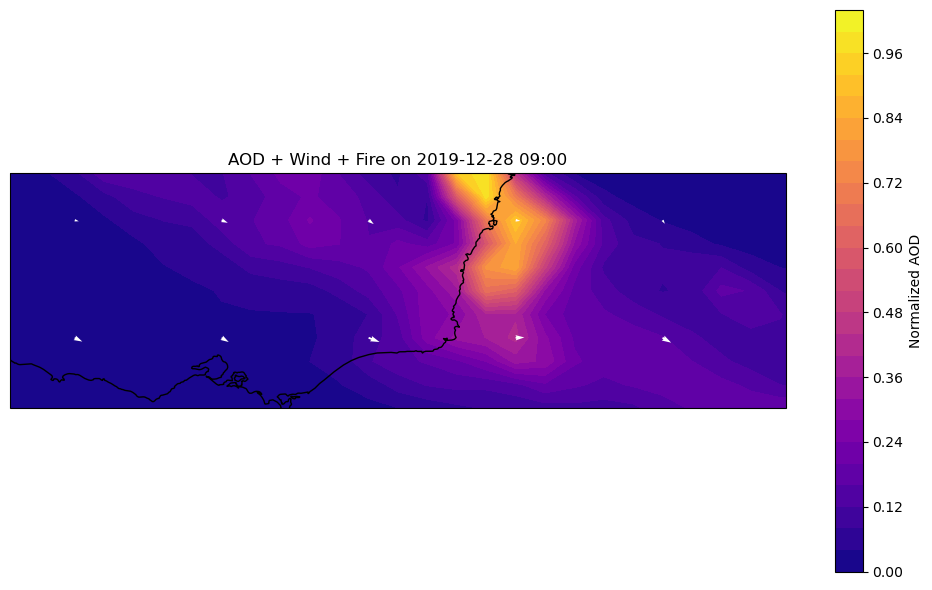

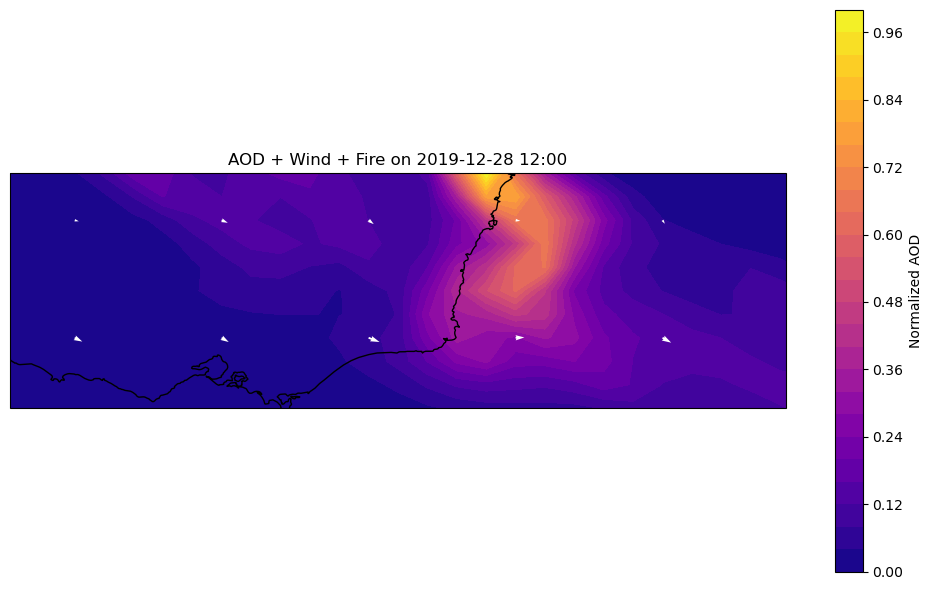

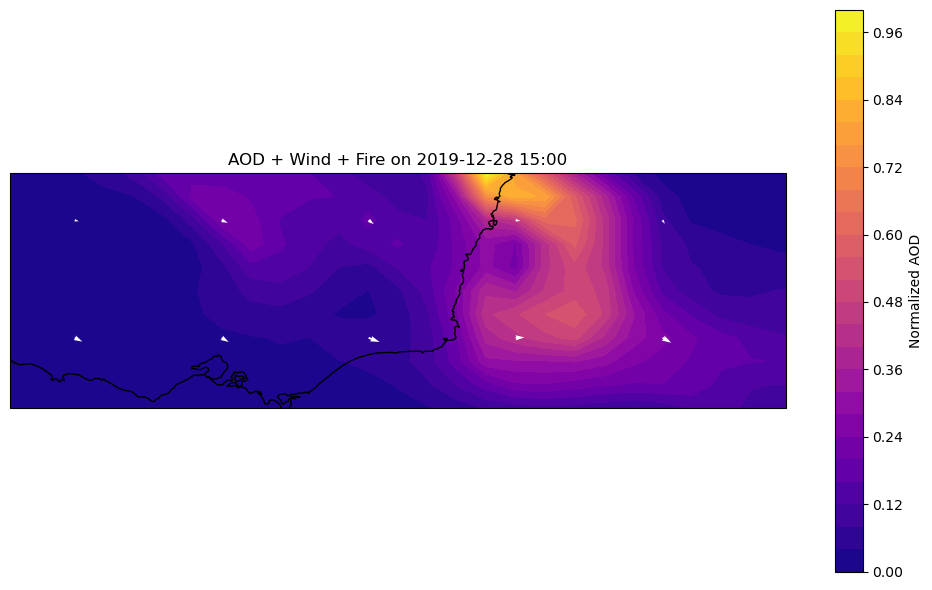

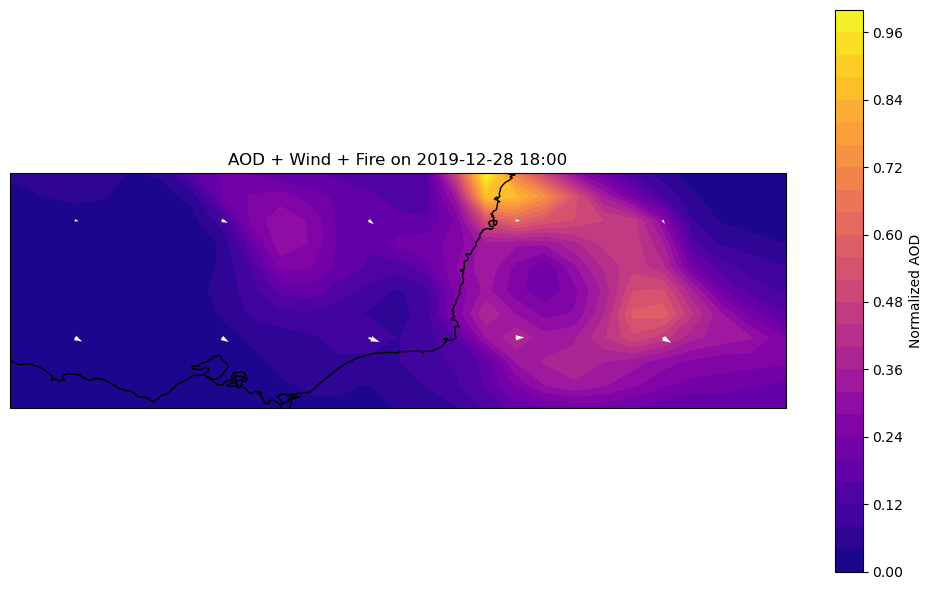

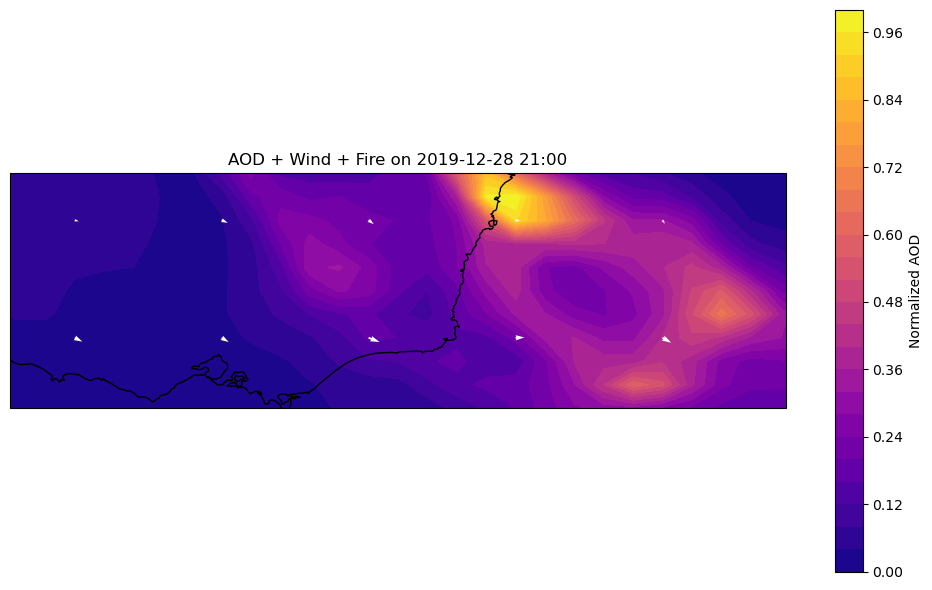

C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\573922315.py:45: RuntimeWarning: invalid value encountered in cast
  aod_times = ds_aod.variables["time"][:]   # in minutes
C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\573922315.py:45: UserWarning: WARNING: valid_range not used since it
cannot be safely cast to variable data type
  aod_times = ds_aod.variables["time"][:]   # in minutes
C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\573922315.py:56: RuntimeWarning: invalid value encountered in cast
  wind_times = ds_wind.variables["time"][:]  # in hours
C:\Users\Nur Izfarwiza\AppData\Local\Temp\ipykernel_48364\573922315.py:56: UserWarning: WARNING: valid_range not used since it
cannot be safely cast to variable data type
  wind_times = ds_wind.variables["time"][:]  # in hours


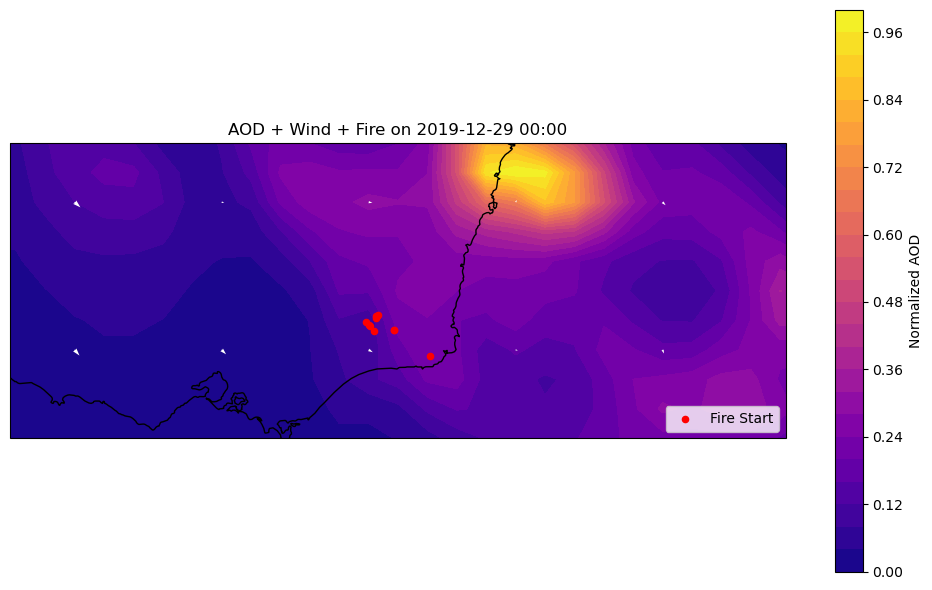

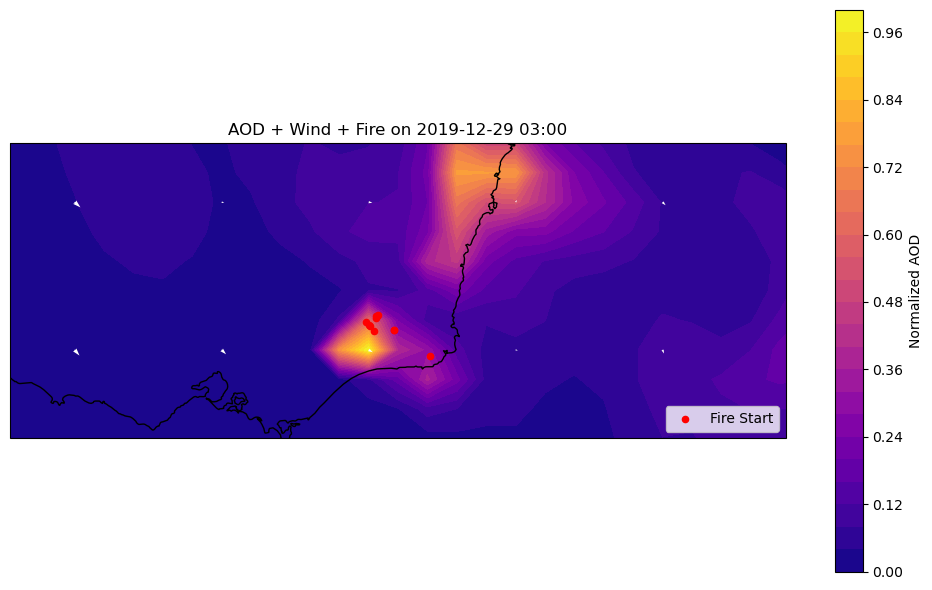

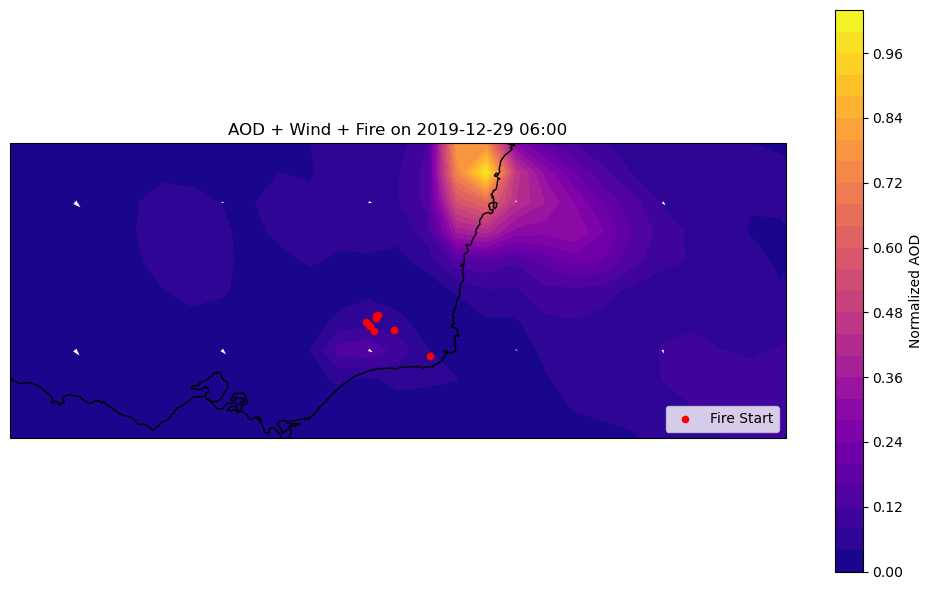

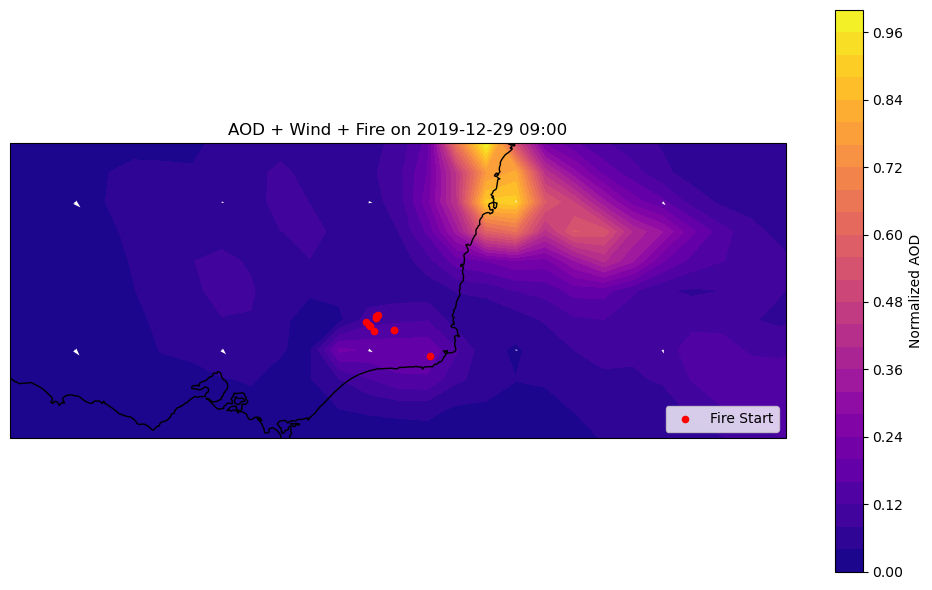

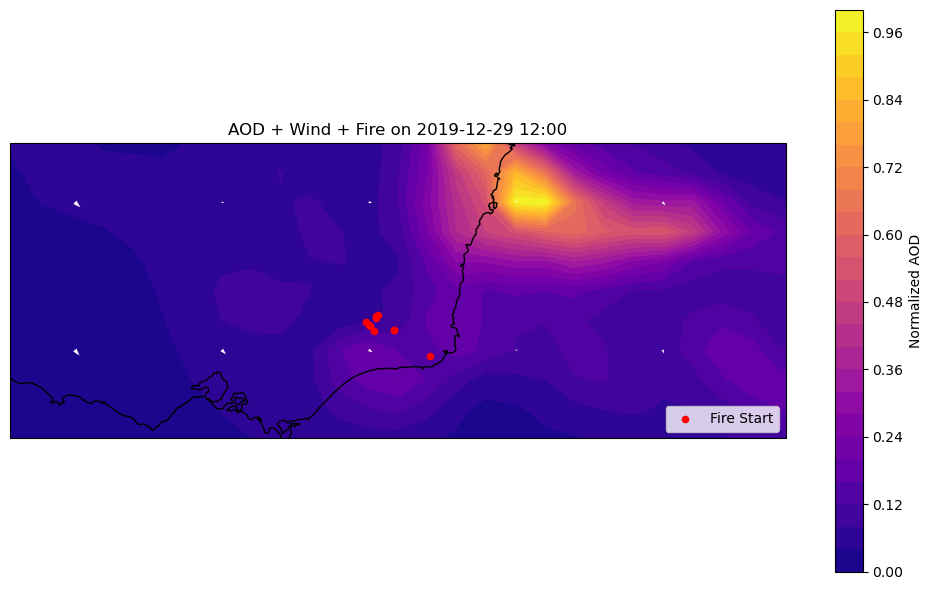

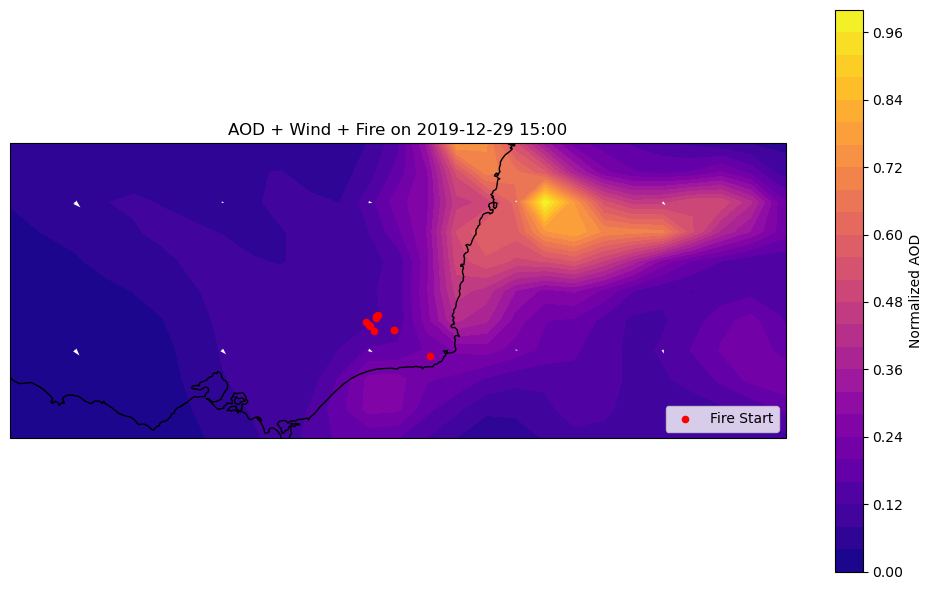

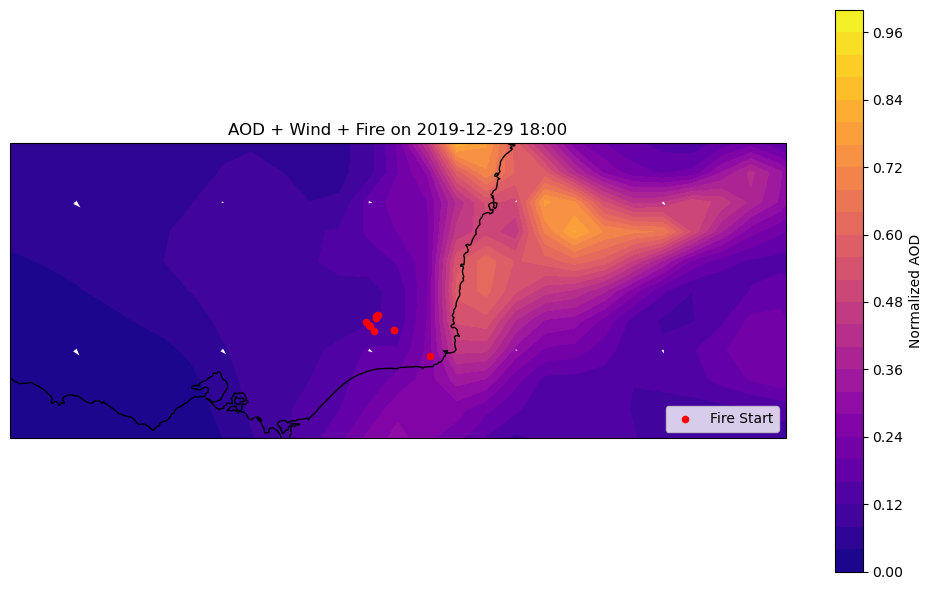

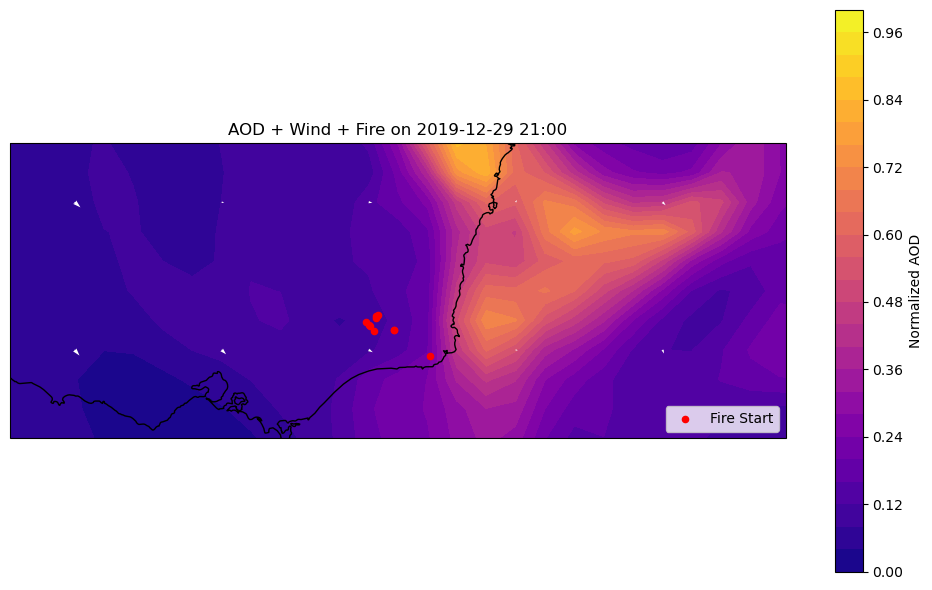

In [31]:
import geopandas as gpd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from datetime import datetime, timedelta
from netCDF4 import Dataset
import numpy as np
import os
import pandas as pd

# === Fire shapefile ===
fire_path = r"C:\Users\Nur Izfarwiza\Documents\Dissertation\Order_CD850U\mga94_54\esrishape\cma100\East Gippsland-0\FIRE\FIRE_HISTORY_ORIGIN.shp"
gdf = gpd.read_file(fire_path)
gdf = gdf.to_crs(epsg=4326)  # convert to lat/lon

# === Filter fires between Dec 2019 and Jan 2020 ===
gdf['FIRE_START'] = pd.to_datetime(gdf['FIRE_START'], errors='coerce')
filtered_fires = gdf[
    (gdf['FIRE_START'] >= '2019-12-25') & 
    (gdf['FIRE_START'] <= '2020-01-05')
]

# === AOD data config ===
start_date = datetime(2019, 12, 25)
num_days = 5
folder_path = r"C:\Users\Nur Izfarwiza\Documents\Dissertation\AOD"
file_template = "MERRA2_400.inst3_2d_gas_Nx.{}.nc4"

# === Wind Visualization Overlay ===
wind_folder_path = r"C:\Users\Nur Izfarwiza\Documents\Dissertation\Wind"
wind_template = "MERRA2_400.tavg3_3d_asm_Nv.{}.nc4"
layer = 60
step = 5

# === Loop through AOD files ===
for day_offset in range(num_days):
    date = start_date + timedelta(days=day_offset)
    date_str = date.strftime('%Y%m%d')

    # Load AOD
    aod_path = os.path.join(folder_path, file_template.format(date_str))
    if not os.path.exists(aod_path): continue
    ds_aod = Dataset(aod_path)
    aod_data = ds_aod.variables["AODANA"][:]  # shape (8, 361, 576)
    aod_times = ds_aod.variables["time"][:]   # in minutes
    aod_lats = ds_aod.variables["lat"][:]
    aod_lons = ds_aod.variables["lon"][:]
    aod_lon_grid, aod_lat_grid = np.meshgrid(aod_lons, aod_lats)

    # Load wind
    wind_path = os.path.join(wind_folder_path, wind_template.format(date_str))
    if not os.path.exists(wind_path): continue
    ds_wind = Dataset(wind_path)
    wind_lats = ds_wind.variables["lat"][:]
    wind_lons = ds_wind.variables["lon"][:]
    wind_times = ds_wind.variables["time"][:]  # in hours
    U = ds_wind.variables["U"][:, layer, :, :]
    V = ds_wind.variables["V"][:, layer, :, :]
    wind_lon_grid, wind_lat_grid = np.meshgrid(wind_lons, wind_lats)

    for t_index in range(aod_data.shape[0]):
        timestamp = date + timedelta(minutes=int(aod_times[t_index]))
        current_date = timestamp.date()

        # Find nearest wind index by time (convert AOD minutes to hours)
        wind_time_diff = np.abs(wind_times * 60 - aod_times[t_index])
        wind_index = np.argmin(wind_time_diff)

        # Prepare slices
        aod_slice = np.nan_to_num(aod_data[t_index], nan=0.0)
        norm_aod = (aod_slice - np.min(aod_slice)) / (np.max(aod_slice) + 1e-6)
        u_slice = U[wind_index][::step, ::step]
        v_slice = V[wind_index][::step, ::step]
        lon_sub = wind_lon_grid[::step, ::step]
        lat_sub = wind_lat_grid[::step, ::step]

        # Fires on this day
        daily_fires = filtered_fires[filtered_fires['FIRE_START'].dt.date == current_date]

        # === Plot ===
        plt.figure(figsize=(10, 6))
        ax = plt.axes(projection=ccrs.PlateCarree())
        ax.set_extent([140.5, 157, -39, -34])
        ax.add_feature(cfeature.COASTLINE)
        ax.add_feature(cfeature.BORDERS)
        ax.add_feature(cfeature.LAND, facecolor='lightgray')

        # AOD heatmap
        cf = ax.contourf(aod_lon_grid, aod_lat_grid, norm_aod, levels=30, cmap='plasma', transform=ccrs.PlateCarree())
        plt.colorbar(cf, ax=ax, label='Normalized AOD')

        # Wind vectors
        ax.quiver(lon_sub, lat_sub, u_slice, v_slice, transform=ccrs.PlateCarree(), color='white', scale=1000)

        # Fire overlay
        if not daily_fires.empty:
            daily_fires.plot(ax=ax, color='red', markersize=20, label='Fire Start')
            plt.legend(loc='lower right')

        plt.title(f"AOD + Wind + Fire on {timestamp.strftime('%Y-%m-%d %H:%M')}")
        plt.tight_layout()
        plt.show()

    ds_aod.close()
    ds_wind.close()
        



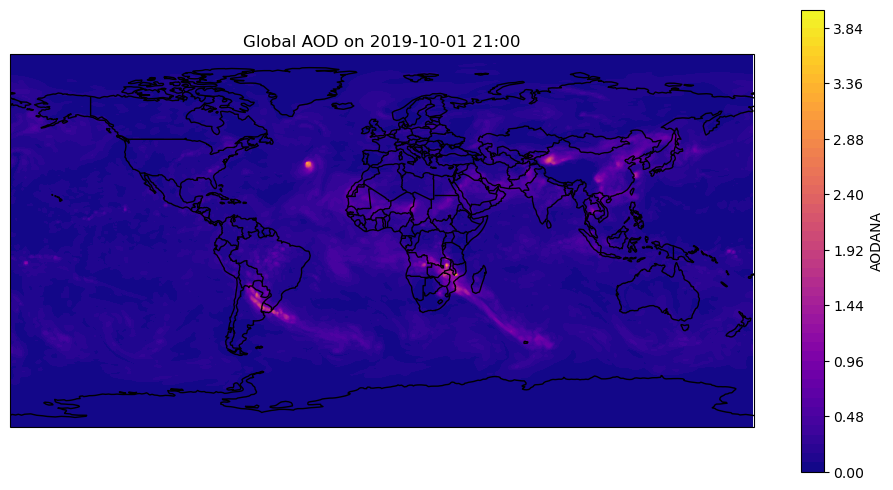

In [24]:
plt.figure(figsize=(12, 6))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_global()
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS)
cf = ax.contourf(lon_grid, lat_grid, aod_slice, transform=ccrs.PlateCarree(), cmap='plasma', levels=50)
plt.colorbar(cf, ax=ax, label='AODANA')
plt.title(f"Global AOD on {aod_time.strftime('%Y-%m-%d %H:%M')}")
plt.show()
